In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker

#plt.xkcd()

import pandas as pd
import time

idx = pd.IndexSlice
import datetime

,Fecha,Vacunas
0,2021-01-07,NaN
1,2021-01-08,0.000
2,2021-01-09,1.242
3,2021-01-10,0.000
4,2021-01-11,0.992
...,...,...
246,2021-09-10,4.692
247,2021-09-11,0.000
248,2021-09-12,0.000
249,2021-09-13,0.926


Fecha
2021-01-28    0.000
2021-01-29    0.000
2021-01-30    1.242
2021-01-31    0.000
2021-02-01    0.992
              ...  
2021-10-01    4.692
2021-10-02    0.000
2021-10-03    0.000
2021-10-04    0.926
2021-10-05    3.094
Name: Vacunas, Length: 251, dtype: float64

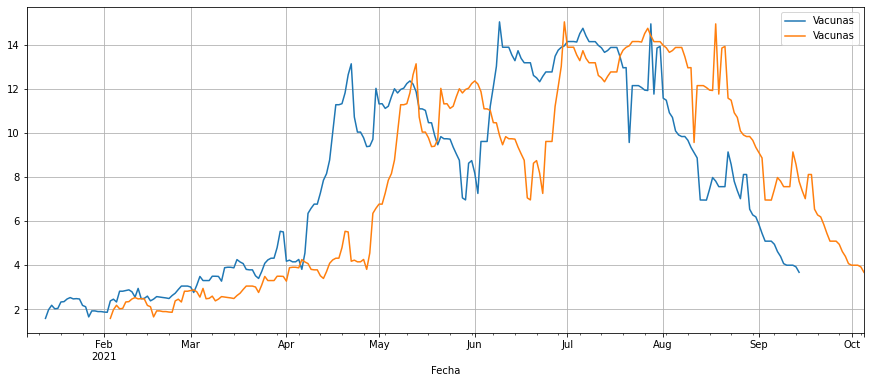

In [2]:
vacunas = pd.read_csv('Vacunas.csv',index_col='Fecha',parse_dates=True).diff()/1000.
vacunas.reset_index(inplace=True)
display(vacunas)
vacunasD = vacunas.copy()
vacunas.Fecha = vacunas.Fecha+ pd.Timedelta(21,unit='D')#21


vacunasD.set_index('Fecha',inplace=True)
vacunas.set_index('Fecha',inplace=True)
vacunasD.fillna(0,inplace=True)
vacunas.fillna(0,inplace=True)


fig, ax = plt.subplots(figsize=(15,6))
vacunasD.rolling(7,center=False).mean().plot(ax=ax)
vacunas.rolling(7,center=False).mean().plot(ax=ax)
plt.grid()
vacunas.Vacunas

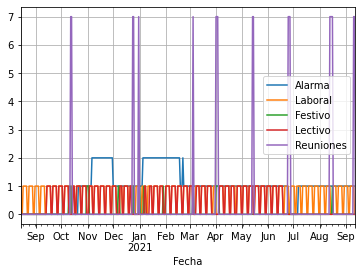

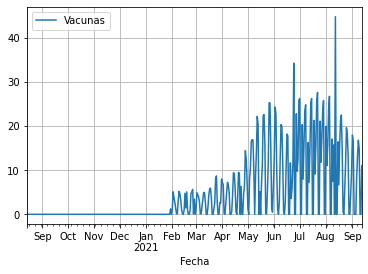

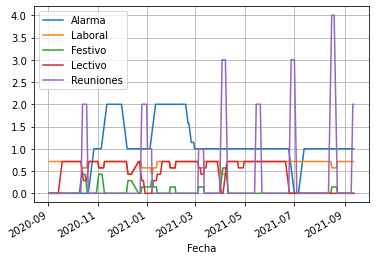

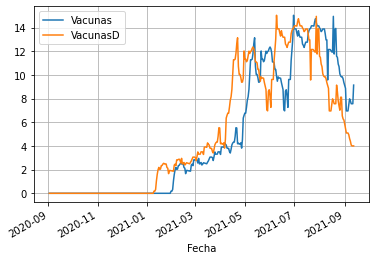

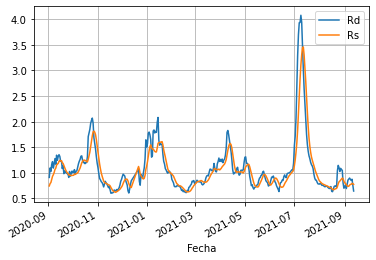

In [3]:
dateparse = lambda x: datetime.datetime.strptime(x, '%d/%m/%y')

edades = np.array([1319290,184542,123870,141711,200576,206170,176822,135180,150419])
puntos = pd.read_csv('Omega.csv',
                sep=';',
                index_col='Fecha',
                parse_dates=True,
                #infer_datetime_format=True,
                date_parser=dateparse,
                decimal=',',
               )
puntos.sort_index(inplace=True)
puntos.columns
puntos['Asintomáticos (%)'] = puntos['Asintomáticos'].copy()
puntos['Asintomáticos'] = puntos['Asintomáticos (%)']*puntos['Casos']/100
puntos['Zaragoza (%)'] = puntos['Zaragoza']/puntos['Casos']*100
puntos['UCI/Camas (%)'] = puntos['UCI ocupadas']/puntos['Camas Ocup']*100
puntos['Camas/UCI'] = puntos['Camas Ocup']/puntos['UCI ocupadas']
puntos['Casos/Camas'] = puntos['Casos']/puntos['Camas Ocup']
puntos['Camas/Casos'] = puntos['Camas Ocup']/puntos['Casos']
puntos['Camas (%)'] = puntos['Camas Ocup']/(puntos['Camas libres'])*100.
puntos['UCI (%)'] = puntos['UCI ocupadas']/(puntos['UCI libres con resp'])*100.
puntos['Día'] = np.sin((puntos['Día de la semana']-.5)*2*np.pi /7)#.plot()
puntos['Rs'] = puntos.Casos.rolling(7,center=False).sum()/puntos.Casos.shift(7).rolling(7,center=False).sum()
puntos['Rd'] = puntos.Casos/puntos.Casos.shift(7)
puntos['Bias'] = 1
puntos['Festivo'] = 0
puntos['Lectivo'] = 1
puntos.loc['2021/6/21':,'Lectivo'] = 0

#goto
#puntos.loc['2020/10/12','Festivo'] = 1 #+ puntos.loc['2020/10/10':'2020/10/14','Festivo']
#puntos.loc['2020/11/2','Festivo'] = 1 #+ puntos.loc['2020/10/31':'2020/11/2','Festivo']
puntos.loc['2020/10/10':'2020/10/12','Festivo'] = 1 #+ puntos.loc['2020/10/10':'2020/10/14','Festivo']
puntos.loc['2020/10/31':'2020/11/2','Festivo'] = 1 #+ puntos.loc['2020/10/31':'2020/11/2','Festivo']

puntos.loc['2020/12/7':'2020/12/8',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
puntos.loc['2020/12/25',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
puntos.loc['2021/1/1',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/1/6',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/1/29',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/3/5',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/4/1':'2021/4/4',
           'Festivo'] = 1
puntos.loc['2021-04-23':'2021-04-24','Festivo'] = 0
puntos.loc['2021-08-16','Festivo'] = 1

puntos['Laboral'] = 1 - puntos.Festivo/1
puntos.loc[puntos[puntos['Día de la semana'].isin([6,7])].index,
           'Laboral'] = 0


#puntos.loc['2020/10/10':'2020/10/14','Laboral'] = 0
#puntos.loc['2020/10/31':'2020/11/2','Laboral'] = 0


puntos.loc['2020/10/10':'2020/10/14','Lectivo'] = 0
puntos.loc['2020/10/31':'2020/11/2','Lectivo'] = 0
puntos.loc[:'2020/9/13','Lectivo'] = 0
puntos.loc['2020/12/7':'2020/12/8','Lectivo'] = 0
puntos.loc['2020/12/23':'2020/12/25','Lectivo'] = 0
puntos.loc['2020/12/28':'2021/1/1','Lectivo'] = 0
puntos.loc['2021/1/4':'2021/1/6','Lectivo'] = 0
puntos.loc['2020/12/23':'2021/1/6','Lectivo'] = 0
puntos.loc['2021/1/11':'2021/1/12','Lectivo'] = 0
puntos.loc['2021/1/29':'2021/1/30','Lectivo'] = 0
puntos.loc['2021/3/5':'2021/3/8','Lectivo'] = 0
puntos.loc['2021/3/29':'2021/4/4','Lectivo'] = 0
puntos.loc['2021-04-23':'2021/4/24','Lectivo'] = 0
puntos.loc['2021/6/21':,'Lectivo'] = 0

puntos.loc[puntos[puntos['Día de la semana'].isin([6,7])].index,
           'Lectivo'] = 0

puntos['NoLaboral'] = 1 - puntos.Laboral
puntos['NoLectivo'] = 1 - puntos.Lectivo

puntos['Reuniones'] = 0
puntos.loc['2020/10/12':'2020/10/13','Reuniones'] = 7
#puntos.loc['2020/10/12','Reuniones'] = 1
puntos.loc['2020/12/24':'2020/12/25','Reuniones'] = 7
#puntos.loc['2020/12/25':'2020/12/26','Reuniones'] = 1
puntos.loc['2020/12/31','Reuniones'] = 7
puntos.loc['2021/3/5','Reuniones'] = 7
puntos.loc['2021-04-01':'2021-04-03',
           'Reuniones'] = 7
puntos.loc['2021-05-14':'2021-05-15',
           'Reuniones'] = 7
puntos.loc['2021-06-25':'2021-06-27',
           'Reuniones'] = 7
#puntos.loc['2021/7/2':'2021/7/4','Reuniones'] = 7
#puntos.loc['2021/7/9':'2021/7/11','Reuniones'] = 7
#puntos.loc['2021/7/16':'2021/7/18','Reuniones'] = 7
#puntos.loc['2021/7/23':'2021/7/25','Reuniones'] = 7
#puntos.loc['2021/7/30':'2021/8/1','Reuniones'] = 7
#puntos.loc['2021/8/6':'2021/8/8','Reuniones'] = 7
puntos.loc['2021/8/13':'2021/8/16','Reuniones'] = 7
#puntos.loc['2021/8/20':'2021/8/21','Reuniones'] = 7
#puntos.loc['2021/8/27':'2021/8/28','Reuniones'] = 7
#puntos.loc['2021/9/3':'2021/9/4','Reuniones'] = 7
puntos.loc['2021/9/10':'2021/9/11','Reuniones'] = 7

puntos.loc[:,'VacunasD'] = 0.
for i in puntos.index:
    if i in vacunasD.index:
        puntos.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
puntos.loc[:,'Vacunas'] = 0.
for i in puntos.index:
    if i in vacunas.index:
        puntos.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
puntos.loc[:,'Inoculados'] = (edades[0]-1000*puntos.Vacunas.cumsum()/2.45)*100./edades[0]# + puntos.Casos.cumsum()
puntos.loc[:,'Total Casos'] = (edades[0]-puntos.Casos.cumsum()-21313)*100./edades[0] # +21.313

puntos = pd.concat([puntos,(edades[1:]*.983-puntos[['1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más']].cumsum().add_prefix('Total Casos '))/edades[1:]*100.],#/edades*100.],
         axis=1)
#puntos = pd.concat([puntos,puntos[['1 a 14 años',
#       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
#       '55 a 64 años', '65 a 74 años', '75 años o más']].cumsum().add_prefix('Total Casos ')/edades[1:]*100.],#/edades*100.],
#         axis=1)

puntos[['Alarma',
       'Laboral',
       'Festivo',
       'Lectivo',
       'Reuniones'
      ]].plot()

plt.grid()
plt.show()
puntos[['Vacunas'
      ]].plot()

plt.grid()
plt.show()


semanal = puntos.rolling(7,center=False).mean().copy()
diario = puntos.copy()
puntos = puntos.rolling(7,center=False).mean().copy().dropna()

puntos[['Alarma',
       'Laboral',
       'Festivo',
       'Lectivo',
       'Reuniones'
      ]].plot()

plt.grid()
plt.show()
puntos[['Vacunas',
        'VacunasD',
      ]].plot()

plt.grid()
plt.show()


puntos[['Rd','Rs'
      ]].plot()

plt.grid()
plt.show()
#puntos['Día'] = diario['Día']
#puntos['Alarma'] = diario.Alarma
#puntos['Festivo'] = diario['Festivo']
#puntos['Laboral'] = diario['Laboral']
#puntos['Reuniones'] = diario['Reuniones']
#puntos['Bias'] = diario['Bias']

In [4]:
diario.tail()

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-09-08,3,121,1966,2053.0,6.15,79.86,85,23,17,9,...,44.553510,87.887955,89.150863,81.358852,86.276939,89.202202,88.723437,89.302251,91.256059,89.116985
2021-09-09,4,137,1732,1828.0,7.91,76.72,100,20,13,14,...,44.094976,87.877571,89.140026,81.348357,86.267060,89.190236,88.713736,89.293768,91.250880,89.104353
2021-09-10,5,116,1909,1366.0,6.08,24.36,80,34,14,9,...,44.094976,87.868778,89.121602,81.337055,86.260709,89.178769,88.706461,89.289809,91.245702,89.100364
2021-09-11,6,60,1295,701.0,4.63,34.20,50,13,4,8,...,44.094976,87.864230,89.114557,81.333826,86.255063,89.174282,88.701125,89.286981,91.243483,89.096375
2021-09-12,7,31,816,864.0,3.80,13.95,25,7,2,2,...,43.754162,87.861880,89.110764,81.332211,86.253652,89.171789,88.698700,89.285850,91.242003,89.093716


In [5]:
nuevos = pd.read_csv('Omega_new.csv',
                sep=';',
                index_col='Fecha',
                parse_dates=True,
                #infer_datetime_format=True,
                date_parser=dateparse,
                decimal=',',
               )
nuevos.sort_index(inplace=True)
nuevos.columns
#nuevos['Camas Ocup'] = nuevos['Camas Ocup'].diff()
#nuevos['UCI ocupadas'] = nuevos['UCI ocupadas'].diff()
nuevos['Asintomáticos (%)'] = nuevos['Asintomáticos'].copy()
nuevos['Asintomáticos'] = nuevos['Asintomáticos (%)']*nuevos['Casos']/100
nuevos['Zaragoza (%)'] = nuevos['Zaragoza']/nuevos['Casos']*100
nuevos['UCI/Camas (%)'] = nuevos['UCI ocupadas']/nuevos['Camas Ocup']*100
nuevos['Camas/UCI'] = nuevos['Camas Ocup']/nuevos['UCI ocupadas']
nuevos['Casos/Camas'] = nuevos['Casos']/nuevos['Camas Ocup']
nuevos['Camas/Casos'] = nuevos['Camas Ocup']/nuevos['Casos']
nuevos['Camas (%)'] = nuevos['Camas Ocup']/(nuevos['Camas libres'])*100.
nuevos['UCI (%)'] = nuevos['UCI ocupadas']/(nuevos['UCI libres con resp'])*100.
nuevos['Día'] = np.sin((nuevos['Día de la semana']-.5)*2*np.pi /7)#.plot()
nuevos['Bias'] = 1
nuevos['Rs'] = nuevos.Casos.rolling(7,center=False).sum()/nuevos.Casos.shift(7).rolling(7,center=False).sum()
nuevos['Rd'] = nuevos.Casos/nuevos.Casos.shift(7)
nuevos['Festivo'] = 0
nuevos['Lectivo'] = 1

#nuevos.loc['2021/6/21':,'Lectivo'] = 0

#nuevos.loc['2020/12/7':'2020/12/8',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
#nuevos.loc['2020/12/25',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
#nuevos.loc['2021/1/1',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
#nuevos.loc['2021/1/6',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
#nuevos.loc['2021/3/5',
#           'Festivo'] = 1
#nuevos.loc['2021/4/1':'2021/4/4',
#           'Festivo'] = 1
#nuevos.loc['2021-04-23','Festivo'] = 0
#nuevos.loc['2021-08-16','Festivo'] = 1
nuevos['Laboral'] = 1# - nuevos.Festivo/1
nuevos.loc[nuevos[nuevos['Día de la semana'].isin([6,7])].index,
           'Laboral'] = 0

#nuevos.loc['2020/12/7':'2020/12/8','Lectivo'] = 0
#nuevos.loc['2020/12/23':'2020/12/25','Lectivo'] = 0
#nuevos.loc['2020/12/28':'2021/1/1','Lectivo'] = 0
#nuevos.loc['2021/1/4':'2021/1/6','Lectivo'] = 0
#nuevos.loc['2020/12/23':'2021/1/6','Lectivo'] = 0
#nuevos.loc['2021/1/11':'2021/1/12','Lectivo'] = 0

#nuevos.loc['2021/3/5':'2021/3/8','Lectivo'] = 0
#nuevos.loc['2021/3/29':'2021/4/4','Lectivo'] = 0
#nuevos.loc['2021-04-23':'2021/4/24','Lectivo'] = 0
nuevos.loc[nuevos[nuevos['Día de la semana'].isin([6,7])].index,
           'Lectivo'] = 0

#nuevos.loc[:'2020/9/13','Lectivo'] = 0

nuevos['NoLaboral'] = 1 - nuevos.Laboral
nuevos['NoLectivo'] = 1 - nuevos.Lectivo



nuevos['Reuniones'] = 0 
#nuevos.loc['2020/12/24':'2020/12/25','Reuniones'] = 7
##nuevos.loc['2020/12/25':'2020/12/26','Reuniones'] = 1
#nuevos.loc['2020/12/31','Reuniones'] = 7
##nuevos.loc['2020/12/24','Reuniones'] = 1
##nuevos.loc['2020/12/25','Reuniones'] = 1
##nuevos.loc['2020/12/31','Reuniones'] = 1
#nuevos.loc['2021/4/1':'2021/4/3','Reuniones'] = 7
#nuevos.loc['2021/7/2':'2021/7/4','Reuniones'] = 7
#nuevos.loc['2021/7/16':'2021/7/18','Reuniones'] = 7
#nuevos.loc['2021/8/13':'2021/8/16','Reuniones'] = 7
## esperemos que rterminen no fiestas por un tiempo 
#nuevos.loc['2021/8/20':'2021/8/21','Reuniones'] = 7



nuevos.loc[:,'VacunasD'] = np.nan
for i in nuevos.index:
    if i in vacunasD.index:
        nuevos.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
nuevos.loc[:,'Vacunas'] = np.nan
for i in nuevos.index:
    if i in vacunas.index:
        nuevos.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
nuevos.loc[:,'Inoculados'] = diario.Inoculados.iat[-1] - 1000.*nuevos.Vacunas.cumsum()/2.45*100/edades[0]
nuevos.loc[:,'Total Casos'] = diario['Total Casos'].iat[-1]-nuevos.Casos.cumsum()*100./edades[0]

nuevos = pd.concat([nuevos, diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']].iloc[-1]-nuevos[['1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más'
                                  ]].cumsum().add_prefix('Total Casos ')/edades[1:]*100. ],#/edades*100.],
         axis=1)
#nuevos = pd.concat([nuevos, diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
#       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
#       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
#       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']].iloc[-1]+nuevos[['1 a 14 años',
#       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
#       '55 a 64 años', '65 a 74 años', '75 años o más'
#                                  ]].cumsum().add_prefix('Total Casos ')/edades[1:]*100. ],#/edades*100.],
#         axis=1)


nuevos.tail(10).T


Fecha,2021-09-13,2021-09-14,2021-09-15,2021-09-16,2021-09-17,2021-09-18,2021-09-19,2021-09-20
Día de la semana,1.000000,2.000000,3.000000,4.000000e+00,5.000000,6.000000,7.000000,1.000000
Casos,121.000000,83.000000,128.000000,8.600000e+01,92.000000,61.000000,NaN,NaN
test coresp,2092.000000,1988.000000,2352.000000,1.895000e+03,2004.000000,1477.000000,NaN,NaN
Nº de pacientes a los que se ha realizado pruebas,2432.000000,2132.000000,2166.000000,1.981000e+03,2134.000000,994.000000,NaN,NaN
Tasa de positividad (%),5.780000,4.180000,5.440000,4.540000e+00,4.590000,4.130000,NaN,NaN
Asintomáticos,70.180000,37.350000,66.560000,5.074000e+01,46.000000,37.210000,NaN,NaN
Zaragoza,76.000000,54.000000,97.000000,6.000000e+01,68.000000,41.000000,NaN,NaN
1 a 14 años,31.000000,19.000000,39.000000,9.000000e+00,18.000000,11.000000,NaN,NaN
15 a 24 años,11.000000,8.000000,12.000000,9.000000e+00,9.000000,3.000000,NaN,NaN
25 a 34 años,12.000000,8.000000,7.000000,6.000000e+00,14.000000,6.000000,NaN,NaN


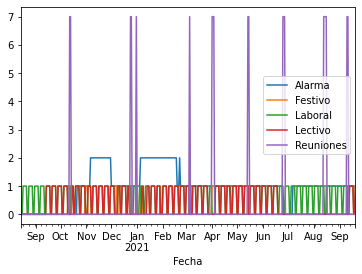

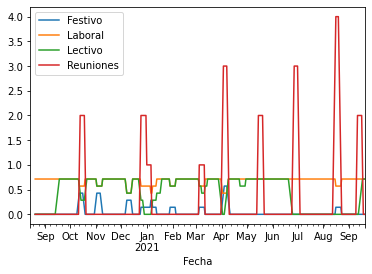

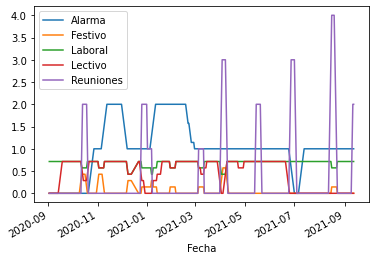

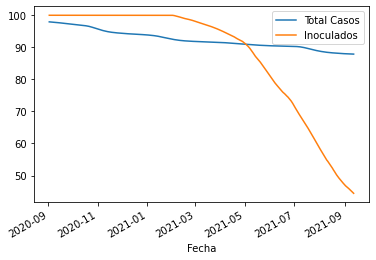

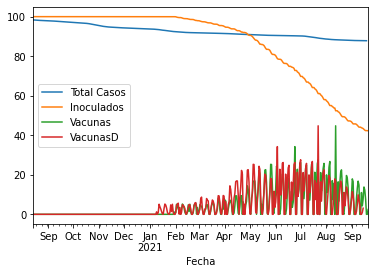

In [6]:
total = pd.concat([diario,nuevos])
total[['Alarma',
       'Festivo',
       'Laboral',
       'Lectivo',
       'Reuniones'
      ]].plot()
plt.show()
total[[
       'Festivo',
       'Laboral',
       'Lectivo',
       'Reuniones'
      ]].rolling(7,center=False).mean().plot()
plt.show()
puntos[['Alarma',
       'Festivo',
       'Laboral',
       'Lectivo',
       'Reuniones'
      ]].plot()
plt.show()
puntos[['Total Casos',
       'Inoculados',
      ]].plot()
plt.show()
total[['Total Casos',
       'Inoculados',
       'Vacunas',
       'VacunasD',
      ]].plot()
plt.show()

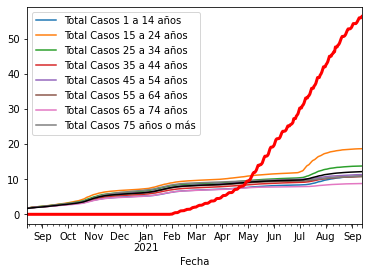

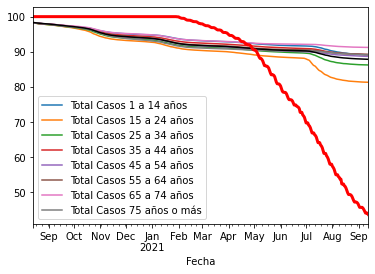

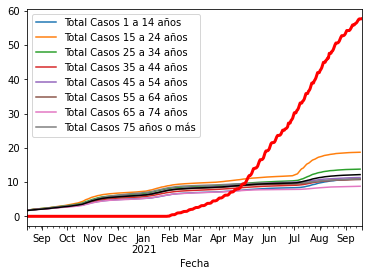

,Total Casos,Inoculados
Fecha,,
2020-08-14,98.337212,100.000000
2020-08-15,98.300677,100.000000
2020-08-16,98.271116,100.000000
2020-08-17,98.241099,100.000000
2020-08-18,98.205702,100.000000
...,...,...
2021-09-16,87.830197,42.575173
2021-09-17,87.823223,42.337692
2021-09-18,87.818599,42.337692


,Total Casos,Inoculados
Fecha,,
2021-09-13,87.852709,43.622242
2021-09-14,87.846417,43.382626
2021-09-15,87.836715,42.955000
2021-09-16,87.830197,42.575173
2021-09-17,87.823223,42.337692
2021-09-18,87.818599,42.337692
2021-09-19,NaN,42.337537
2021-09-20,NaN,42.262048


In [7]:
(100.-diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']]).plot()
(100.-diario['Total Casos']).plot(color='k')
(100.-diario['Inoculados']).plot(color='r',lw=3)
plt.show()
(diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']]).plot()
(diario['Total Casos']).plot(color='k')
(diario['Inoculados']).plot(color='r',lw=3)
plt.show()

(100-total[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']]).plot()
(100-total['Total Casos']).plot(color='k')
(100-total['Inoculados']).plot(color='r',lw=3)
plt.show()
display(total[['Total Casos','Inoculados']])
display(nuevos[['Total Casos','Inoculados']])

In [8]:

total = pd.concat([diario,nuevos])
nuevos['Rs'] = (total.Casos.rolling(7,center=False).sum()/total.Casos.shift(7).rolling(7,center=False).sum()).loc[nuevos.index]
nuevos['Rd'] = (total.Casos/total.Casos.shift(7)).loc[nuevos.index]

nuevos


,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-09-13,1,121.0,2092.0,2432.0,5.78,70.18,76.0,31.0,11.0,12.0,...,43.622242,87.852709,89.093966,81.323331,86.245184,89.160821,88.691910,89.282457,91.238304,89.087733
2021-09-14,2,83.0,1988.0,2132.0,4.18,37.35,54.0,19.0,8.0,8.0,...,43.382626,87.846417,89.083670,81.316873,86.239539,89.153841,88.687059,89.275105,91.235345,89.083744
2021-09-15,3,128.0,2352.0,2166.0,5.44,66.56,97.0,39.0,12.0,7.0,...,42.955000,87.836715,89.062536,81.307185,86.234599,89.140380,88.678329,89.270581,91.230167,89.080420
2021-09-16,4,86.0,1895.0,1981.0,4.54,50.74,60.0,9.0,9.0,6.0,...,42.575173,87.830197,89.057660,81.299919,86.230365,89.133898,88.672023,89.262097,91.226468,89.072442
2021-09-17,5,92.0,2004.0,2134.0,4.59,46.00,68.0,18.0,9.0,14.0,...,42.337692,87.823223,89.047906,81.292654,86.220486,89.128414,88.667173,89.259270,91.222770,89.061141
2021-09-18,6,61.0,1477.0,994.0,4.13,37.21,41.0,11.0,3.0,6.0,...,42.337692,87.818599,89.041945,81.290232,86.216252,89.124426,88.665718,89.256442,91.219811,89.051833
2021-09-19,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,42.337537,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-20,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,42.262048,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
display(total.columns)
edades = [1319290,184542,123870,141711,200576,206170,176822,135180,150419]
pd.concat([total,total[['1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más']].cumsum().add_prefix('Total Casos ')],#/edades*100.],
         axis=1)

Index(['Día de la semana', 'Casos', 'test coresp',
       'Nº de pacientes a los que se ha realizado pruebas',
       'Tasa de positividad (%)', 'Asintomáticos', 'Zaragoza', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'UCI ocupadas', 'UCI libres con resp', 'Alarma',
       'Asintomáticos (%)', 'Zaragoza (%)', 'UCI/Camas (%)', 'Camas/UCI',
       'Casos/Camas', 'Camas/Casos', 'Camas (%)', 'UCI (%)', 'Día', 'Rs', 'Rd',
       'Bias', 'Festivo', 'Lectivo', 'Laboral', 'NoLaboral', 'NoLectivo',
       'Reuniones', 'VacunasD', 'Vacunas', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Total Casos 65 a 74 años,Total Casos 75 años o más,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-08-14,5,624.0,4177.0,3481.0,14.94,318.24,541.0,96.0,78.0,85.0,...,98.264492,98.264765,96.0,78.0,85.0,84.0,85.0,87.0,48.0,53.0
2020-08-15,6,482.0,3243.0,1907.0,14.86,216.90,428.0,67.0,51.0,64.0,...,98.240080,98.227536,163.0,129.0,149.0,167.0,152.0,144.0,81.0,109.0
2020-08-16,7,390.0,3158.0,1168.0,12.35,230.10,338.0,53.0,54.0,38.0,...,98.209750,98.208256,216.0,183.0,187.0,237.0,203.0,196.0,122.0,138.0
2020-08-17,1,396.0,3408.0,3189.0,11.62,233.64,307.0,51.0,41.0,40.0,...,98.182379,98.177010,267.0,224.0,227.0,299.0,264.0,250.0,159.0,185.0
2020-08-18,2,467.0,4029.0,3580.0,11.59,270.86,394.0,49.0,50.0,72.0,...,98.153529,98.150418,316.0,274.0,299.0,371.0,340.0,315.0,198.0,225.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-16,4,86.0,1895.0,1981.0,4.54,50.74,60.0,9.0,9.0,6.0,...,91.226468,89.072442,17056.0,21058.0,17104.0,18385.0,19850.0,15981.0,9562.0,13880.0
2021-09-17,5,92.0,2004.0,2134.0,4.59,46.00,68.0,18.0,9.0,14.0,...,91.222770,89.061141,17074.0,21067.0,17118.0,18396.0,19860.0,15986.0,9567.0,13897.0
2021-09-18,6,61.0,1477.0,994.0,4.13,37.21,41.0,11.0,3.0,6.0,...,91.219811,89.051833,17085.0,21070.0,17124.0,18404.0,19863.0,15991.0,9571.0,13911.0


In [10]:
variables = [
    'Casos', 
    'test coresp', 'Tasa de positividad (%)',
    'Nº de pacientes a los que se ha realizado pruebas',
    'Asintomáticos', 'Asintomáticos (%)',
    'Zaragoza','Zaragoza (%)',
    '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 
    'Camas Ocup', 'Camas libres', 'Camas (%)',
    'UCI ocupadas', 'UCI libres con resp','UCI (%)',
    'Rs',
    'Rd',
    #'UCI/Camas (%)',
    #'Camas/UCI',
    #'Casos/Camas',
    #'Camas/Casos',
    #'Alarma',
    #'Día', 
    #'Bias',
    'Inoculados',
    'Total Casos',
    'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'
]
entradas = ['Alarma','Laboral','Lectivo','Reuniones','Festivo','Bias']
entradas = ['Alarma','Festivo','NoLaboral','Laboral','NoLectivo','Lectivo','Reuniones','Bias']
entradas = ['Alarma','Festivo','NoLaboral','Laboral','NoLectivo','Lectivo','Reuniones','Bias',
            'Vacunas',#'VacunasD'
            #'Inoculados'
           ]



In [11]:
def find_weekend_indices(datetime_array):
    indices=[]
    for i in range(len(datetime_array)):
        #if datetime_array[i].day_name() in ['Saturday', 'Sunday']:
        if datetime_array[i].weekday()+1 in [6,7]:
            indices.append(i)
    return indices

weekend_indices = find_weekend_indices(puntos.index)

def highlight_datetimes(index, ax,items=True):
    indices = find_weekend_indices(index)
    i = 0
    while i < len(indices):
        ax.axvspan(index[indices[i]], index[indices[i] + 1], facecolor='gray', edgecolor='none', alpha=.05)
        i += 1
    if items:
        ax.axvline(x=datetime.datetime(2020, 3, 8),ls='--',linewidth=4, color='purple',alpha=.4,label='Manifestación y Vox')
        ax.axvline(x=datetime.datetime(2020, 3, 9),linewidth=4, color='green',alpha=.4,label='PV y MD Educativo')
        ax.axvline(x=datetime.datetime(2020, 3, 12),linewidth=4, color='yellow',alpha=.4,label='AR Educativo')
        ax.axvline(x=datetime.datetime(2020, 3, 15),linewidth=4, color='r',alpha=.4,label='Estado de alarma')
        ax.axvline(x=datetime.datetime(2020, 3, 28),linewidth=4, color='brown',alpha=.4,label='Servicios no esenciales')
        ax.axvline(x=datetime.datetime(2020, 4, 26),ls='--',linewidth=4, color='orange',alpha=.4,label='Niños a la calle')
        ax.axvline(x=datetime.datetime(2020, 5, 4),ls='--',linewidth=4, color='lightblue',alpha=.4,label='Fase 0')
        ax.axvline(x=datetime.datetime(2020, 5, 11),ls='--',linewidth=4, color='blue',alpha=.4,label='Fase 1')
        ax.axvline(x=datetime.datetime(2020, 5, 25),ls='--',linewidth=4, color='darkblue',alpha=.4,label='Fase 2')
        ax.axvline(x=datetime.datetime(2020, 6, 8),ls='--',linewidth=4, color='lightgreen',alpha=.4,label='Fase 3')
        ax.axvline(x=datetime.datetime(2020, 6, 21),ls='--',linewidth=4, color='black',alpha=.4,label='Nueva Normalidad')
        ax.axvline(x=datetime.datetime(2020, 9, 14),linewidth=4, color='yellow',alpha=.4,label='Apertura AR Educativo')
        ax.axvline(x=datetime.datetime(2020, 10, 25),linewidth=4, color='darkred',alpha=.4,label='Nivel III')
        ax.axvline(x=datetime.datetime(2020, 11, 8),linewidth=4, color='brown',alpha=.4,label='nivel III Agravado')



In [12]:
repartoDiaSemana = diario[['Día de la semana']].join(diario[variables].divide(
                                                                    diario[variables].rolling(7,center=True).mean())
                                                    ).dropna().groupby(['Día de la semana']).mean()

#diario['Camas Ocup'] = diario['Camas Ocup'].diff()
#diario['UCI ocupadas'] = diario['UCI ocupadas'].diff()
#semanal['Camas Ocup'] = semanal['Camas Ocup'].diff()
#semanal['UCI ocupadas'] = semanal['UCI ocupadas'].diff()
repartoDiaSemana.loc[:,'Total Casos'] = 1#repartoDiaSemana['Total Casos']/repartoDiaSemana['Total Casos'].mean()
repartoDiaSemana.loc[:,'Inoculados'] = 1
repartoDiaSemana.loc[:,['Rs','Rd']] = 1
#repartoDiaSemana.loc[:,['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
#       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
#       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
#       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']] = 1#repartoDiaSemana['Total Casos']/repartoDiaSemana['Total Casos'].mean()


display(repartoDiaSemana)
repartoDiaSemana.mean()

,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Día de la semana,,,,,,,,,,,,,,,,,,,,,
1,0.829491,0.921424,0.910691,1.231790,0.797923,0.956308,0.763804,0.923582,0.706693,0.772879,...,1,1,1.000112,1.000208,1.000123,1.000095,1.000093,1.000086,1.000051,1.000064
2,1.198675,1.209228,0.988312,1.253640,1.169725,0.974271,1.201816,0.999828,1.265168,1.179367,...,1,1,1.000061,1.000131,1.000064,1.000040,1.000046,1.000036,1.000034,1.000044
3,1.184790,1.215304,0.979432,1.217164,1.171307,0.988476,1.203664,1.017269,1.193680,1.236678,...,1,1,1.000010,1.000014,1.000005,0.999990,0.999995,0.999990,1.000008,1.000021
4,1.209266,1.124933,1.081438,1.114404,1.233745,1.022392,1.217258,1.012385,1.226068,1.243042,...,1,1,0.999953,0.999891,0.999934,0.999954,0.999950,0.999958,0.999971,0.999961
5,1.131307,1.112551,1.025526,1.148351,1.098617,0.971491,1.137712,1.014207,1.169159,1.175408,...,1,1,0.999898,0.999787,0.999879,0.999913,0.999910,0.999921,0.999942,0.999936
6,0.858258,0.826187,1.049630,0.592501,0.942446,1.092149,0.898684,1.045888,0.928786,0.836288,...,1,1,0.999918,0.999862,0.999922,0.999952,0.999945,0.999954,0.999959,0.999948
7,0.553246,0.567493,0.961801,0.427358,0.558919,1.000614,0.544583,0.986367,0.473067,0.510999,...,1,1,1.000041,1.000089,1.000062,1.000051,1.000054,1.000048,1.000027,1.000019


Casos                                                0.995004
test coresp                                          0.996731
Tasa de positividad (%)                              0.999547
Nº de pacientes a los que se ha realizado pruebas    0.997887
Asintomáticos                                        0.996097
Asintomáticos (%)                                    1.000815
Zaragoza                                             0.995360
Zaragoza (%)                                         0.999932
1 a 14 años                                          0.994660
15 a 24 años                                         0.993523
25 a 34 años                                         0.993928
35 a 44 años                                         0.993216
45 a 54 años                                         0.996233
55 a 64 años                                         0.993686
65 a 74 años                                         0.994639
75 años o más                                        0.993636
Camas Oc

In [13]:
diario.Casos.shift(0).rolling(7,center=False).sum()/diario.Casos.shift(7).rolling(7,center=False).sum()

Fecha
2020-08-14         NaN
2020-08-15         NaN
2020-08-16         NaN
2020-08-17         NaN
2020-08-18         NaN
                ...   
2021-09-08    0.805668
2021-09-09    0.781276
2021-09-10    0.820652
2021-09-11    0.722764
2021-09-12    0.669877
Name: Casos, Length: 395, dtype: float64

In [14]:
nuevos.Casos/nuevos.Casos.shift(1)

Fecha
2021-09-13         NaN
2021-09-14    0.685950
2021-09-15    1.542169
2021-09-16    0.671875
2021-09-17    1.069767
2021-09-18    0.663043
2021-09-19         NaN
2021-09-20         NaN
Name: Casos, dtype: float64

In [15]:

#nuevos['Camas Ocup'] = nuevos['Camas Ocup'].diff()
#nuevos['UCI ocupadas'] = nuevos['UCI ocupadas'].diff()
#puntos['Camas Ocup'] = puntos['Camas Ocup'].diff()
#puntos['UCI ocupadas'] = puntos['UCI ocupadas'].diff()
total = pd.concat([diario,nuevos])
#puntos = total.rolling(7,center=False).mean().copy().dropna()
diario[variables].divide(semanal[variables]).head(10)#.columns

,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-08-14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-20,0.815867,0.921760,0.890012,1.155124,0.869139,1.054545,0.768627,0.949875,0.789216,0.821229,...,1.0,0.999097,0.999189,0.998890,0.998782,0.999159,0.999125,0.999140,0.999293,0.999205
2020-08-21,0.702324,0.856468,0.822585,1.047753,0.810898,1.140351,0.682390,0.977908,0.813031,0.656958,...,1.0,0.999185,0.999241,0.999015,0.998849,0.999302,0.999257,0.999243,0.999359,0.999193
2020-08-22,1.267818,1.317408,0.963189,0.531530,1.342138,1.057554,1.304977,1.033834,1.180233,1.302839,...,1.0,0.999105,0.999192,0.998901,0.998877,0.999235,0.999189,0.999158,0.999273,0.999093


,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-09-03,272.000000,2633.857143,10.348571,2139.714286,159.558571,58.571429,204.000000,74.923581,29.571429,29.142857,...,100.000000,97.920635,97.891498,97.727626,97.735773,97.873870,97.875039,97.836661,97.917019,97.847645
2020-09-04,260.142857,2490.428571,10.432857,2164.571429,154.922857,59.714286,192.714286,74.085108,27.857143,29.000000,...,100.000000,97.900916,97.876403,97.704214,97.713394,97.858201,97.856191,97.815574,97.900850,97.824566
2020-09-05,281.000000,2562.000000,10.852857,2109.428571,173.357143,60.571429,216.000000,76.118888,30.714286,32.285714,...,100.000000,97.879617,97.859760,97.678150,97.689401,97.841535,97.835473,97.794407,97.883518,97.798259
2020-09-06,287.428571,2528.428571,11.450000,2229.857143,169.327143,57.285714,224.000000,77.348069,31.571429,32.142857,...,100.000000,97.857830,97.842652,97.652201,97.665509,97.824156,97.813785,97.771543,97.866927,97.771761
2020-09-07,279.142857,2458.285714,11.434286,2277.000000,162.124286,56.142857,215.428571,76.327781,30.000000,30.142857,...,100.000000,97.836672,97.826395,97.627867,97.642928,97.807561,97.792652,97.749406,97.851497,97.743554
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-08,142.142857,1835.000000,7.871429,1866.000000,80.177143,57.428571,96.142857,66.768663,24.714286,15.428571,...,45.433823,87.918253,89.189182,81.394258,86.302141,89.230549,88.750391,89.322045,91.269903,89.157158
2021-09-09,134.714286,1772.571429,7.757143,1814.428571,76.827143,57.857143,91.285714,67.067695,22.142857,13.142857,...,45.199838,87.908041,89.177183,81.383648,86.293472,89.220720,88.741037,89.315662,91.264936,89.141962
2021-09-10,129.428571,1770.000000,7.491429,1702.285714,70.471429,54.428571,87.714286,67.115991,23.000000,13.142857,...,44.965853,87.898231,89.164720,81.373037,86.284903,89.210820,88.732722,89.309603,91.259863,89.128286


<AxesSubplot:xlabel='Fecha'>

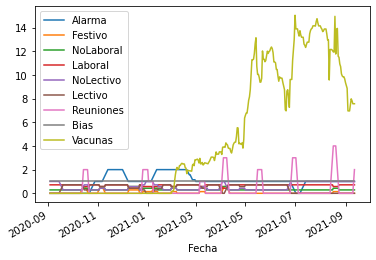

In [16]:


#entradas = ['Alarma','Festivo','Laboral','Lectivo','Reuniones','Bias']
X_prima = puntos[variables].iloc[1:].T
Omega       = puntos[variables+entradas].shift(1).iloc[1:].T
display(X_prima.T)
display(Omega.T[entradas].plot())


In [17]:
%%time 
Omega_pinv = pd.DataFrame(np.linalg.pinv(Omega),index=Omega.columns,columns=Omega.index)#.shape
Omega_pinv

CPU times: user 110 ms, sys: 12.2 ms, total: 122 ms
Wall time: 21.8 ms


,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Total Casos 75 años o más,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-09-03,0.000738,-0.000002,-0.010084,-0.000098,-0.000475,0.002583,-0.000864,-0.000961,-0.000012,0.000972,...,0.883968,0.021988,0.018867,-3.385618,-3.148417,-3.265686,-3.268350,0.002417,-6.534036,0.004118
2020-09-04,0.000885,0.000058,-0.003126,-0.000093,-0.000583,0.001841,-0.000767,-0.000057,-0.000883,0.000016,...,0.689022,0.017804,-0.022534,-4.576792,-4.484179,-4.529048,-4.531923,0.003999,-9.060971,0.001307
2020-09-05,0.001259,-0.000007,-0.008566,-0.000041,-0.000806,0.004221,-0.000662,-0.000596,-0.000419,0.000274,...,0.498135,0.030940,0.029299,-0.941787,-0.793769,-0.856045,-0.879511,-0.001294,-1.735556,0.003298
2020-09-06,0.000381,-0.000004,-0.007501,-0.000073,-0.000433,0.002864,0.000043,-0.000161,0.000036,0.000481,...,0.433006,0.018463,0.038339,-1.373734,-1.237168,-1.302863,-1.308039,-0.001789,-2.610902,0.001000
2020-09-07,0.000221,-0.000006,-0.000923,-0.000001,0.000029,-0.000057,0.000427,0.001392,-0.001078,-0.000310,...,0.308980,0.005723,0.044279,-1.616648,-1.539407,-1.561963,-1.594092,-0.000930,-3.156056,-0.002846
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-08,-0.001041,-0.000034,-0.006498,0.000026,-0.000493,0.002375,0.000232,0.001106,0.001328,0.001785,...,0.101688,-0.007677,0.044753,-0.736952,-0.732856,-0.731059,-0.738749,-0.005977,-1.469808,0.002134
2021-09-09,-0.000368,-0.000046,-0.008936,0.000058,-0.000897,0.005170,-0.000005,0.000944,0.001125,0.001543,...,-0.169773,0.004069,0.033920,1.038658,1.018861,1.045538,1.011982,-0.007426,2.057519,0.004701
2021-09-10,0.000167,-0.000042,-0.009346,0.000050,-0.000986,0.005296,-0.000256,0.001964,0.000628,0.000750,...,-0.394831,-0.005692,0.006305,0.680092,0.635316,0.674170,0.641238,-0.005956,1.315408,0.005088



$$ X' = G_{nx(n+q)} \Omega \Leftrightarrow G_{nx(n+q)} = X'\Omega^\dagger $$

In [18]:
celdas = X_prima.index


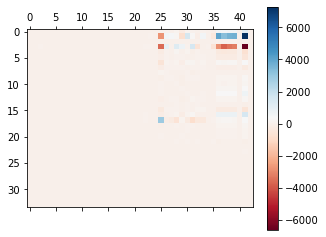

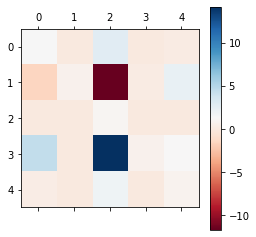

In [19]:
G = X_prima.dot( Omega_pinv)
plt.matshow(G, cmap=plt.cm.RdBu)
plt.colorbar()
plt.show()
plt.matshow(G.iloc[:5,:5], cmap=plt.cm.RdBu)
plt.colorbar()
plt.show()

Step 1
------

$$\Omega = \tilde U \tilde \Sigma \tilde V^* $$

In [20]:
%%time
U_tilde,kS_tilde,V_tilde_star = np.linalg.svd(Omega,
                          full_matrices=False)

#kS = np.einsum('ij,j->ij',
#                              np.identity(len(Sigma)),
#                              Sigma
#                             )
Sigma_tilde = pd.DataFrame(np.diag(kS_tilde),
                      index=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                      columns=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                     )

V_tilde_star = pd.DataFrame(V_tilde_star,
                            columns=Omega.columns,
                            index=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                           )

U_tilde = pd.DataFrame(U_tilde,index=Omega.index,
                      columns=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],)



print("{} = {}·{}·{}".format(Omega.shape,U_tilde.shape,Sigma_tilde.shape,V_tilde_star.shape))

(43, 367) = (43, 43)·(43, 43)·(43, 367)
CPU times: user 24.9 ms, sys: 10.4 ms, total: 35.3 ms
Wall time: 5.53 ms


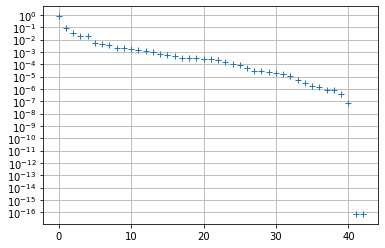

In [21]:
plt.plot(kS_tilde/kS_tilde.sum(),'+')

plt.yscale('symlog', linthresh=1.e-29)
#plt.xscale('symlog', linthreshx=50)
#plt.xlim(-1,210)
plt.grid()

In [22]:
r_tilde=np.min([len(X_prima.columns),len(X_prima.index)])#205#33#25#41#65#11#43#33
corRed_tilde = ['$P_{{{}}}$'.format(i) for i in range(r_tilde)]

Step 2
-------
$$ G_{nx(n+q)} = X'\Omega^\dagger = X' \tilde V \tilde \Sigma^{-1}\tilde U^*$$

$$ [{A}_{nxn},B_{nxq}] = [ X' \tilde V \tilde \Sigma^{-1}\tilde U^*_1, X' \tilde V \tilde \Sigma^{-1}\tilde U^*_2]$$

In [23]:
U_tilde

,$P_{0}$,$P_{1}$,$P_{2}$,$P_{3}$,$P_{4}$,$P_{5}$,$P_{6}$,$P_{7}$,$P_{8}$,$P_{9}$,...,$P_{33}$,$P_{34}$,$P_{35}$,$P_{36}$,$P_{37}$,$P_{38}$,$P_{39}$,$P_{40}$,$P_{41}$,$P_{42}$
Casos,-0.093957,-0.237862,-0.207007,0.026041,0.670923,0.068810,0.050375,-0.032916,-0.387354,0.147421,...,-0.001258,-0.001733,-1.234308e-03,-0.000596,-0.000167,-0.000077,-1.008940e-04,-2.238239e-05,1.419343e-18,3.663232e-18
test coresp,-0.691870,-0.326387,-0.348428,-0.438377,-0.314760,-0.021157,-0.005929,0.018271,-0.008547,-0.004488,...,0.000008,0.000071,4.578025e-07,-0.000014,-0.000006,0.000026,-1.256602e-05,3.119304e-06,-6.207115e-19,5.004159e-19
Tasa de positividad (%),-0.002749,0.000111,-0.003679,0.001102,0.022897,-0.004847,-0.007937,0.011019,-0.034732,-0.017506,...,0.004540,0.005192,-4.609301e-04,0.005893,-0.000791,0.007684,-1.212976e-03,4.594268e-04,-1.489159e-16,-5.833449e-17
Nº de pacientes a los que se ha realizado pruebas,-0.630135,-0.005165,0.407319,0.656783,0.019544,0.036385,-0.010506,-0.051957,0.002637,-0.022740,...,-0.000030,0.000025,1.484165e-05,0.000036,0.000019,0.000006,-3.898697e-08,-5.350085e-07,-4.446001e-19,-5.869664e-19
Asintomáticos,-0.047395,-0.130451,-0.124496,-0.003409,0.342314,-0.090438,0.123991,-0.408039,0.757295,0.099536,...,0.000776,0.000202,6.952485e-04,0.000498,-0.000117,0.000031,7.444141e-05,1.556767e-05,-5.190729e-18,-9.312646e-18
Asintomáticos (%),-0.010926,0.022399,-0.002466,-0.012489,-0.001059,-0.009245,0.017718,-0.068878,0.163384,0.158357,...,0.000990,-0.001070,-1.153825e-03,-0.001031,0.000878,0.000603,-2.126528e-04,-1.185770e-04,3.164345e-17,3.179916e-17
Zaragoza,-0.065755,-0.148943,-0.145224,0.009676,0.399742,0.121955,-0.073107,0.364065,0.060147,-0.258371,...,-0.000288,0.000118,4.938247e-04,0.000142,0.000498,0.000040,-2.055770e-05,-2.044697e-05,-1.830912e-18,-3.365580e-18
Zaragoza (%),-0.015930,0.042416,-0.001176,-0.001118,-0.037937,0.132387,0.007913,0.185712,0.126007,0.183275,...,-0.002685,-0.004268,6.457338e-04,0.000508,-0.000692,-0.000247,-5.268371e-04,4.603970e-05,-1.925971e-17,-1.398928e-17
1 a 14 años,-0.011268,-0.022563,-0.033605,-0.008707,0.035043,-0.020594,-0.180422,-0.400277,-0.212042,-0.022700,...,0.002211,-0.002110,-3.975984e-04,0.000363,-0.000876,-0.000365,4.598456e-04,-1.580245e-05,9.686160e-18,4.952668e-18
15 a 24 años,-0.014434,-0.033921,-0.167367,0.168801,0.100220,-0.718300,0.010041,0.432646,-0.004342,0.122496,...,0.001490,0.000903,8.968104e-04,0.000424,0.000075,-0.000069,3.528318e-04,1.403419e-05,1.537745e-17,2.912587e-18


In [24]:
%%time
U_tilde_r = U_tilde.loc[:,corRed_tilde]
Sigma_tilde_r = Sigma_tilde.loc[corRed_tilde,corRed_tilde]

Sigma_tilde_inv = pd.DataFrame(np.einsum('ij,j->ij',
                              np.identity(len(kS_tilde)),
                              1./kS_tilde
                             ),
                      index=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                      columns=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                     )

Sigma_tilde_inv_r = Sigma_tilde_inv.loc[corRed_tilde,corRed_tilde]
V_tilde = V_tilde_star.T
V_tilde_r = V_tilde.loc[:,corRed_tilde]

U_tilde_1 = U_tilde.loc[X_prima.index]
U_tilde_2 = U_tilde.loc[['Alarma']]
U_tilde_1_r = U_tilde_1.loc[:,corRed_tilde]
U_tilde_2_r = U_tilde_2.loc[:,corRed_tilde]

CPU times: user 2.29 ms, sys: 361 µs, total: 2.65 ms
Wall time: 2.41 ms


In [25]:
%%time
G = X_prima.dot(V_tilde_r).dot(Sigma_tilde_inv_r).dot(U_tilde_r.T)
G

CPU times: user 71.4 ms, sys: 3.2 ms, total: 74.6 ms
Wall time: 11.4 ms


,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Total Casos 75 años o más,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
Casos,1.280644,-0.010075,2.099429,0.017220,0.207309,-0.597916,-0.300757,0.163112,-1.477947e+00,0.134265,...,3.921813,-6.187160,-62.865794,29.481632,-29.910812,2.037103,-2.466283,1.509523,-0.429180,0.610703
test coresp,-1.955033,0.748249,-5.818480,0.215820,2.960077,-5.426528,1.072971,-1.770197,-4.326400e+00,1.043678,...,-1.617131,-29.211400,-405.542221,354.873919,-356.671352,-21.267848,19.470416,4.896253,-1.797432,1.086333
Tasa de positividad (%),0.006449,0.000636,1.030976,-0.000416,-0.003801,-0.021254,-0.009579,-0.003818,-1.377440e-02,0.004537,...,-0.070190,-0.400555,0.346429,-1.082664,1.090512,0.161463,-0.153614,0.025999,0.007849,0.016187
Nº de pacientes a los que se ha realizado pruebas,3.387561,0.005419,22.723133,0.770169,1.750544,-3.643098,-0.952503,4.054916,-7.049748e+00,-3.153287,...,-37.716621,45.325103,-517.549014,403.218802,-404.035100,-46.261366,45.445069,6.408497,-0.816298,3.110131
Asintomáticos,0.141147,-0.016269,0.936107,0.024308,0.938196,-0.182850,-0.038897,0.262941,-7.029570e-01,0.212636,...,0.513997,-4.749437,-26.507073,16.946065,-17.089811,2.491163,-2.634909,-0.206016,-0.143746,-0.229142
Asintomáticos (%),0.011529,0.001220,0.533676,0.001328,0.012007,0.802564,0.001735,0.108036,-3.221720e-02,0.000108,...,-0.992503,-0.168423,-0.942637,1.336890,-1.301023,0.541824,-0.505958,-0.047822,0.035867,-0.235478
Zaragoza,0.351819,-0.006886,0.794741,0.013979,0.128226,-0.074626,0.585296,0.275095,-9.787341e-01,0.082312,...,5.868284,-4.570559,-29.880124,8.719130,-9.097625,3.986455,-4.364950,0.689185,-0.378495,0.317372
Zaragoza (%),-0.000322,-0.001175,-0.427881,0.000752,-0.008131,0.070684,0.004651,0.910416,7.625051e-04,0.003302,...,0.670064,0.086615,3.726201,-2.806285,2.796581,0.798967,-0.808671,-0.208628,-0.009704,-0.063383
1 a 14 años,0.020605,-0.002356,0.378786,0.005232,0.063388,-0.090750,-0.039354,0.096517,6.981919e-01,0.006378,...,0.752904,-0.388145,-5.619616,2.909444,-2.964332,0.807325,-0.862213,0.164398,-0.054888,0.054600
15 a 24 años,0.070471,0.004879,1.235150,-0.000332,0.058732,-0.403474,-0.066613,-0.048069,-3.077199e-01,0.875595,...,-7.301482,-7.586180,-15.441365,8.418778,-8.108810,-1.845167,2.155135,0.795289,0.309968,-0.036957


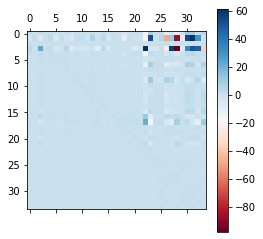

,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Casos,1.280644,-0.010075,2.099429,0.017220,0.207309,-0.597916,-0.300757,0.163112,-1.477947e+00,0.134265,...,1.025280,1.209977,-9.791821,-2.503528,-11.106559,-1.475458,10.069623,8.984741,0.869426,3.921813
test coresp,-1.955033,0.748249,-5.818480,0.215820,2.960077,-5.426528,1.072971,-1.770197,-4.326400e+00,1.043678,...,-0.431376,4.855074,-48.859437,11.900399,-86.033125,-11.358297,53.629616,60.055056,29.845597,-1.617131
Tasa de positividad (%),0.006449,0.000636,1.030976,-0.000416,-0.003801,-0.021254,-0.009579,-0.003818,-1.377440e-02,0.004537,...,0.006686,-0.022460,0.214219,-0.018521,0.147425,0.061955,-0.145275,-0.160648,-0.030682,-0.070190
Nº de pacientes a los que se ha realizado pruebas,3.387561,0.005419,22.723133,0.770169,1.750544,-3.643098,-0.952503,4.054916,-7.049748e+00,-3.153287,...,-4.487147,1.122089,-22.720020,56.644375,-97.584270,-8.557089,32.475206,50.334698,46.819344,-37.716621
Asintomáticos,0.141147,-0.016269,0.936107,0.024308,0.938196,-0.182850,-0.038897,0.262941,-7.029570e-01,0.212636,...,0.151178,0.344983,-3.141128,-0.253519,-5.380259,-0.634637,3.775815,3.730960,1.122731,0.513997
Asintomáticos (%),0.011529,0.001220,0.533676,0.001328,0.012007,0.802564,0.001735,0.108036,-3.221720e-02,0.000108,...,-0.240265,-0.128798,0.932509,1.074675,-0.157275,0.073489,-0.663763,-0.369127,0.449391,-0.992503
Zaragoza,0.351819,-0.006886,0.794741,0.013979,0.128226,-0.074626,0.585296,0.275095,-9.787341e-01,0.082312,...,1.152023,1.128971,-8.651323,-4.692797,-4.953115,-1.160555,7.789046,5.855482,-1.907734,5.868284
Zaragoza (%),-0.000322,-0.001175,-0.427881,0.000752,-0.008131,0.070684,0.004651,0.910416,7.625051e-04,0.003302,...,0.122001,0.060145,-0.233776,-1.007279,0.620481,0.068142,0.202005,-0.058721,-0.378244,0.670064
1 a 14 años,0.020605,-0.002356,0.378786,0.005232,0.063388,-0.090750,-0.039354,0.096517,6.981919e-01,0.006378,...,0.100592,0.183674,-1.234477,-0.728873,-1.040588,-0.129334,1.257689,1.061524,-0.031638,0.752904
15 a 24 años,0.070471,0.004879,1.235150,-0.000332,0.058732,-0.403474,-0.066613,-0.048069,-3.077199e-01,0.875595,...,-0.780892,-1.068349,6.893030,4.530801,-2.804176,1.077556,-3.729983,-1.739012,5.077918,-7.301482


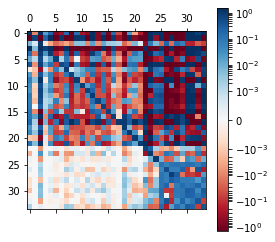

In [26]:
A = G.loc[:,celdas]
B = G.loc[:,entradas]
#D = G.loc[:,salidas]
#A_tilde[:11,:11].round(0).astype(int)

#import matplotlib.pyplot as plt
import matplotlib.colors as colors

plt.matshow(A, cmap=plt.cm.RdBu)#, vmin=-100.0, vmax=100.0)
plt.colorbar()
plt.show()
plt.matshow(A, cmap=plt.cm.RdBu,norm=colors.SymLogNorm(linthresh=1.e-3, linscale=1.0,
                                              vmin=-1.5, vmax=1.5))
plt.colorbar()
A

(34, 367) = (34, 34)·(34, 34)·(34, 367)
CPU times: user 37.8 ms, sys: 27.4 ms, total: 65.2 ms
Wall time: 11.9 ms


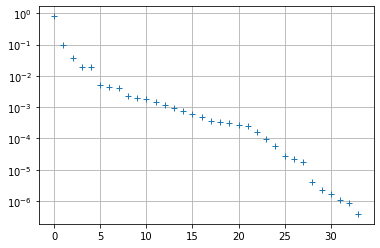

In [27]:
%%time
U_hat,kS_hat,V_hat_star = np.linalg.svd(X_prima,
                          full_matrices=False)

#kS = np.einsum('ij,j->ij',
#                              np.identity(len(Sigma)),
#                              Sigma
#                             )
Sigma_hat = pd.DataFrame(np.diag(kS_hat),
                      index=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                      columns=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                     )

V_hat_star = pd.DataFrame(V_hat_star,
                            columns=X_prima.columns,
                            index=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                           )

U_hat = pd.DataFrame(U_hat,index=X_prima.index,
                      columns=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],)

V_hat = V_hat_star.T


print("{} = {}·{}·{}".format(X_prima.shape,U_hat.shape,Sigma_hat.shape,V_hat_star.shape))
#plt.plot(Sigma/np.sum(Sigma),'+')
plt.plot(kS_hat/kS_hat.sum(),'+')

plt.yscale('symlog', linthresh=1.e-22)
#plt.xscale('symlog', linthreshx=50)
#plt.xlim(-1,200)
plt.grid()

In [28]:
#GOTO0
thresh = 1e-6#6
#np.where(kS_hat/kS_hat.sum()<thresh)[0][0]
try:
    print(np.where(kS_hat/kS_hat.sum()<thresh)[0][0])#7#33#25#41#65#11#43#33  )
except:
    print(len(kS_hat))

32


In [29]:
r=len(kS_hat)
try:
    r = np.where(kS_hat/kS_hat.sum()<thresh)[0][0]#7#33#25#41#65#11#43#33  
except:
    r=len(kS_hat)
corRed = ['$\tilde x^{{{}}}$'.format(i) for i in range(r)]
U_hat.loc[:,corRed]

,$\tilde x^{0}$,$\tilde x^{1}$,$\tilde x^{2}$,$\tilde x^{3}$,$\tilde x^{4}$,$\tilde x^{5}$,$\tilde x^{6}$,$\tilde x^{7}$,$\tilde x^{8}$,$\tilde x^{9}$,...,$\tilde x^{22}$,$\tilde x^{23}$,$\tilde x^{24}$,$\tilde x^{25}$,$\tilde x^{26}$,$\tilde x^{27}$,$\tilde x^{28}$,$\tilde x^{29}$,$\tilde x^{30}$,$\tilde x^{31}$
Casos,-0.093946,-0.237753,-0.207182,0.103012,0.663506,0.068549,-0.051593,0.030871,-0.386584,0.196487,...,0.118847,0.053143,0.001395,0.006558,0.009543,0.005572,2.970276e-03,0.001105,0.000436,0.000124
test coresp,-0.691802,-0.326507,-0.348726,-0.471571,-0.262011,-0.022823,0.005220,-0.018614,-0.008426,0.001849,...,-0.000700,0.004634,0.001037,-0.000795,-0.000039,0.000252,-5.213060e-07,0.000028,0.000027,-0.000016
Tasa de positividad (%),-0.002748,0.000101,-0.003667,0.003752,0.022622,-0.005004,0.007960,-0.011170,-0.035487,-0.017874,...,-0.024495,0.940138,0.072350,-0.204002,-0.016964,0.066273,8.109524e-03,0.003483,-0.005179,-0.003695
Nº de pacientes a los que se ha realizado pruebas,-0.630217,-0.004927,0.407423,0.654240,-0.056555,0.038327,0.011597,0.053301,0.000614,-0.022368,...,0.001335,-0.000479,-0.000375,0.000082,0.000072,-0.000157,-6.649652e-05,-0.000007,-0.000027,0.000002
Asintomáticos,-0.047378,-0.130449,-0.124596,0.037535,0.340153,-0.087130,-0.127696,0.408534,0.760499,0.066315,...,0.025933,0.023934,-0.004451,-0.009071,-0.000989,0.001542,-2.977164e-04,-0.000575,-0.000353,-0.000205
Asintomáticos (%),-0.010924,0.022390,-0.002470,-0.012073,0.000299,-0.007867,-0.017894,0.069599,0.166165,0.150620,...,-0.198167,-0.026275,0.028848,0.025867,0.016745,-0.007314,3.145969e-04,0.001045,0.000783,0.000660
Zaragoza,-0.065743,-0.148954,-0.145261,0.055974,0.395949,0.121665,0.078917,-0.364025,0.062348,-0.350121,...,0.006521,-0.063983,0.012247,0.000113,-0.014499,-0.000353,-6.300036e-04,-0.000808,-0.000190,0.000210
Zaragoza (%),-0.015933,0.042421,-0.001153,-0.005452,-0.037566,0.133891,-0.003931,-0.185845,0.136530,0.116417,...,0.058650,0.152257,-0.019798,-0.005736,0.028418,-0.003308,7.469967e-03,-0.000445,-0.000275,-0.000209
1 a 14 años,-0.011272,-0.022494,-0.033650,-0.005354,0.035967,-0.023455,0.174824,0.401421,-0.214074,-0.085556,...,-0.209203,-0.092682,-0.033971,0.007617,0.005414,-0.005268,2.507450e-03,0.000584,-0.000960,-0.000666
15 a 24 años,-0.014436,-0.033887,-0.167274,0.182375,0.079429,-0.717055,-0.012395,-0.432620,-0.000357,0.149954,...,-0.134340,-0.062254,-0.015442,-0.013022,0.005516,-0.015911,-1.921928e-03,-0.000714,-0.000322,0.000063


In [30]:
U_hat_r = U_hat.loc[:,corRed]
Sigma_hat_r = Sigma_hat.loc[corRed,corRed]

Sigma_hat_inv = pd.DataFrame(np.einsum('ij,j->ij',
                              np.identity(len(kS_hat)),
                              1./kS_hat
                             ),
                      index=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                      columns=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                     )

Sigma_hat_inv_r = Sigma_hat_inv.loc[corRed,corRed]
V_hat =   V_hat_star.T
V_hat_r = V_hat.loc[:,corRed]

$$ \tilde A \tilde = \hat U_r ^* X' \tilde V \tilde \Sigma^{-1} \tilde U_1^* \hat U_r$$
$$ \tilde B \tilde = \hat U_r ^* X' \tilde V \tilde \Sigma^{-1} \tilde U_2^* $$

$$\tilde x_{k+1} = \tilde A\tilde x_k + \tilde B u_k $$
$$ Con: x  \tilde = \hat U_r \tilde x; \tilde x = \hat U_r^* x$$

$$ x_{k+1} = A_{nxn}x_k+B_{nx1}u_k $$

$$\tilde x_{k+1} = \tilde A_{rxr}\tilde x_k + \tilde B_{rx1} u_k $$

$$ x_{k+1} \tilde = \hat U_{nxr} \tilde x_{k+1} $$

In [31]:
A_tilde = U_hat_r.T.dot(A).dot(U_hat_r.loc[celdas])
B_tilde = U_hat_r.T.dot(B)

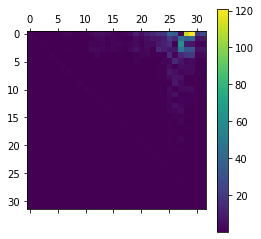

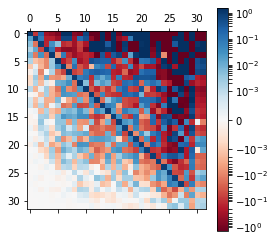

In [32]:
plt.matshow(np.absolute(A_tilde))#, cmap=plt.cm.RdBu)#, vmin=-100.0, vmax=100.0)
plt.colorbar()
plt.show()
plt.matshow(A_tilde, cmap=plt.cm.RdBu,norm=colors.SymLogNorm(linthresh=1.e-3, linscale=1.0,
                                              vmin=-1.5, vmax=1.5))
plt.colorbar()

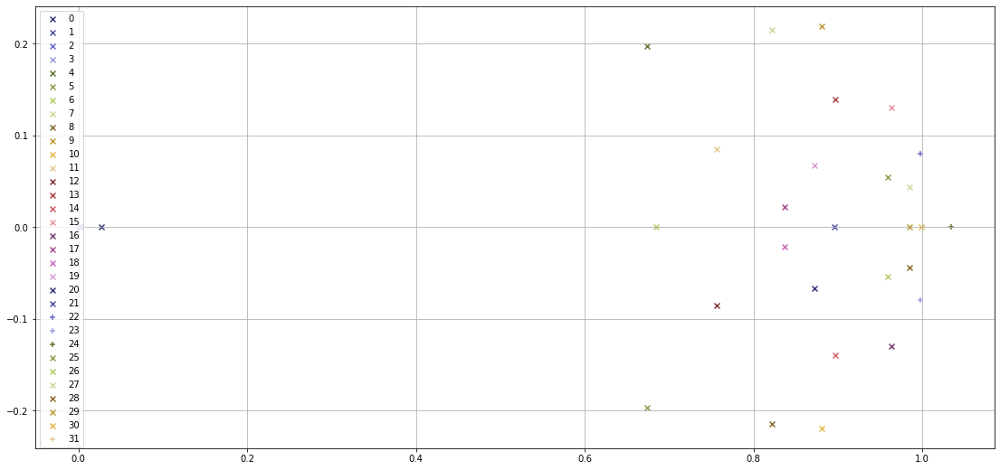

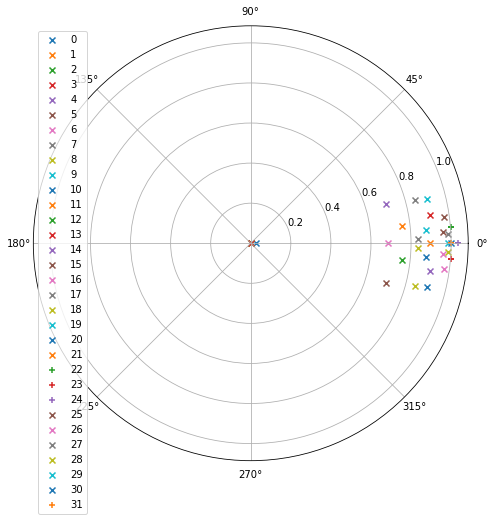

In [33]:
Lambda,W = np.linalg.eig(A_tilde)
colores = plt.cm.tab20b.colors
colores = colores + colores

fig = plt.figure(figsize=(19,9))
for i in range(len(Lambda)):
    if np.abs(Lambda[i]) >= 1:
        plt.scatter(Lambda[i].real,Lambda[i].imag,color=colores[i],label=i,marker='+')
    else:    
        plt.scatter(Lambda[i].real,Lambda[i].imag,color=colores[i],label=i,marker='x')
plt.legend(loc=2)
plt.grid()
plt.show()

#fig, ax = plt.subplots(figsize=(9, 9))
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(projection='polar')
j = 0
for i in Lambda:
    if np.abs(i) > 1:
        ax.scatter([np.angle(i)],[np.abs(i)],marker='+',label=j)
    else:
        ax.scatter([np.angle(i)],[np.abs(i)],marker='x',label=j)
    j+=1
plt.legend(loc=2)
plt.show()

In [34]:
X_interp = A.dot(Omega.loc[celdas])
puntos_int = X_interp.T.shift(1)
display(puntos.shift(-1).tail())
display(puntos_int.tail())

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-09-08,4.0,134.714286,1772.571429,1814.428571,7.757143,76.827143,91.285714,22.142857,13.142857,12.285714,...,45.199838,87.908041,89.177183,81.383648,86.293472,89.220720,88.741037,89.315662,91.264936,89.141962
2021-09-09,4.0,129.428571,1770.000000,1702.285714,7.491429,70.471429,87.714286,23.000000,13.142857,12.142857,...,44.965853,87.898231,89.164720,81.373037,86.284903,89.210820,88.732722,89.309603,91.259863,89.128286
2021-09-10,4.0,116.571429,1746.000000,1649.571429,6.688571,61.000000,81.428571,22.142857,12.142857,10.857143,...,44.731868,87.889395,89.152721,81.363234,86.277241,89.201489,88.724684,89.303867,91.255847,89.118314
2021-09-11,4.0,109.285714,1720.571429,1628.714286,6.052857,55.144286,78.142857,22.285714,11.857143,10.142857,...,44.449195,87.881111,89.140645,81.353662,86.270084,89.192515,88.716924,89.298373,91.251937,89.110621
2021-09-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-09-08,159.945155,1978.343069,8.022258,1844.343733,92.661194,56.287432,101.101414,65.269038,28.209901,27.209438,...,45.842573,87.922063,89.138655,81.405819,86.286675,89.215644,88.787894,89.343179,91.254265,89.149884
2021-09-09,154.641433,2011.143055,7.597855,1857.532232,90.413942,56.540775,99.647835,66.476510,26.535702,26.086786,...,45.595797,87.907338,89.125190,81.391562,86.278559,89.204661,88.774004,89.331838,91.247836,89.137968
2021-09-10,146.869802,2025.569895,7.001548,1912.227246,91.367948,58.874473,94.821783,66.371487,24.980906,24.664613,...,45.356156,87.895170,89.111933,81.379206,86.266425,89.195544,88.760034,89.323108,91.241421,89.122614
2021-09-11,142.754974,1985.258313,6.870958,1883.515660,89.620466,59.166293,92.402120,66.815640,23.137089,22.458607,...,45.122412,87.882641,89.103978,81.367914,86.256288,89.184801,88.743108,89.311116,91.235851,89.116491
2021-09-12,133.912543,1962.869519,6.660317,1801.240231,79.038712,55.936057,85.247874,66.688206,23.123318,23.226735,...,44.889009,87.873774,89.096965,81.357105,86.250280,89.174884,88.737062,89.296861,91.233410,89.118127


In [35]:
#for i in variables:
#    fig, ax = plt.subplots(figsize=(15,6))
#    #Omega.T[[i]].plot(ax=ax,label='{} interpolado'.format(i))
#    X_prima.T[[i]].plot(ls='-',ax=ax,label='{} interpolado'.format(i))
#    X_interp.T[[i]].plot(ls='--',ax=ax,label='{} interpolado'.format(i))
#    plt.grid()
#    plt.legend()
#    plt.show()

In [36]:
(X_interp-X_prima).divide(X_prima/100.).T.describe()

,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
count,367.000000,367.000000,367.000000,367.000000,367.000000,367.000000,367.000000,367.000000,367.000000,367.000000,...,367.000000,367.000000,367.000000,367.000000,367.000000,367.000000,367.000000,367.000000,367.000000,367.000000
mean,7.144131,6.901512,-1.332571,4.828621,12.689645,3.691778,4.440047,-1.335228,5.008599,36.247542,...,0.145548,-0.012892,-0.057202,-0.004362,-0.015698,-0.022687,0.031544,0.007688,-0.033792,-0.016897
std,6.350100,3.493547,4.012294,4.315761,11.223657,3.781314,5.786167,1.760342,7.126858,25.380035,...,0.201902,0.008325,0.025606,0.018505,0.017990,0.016033,0.038183,0.023385,0.016120,0.044468
min,-8.504529,-4.715706,-14.445726,-8.122523,-8.691257,-4.816620,-13.005423,-8.676507,-14.548715,-7.785284,...,-0.058801,-0.031949,-0.124783,-0.040670,-0.059252,-0.055905,-0.037807,-0.042331,-0.070669,-0.103809
25%,2.623874,4.672689,-4.067514,2.311131,4.685218,1.186770,0.817967,-2.192401,0.653390,14.791150,...,-0.006453,-0.016455,-0.074829,-0.015525,-0.024137,-0.033561,0.001180,-0.010630,-0.045136,-0.056817
50%,6.217397,6.551877,-1.149773,4.243423,10.569002,3.399347,3.873628,-1.320579,4.388451,31.633779,...,0.045672,-0.013066,-0.055098,-0.000740,-0.013845,-0.026117,0.019414,0.009624,-0.035588,-0.010749
75%,11.035500,8.546130,1.430443,7.014196,18.083419,6.055019,7.995265,-0.407525,8.852995,57.693071,...,0.300460,-0.009433,-0.037477,0.007276,-0.004382,-0.011492,0.069038,0.026712,-0.023168,0.016123
max,28.683437,23.961264,12.023462,23.506996,56.194951,20.387955,23.742937,8.391083,31.730828,109.517493,...,0.723723,0.111318,0.031593,0.108366,0.125970,0.080265,0.156269,0.109255,0.057258,0.195505


In [37]:
x1 = puntos[variables].T.iloc[:,-12]
display(x1)
display(puntos[variables].T.iloc[:,-11])
A.dot(x1)

Casos                                                 176.428571
test coresp                                          1915.428571
Tasa de positividad (%)                                 9.038571
Nº de pacientes a los que se ha realizado pruebas    1673.285714
Asintomáticos                                          81.127143
Asintomáticos (%)                                      46.857143
Zaragoza                                              104.285714
Zaragoza (%)                                           58.662942
1 a 14 años                                            33.285714
15 a 24 años                                           18.571429
25 a 34 años                                           18.285714
35 a 44 años                                           20.714286
45 a 54 años                                           20.714286
55 a 64 años                                           13.142857
65 a 74 años                                            6.857143
75 años o más            

Casos                                                 172.428571
test coresp                                          1898.285714
Tasa de positividad (%)                                 8.928571
Nº de pacientes a los que se ha realizado pruebas    1662.000000
Asintomáticos                                          78.077143
Asintomáticos (%)                                      46.428571
Zaragoza                                              103.857143
Zaragoza (%)                                           59.772346
1 a 14 años                                            31.000000
15 a 24 años                                           19.142857
25 a 34 años                                           15.571429
35 a 44 años                                           20.714286
45 a 54 años                                           19.428571
55 a 64 años                                           13.714286
65 a 74 años                                            7.571429
75 años o más            

Casos                                                 183.715255
test coresp                                          2053.227260
Tasa de positividad (%)                                 8.670761
Nº de pacientes a los que se ha realizado pruebas    1823.029204
Asintomáticos                                          89.212220
Asintomáticos (%)                                      49.825203
Zaragoza                                              103.518506
Zaragoza (%)                                           57.863747
1 a 14 años                                            32.022599
15 a 24 años                                           30.836611
25 a 34 años                                           19.293487
35 a 44 años                                           19.875692
45 a 54 años                                           18.276647
55 a 64 años                                           11.257742
65 a 74 años                                            6.990366
75 años o más            

,Alarma,Festivo,Reuniones,VacunasD,Vacunas,Casos,Lectivo
2021-08-29,1.0,0.0,0.0,0.005,0.028,69.0,0.0
2021-08-30,1.0,0.0,0.0,2.440,4.803,148.0,0.0
2021-08-31,1.0,0.0,0.0,7.122,9.370,219.0,0.0
2021-09-01,1.0,0.0,0.0,11.418,17.933,201.0,0.0
2021-09-02,1.0,0.0,0.0,9.476,16.574,189.0,0.0
2021-09-03,1.0,0.0,0.0,5.187,0.000,153.0,0.0
2021-09-04,1.0,0.0,0.0,0.000,0.000,150.0,0.0
2021-09-05,1.0,0.0,0.0,0.003,0.000,82.0,0.0
2021-09-06,1.0,0.0,0.0,1.448,8.211,127.0,0.0
2021-09-07,1.0,0.0,0.0,4.818,13.120,173.0,0.0


,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
2021-09-04,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,0.0,1.0,6.958286
2021-09-05,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,0.0,1.0,6.954286
2021-09-06,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,0.0,1.0,7.441143
2021-09-07,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,0.0,1.0,7.976857
2021-09-08,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,0.0,1.0,7.813429
2021-09-09,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,0.0,1.0,7.563000
2021-09-10,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,1.0,1.0,7.563000
2021-09-11,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,2.0,1.0,7.563000
2021-09-12,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,2.0,1.0,9.136714
2021-09-13,0.857143,0.0,0.285714,0.714286,0.857143,0.142857,2.0,1.0,8.572857


,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
2021-09-04,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,0.0,1.0,6.958286
2021-09-05,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,0.0,1.0,6.954286
2021-09-06,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,0.0,1.0,7.441143
2021-09-07,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,0.0,1.0,7.976857
2021-09-08,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,0.0,1.0,7.813429
2021-09-09,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,0.0,1.0,7.563000
2021-09-10,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,1.0,1.0,7.563000
2021-09-11,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,2.0,1.0,7.563000
2021-09-12,1.000000,0.0,0.285714,0.714286,1.000000,0.000000,2.0,1.0,9.136714
2021-09-13,0.857143,0.0,0.285714,0.714286,0.857143,0.142857,2.0,1.0,8.572857


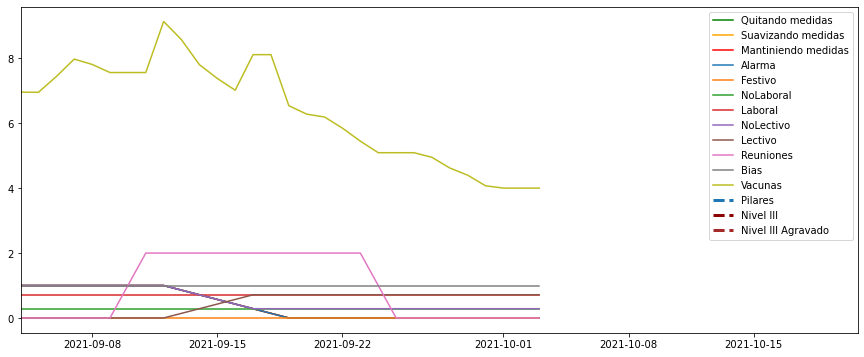

In [38]:
#x1 = puntos.loc[pd.date_range('2020-9-07',periods=83,freq='d')].copy()
x1 = puntos.loc['2020-10-21':].copy() #goto0
#x1 = puntos.loc['2020-10-7':].copy() #goto0
##x1 = puntos.loc['2020-10-1':].copy() #goto0
##x1 = puntos.loc['2020-11-1':].copy()
diasCalc = 21
x1 = puntos.iloc[-15:].copy()
#x1 = puntos.iloc[-29:].copy()
#x1 = puntos.iloc[-8:].copy()
#x1 = puntos.iloc[-1:].copy()


#x1 = puntos.loc['2021-7-1':].copy() 
U1 = x1[entradas]
U1 = total.loc[x1.index,['Alarma']]
U0 = pd.concat([U1,
    pd.DataFrame(np.ones(diasCalc)*0,index=pd.date_range(U1.index[-1]+pd.offsets.DateOffset(1),
                                   U1.index[-1]+pd.offsets.DateOffset(diasCalc)
                                  ),columns=['Alarma'])])
                                                   
U2 = pd.concat([U1,
    pd.DataFrame(np.ones(diasCalc)*0,index=pd.date_range(U1.index[-1]+pd.offsets.DateOffset(1),
                                   U1.index[-1]+pd.offsets.DateOffset(diasCalc)
                                  ),columns=['Alarma'])])
x1_0 = x1.iloc[7].copy()
U1 = pd.concat([U1,
    pd.DataFrame(np.ones(diasCalc)*0,index=pd.date_range(U1.index[-1]+pd.offsets.DateOffset(1),
                                   U1.index[-1]+pd.offsets.DateOffset(diasCalc)
                                  ),columns=['Alarma'])])
##U0.loc['2021-9-26':,'Alarma'] = 1
##U1.loc['2021-9-26':,'Alarma'] = 1
##U2.loc['2021-9-26':,'Alarma'] = 1
###
###U0.loc['2020-12-5':'2020-12-9','Alarma'] = 0
###U1.loc['2020-12-5':'2020-12-9','Alarma'] = 0
###U2.loc['2020-12-5':'2020-12-9','Alarma'] = 0
U0.Alarma.fillna(method="ffill",inplace=True)
U1.Alarma.fillna(method="ffill",inplace=True)
U2.Alarma.fillna(method="ffill",inplace=True)
#U0.Alarma.fillna(0,inplace=True)
#U1.Alarma.fillna(0,inplace=True)
#U2.Alarma.fillna(0,inplace=True)


#U1.Alarma = total.Alarma
#U0.Alarma = total.Alarma
#U2.Alarma = total.Alarma

#U1 = Al1.copy()
U1['Festivo'] = total['Festivo']
U0['Festivo'] = total['Festivo']
U2['Festivo'] = total['Festivo']

U1['Reuniones'] = total['Reuniones']
U0['Reuniones'] = total['Reuniones']
U2['Reuniones'] = total['Reuniones']

U1['VacunasD'] = total['VacunasD']
U0['VacunasD'] = total['VacunasD']
U2['VacunasD'] = total['VacunasD']


U1['Vacunas'] = total['Vacunas']
U0['Vacunas'] = total['Vacunas']
U2['Vacunas'] = total['Vacunas']

U1['Casos'] = total['Casos']
U0['Casos'] = total['Casos']
U2['Casos'] = total['Casos']




U1['Lectivo']   = total['Lectivo']

display(U1)

U1.Festivo.fillna(0,inplace=True)
#U1.loc['2021-04-23':'2021-04-24','Festivo']=1
U0['Festivo'] = U1.Festivo
U2['Festivo'] = U1.Festivo

U1.Reuniones.fillna(0,inplace=True)
U1.loc['2021-09-17':'2021-09-18','Reuniones']=7
#U1.loc['2021-09-24':'2021-09-25','Reuniones']=7
U0['Reuniones'] = U1.Reuniones
U2['Reuniones'] = U1.Reuniones

for i in U0.index:
    if i in vacunasD.index:
        #display(i)
        U0.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
        U1.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
        U2.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
U0.VacunasD.fillna(3,inplace=True)
#U0.Vacunas = 0
U1.VacunasD.fillna(5,inplace=True)
U2.VacunasD.fillna(6,inplace=True)
for i in U0.index:
    if i in vacunas.index:
        #display(i)
        U0.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
        U1.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
        U2.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
U0.Vacunas.fillna(12,inplace=True)
#U0.Vacunas = 0
U1.Vacunas.fillna(14,inplace=True)
U2.Vacunas.fillna(16,inplace=True)
U0.Casos.fillna(100,inplace=True)
U1.Casos.fillna(100,inplace=True)
U2.Casos.fillna(100,inplace=True)


U0.loc[:,'Inoculados'] = U0.Vacunas.cumsum()/2# + U0.Casos.cumsum()
U1.loc[:,'Inoculados'] = U1.Vacunas.cumsum()/2# + U1.Casos.cumsum()
U2.loc[:,'Inoculados'] = U2.Vacunas.cumsum()/2# + U2.Casos.cumsum()

U1.loc[:,'Laboral'] = 1 #- total.Festivo/7
U1.loc[U1[[(x.weekday()+1 > 5) for x in U1.index]].index,
       'Laboral' ] =0
U0['Laboral'] = U1.Laboral
U2['Laboral'] = U1.Laboral

U1.Lectivo.fillna(1,inplace=True)#llegan las vacaciones
U1.loc[U1[[(x.weekday()+1 > 5) for x in U1.index]].index,
       'Lectivo' ] =0
U1.loc['2021-06-21':'2021-09-08','Lectivo']=0 #vacaciones
U0['Lectivo'] = U1.Lectivo
U2['Lectivo'] = U1.Lectivo

U1.loc[:,'NoLectivo'] = 1-U1.Lectivo
U0.loc[:,'NoLectivo'] = U1.NoLectivo
U2.loc[:,'NoLectivo'] = U1.NoLectivo

U1.loc[:,'NoLaboral'] = 1-U1.Laboral
U0.loc[:,'NoLaboral'] = U1.NoLaboral
U2.loc[:,'NoLaboral'] = U1.NoLaboral

U0['Bias'] = 1
U1['Bias'] = 1
U2['Bias'] = 1


U0 = U0.rolling(7,center=False).mean().copy().dropna()
U1 = U1.rolling(7,center=False).mean().copy().dropna()
U2 = U2.rolling(7,center=False).mean().copy().dropna()

fig, ax = plt.subplots(figsize=(15,6))
#highlight_datetimes(pd.concat([diario.loc['2020-9-7':],U1]).index.unique(), ax,items=False)

plt.plot(U0.index,U0.Alarma,axes=ax,c='green',label='Quitando medidas')
plt.plot(U1.index,U1.Alarma,axes=ax,c='orange',label='Suavizando medidas')
plt.plot(U2.index,U2.Alarma,axes=ax,c='r',label='Mantiniendo medidas')
for i in entradas:
    plt.plot(U1.index,U1[i],axes=ax,label=i)
    
ax.axvline(pd.Timestamp('2020-10-12'),lw=3,ls='--',label='Pilares')
ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
plt.legend()
plt.xlim(left=U0.index[0])

display(U2[entradas],U1[entradas])

In [39]:
import control as ct

#C = np.identity(len(A_tilde.columns))
C = U_hat_r.loc[celdas]
D = np.zeros((len(A_tilde.columns),len(B_tilde.columns)))

In [40]:
fsys_A_tilde = ct.ss(A_tilde,B_tilde,C,np.zeros((len(C.index),len(B_tilde.columns))),1)

In [41]:
np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),x1[entradas].T.values
np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0,0,1]))

array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]])

In [42]:
%time
Ukk = U1.copy()
Ukk.Alarma=0
Ukk.Vacunas = 0
t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=np.arange(len(Ukk.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(U1.index)),[0,0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=Ukk[entradas].T.values, 
                         #U=x1[[entradas]].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]).values)
noAction = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(noAction.T)

CPU times: user 1 µs, sys: 1 µs, total: 2 µs
Wall time: 1.91 µs


,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-09-04,163.142858,1853.857143,8.805717,1759.142857,85.181428,53.428572,103.714285,62.269340,27.714284,17.142855,...,46.152535,87.957641,89.232684,81.432440,86.330201,89.264195,88.778118,89.341052,91.287259,89.206937
2021-09-05,156.562756,1827.116405,8.877487,1627.323056,88.886165,55.473221,100.427492,63.423065,26.477964,24.337499,...,46.071479,87.946666,89.209271,81.415784,86.336048,89.263614,88.807579,89.347025,91.273898,89.151439
2021-09-06,150.418060,1786.552772,8.929215,1547.814901,90.068354,57.096395,97.985674,64.539391,24.857215,32.085782,...,45.992556,87.938068,89.203694,81.388342,86.335050,89.257839,88.797470,89.337832,91.267865,89.158359
2021-09-07,145.526723,1744.928231,8.940125,1501.294024,90.820943,58.425902,97.042772,65.706901,23.165356,39.794175,...,45.914646,87.930944,89.200306,81.354752,86.335738,89.252634,88.789523,89.331232,91.262387,89.169243
2021-09-08,141.895094,1709.783009,8.890848,1475.297920,92.113403,59.565261,97.440239,66.931360,21.565093,46.996803,...,45.837833,87.924845,89.198255,81.315557,86.336468,89.247677,88.783419,89.326963,91.257864,89.182751
2021-09-09,138.975144,1683.557074,8.769565,1460.008253,94.135830,60.580413,98.612250,68.195890,20.121197,53.300215,...,45.761889,87.919409,89.196969,81.271458,86.336540,89.242929,88.778983,89.324626,91.254436,89.197902
2021-09-10,135.960848,1665.254410,8.571210,1448.061197,96.610366,61.506871,99.831232,69.476204,18.837087,58.393227,...,45.686475,87.914440,89.196040,81.223442,86.335577,89.238497,88.776156,89.323952,91.252200,89.214033
2021-09-11,133.497212,1656.713797,8.322194,1440.583554,98.822167,62.311109,101.050748,70.539907,17.844456,62.844129,...,45.605756,87.911103,89.194921,81.174541,86.330292,89.235788,88.778490,89.327579,91.251415,89.229012
2021-09-12,131.195416,1654.447585,8.031705,1434.479799,100.622553,62.999723,101.922499,71.385664,17.095028,66.417572,...,45.519841,87.908896,89.192878,81.123998,86.324573,89.234980,88.783129,89.333360,91.252951,89.244900
2021-09-13,127.145579,1649.158213,7.686103,1420.502416,102.034590,63.625261,101.408912,72.220700,16.367084,68.143451,...,45.434335,87.906638,89.190213,81.070839,86.321646,89.234795,88.786464,89.338462,91.256519,89.263473


In [43]:
%%time 
t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=range(len(U1.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=U1[entradas].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]))


kControl = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(kControl.T)


t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=range(len(U1.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=U0[entradas].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]))


rellaxed = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(rellaxed.T)


t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=range(len(U1.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=U2[entradas].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]))


hard = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(hard.T)

,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-09-04,163.142858,1853.857143,8.805717,1759.142857,85.181428,53.428572,103.714285,62.269340,27.714284,17.142855,...,46.152535,87.957641,89.232684,81.432440,86.330201,89.264195,88.778118,89.341052,91.287259,89.206937
2021-09-05,154.625038,1805.464017,8.589585,1694.289336,82.542295,53.666275,98.065297,63.068637,26.469737,16.494160,...,45.930629,87.946315,89.213136,81.422456,86.312676,89.249770,88.774123,89.342594,91.284070,89.179360
2021-09-06,146.333781,1762.794888,8.339184,1646.076979,79.191926,53.720446,92.707455,63.876240,25.291651,15.590939,...,45.709261,87.933205,89.202480,81.407369,86.302382,89.238387,88.760833,89.329411,91.277462,89.172294
2021-09-07,138.362608,1725.026007,8.070657,1608.131310,75.340238,53.545102,87.729472,64.684772,24.213917,14.295124,...,45.476379,87.920559,89.194263,81.392273,86.292116,89.225711,88.744158,89.315390,91.270932,89.170224
2021-09-08,130.613573,1691.766743,7.791160,1576.926436,71.167390,53.203765,82.995964,65.481123,23.229568,12.625088,...,45.230486,87.908225,89.186631,81.378191,86.281480,89.212651,88.726655,89.301628,91.264707,89.169044
2021-09-09,122.527721,1661.371342,7.495741,1548.024611,66.899798,52.917259,78.133740,66.295641,22.282733,10.657676,...,44.987653,87.896591,89.177264,81.366677,86.271594,89.201383,88.713357,89.290205,91.259019,89.163131
2021-09-10,113.864245,1632.182709,7.184036,1520.636960,62.485076,52.720918,72.951761,67.117753,21.346680,8.383744,...,44.749942,87.885813,89.168158,81.357242,86.262435,89.190934,88.700995,89.279787,91.253727,89.157181
2021-09-11,106.084008,1607.700910,6.886454,1501.050615,57.568451,52.509176,68.072056,67.715404,20.578127,6.555830,...,44.505966,87.876973,89.160021,81.351416,86.250638,89.181747,88.691047,89.272218,91.248875,89.151825
2021-09-12,99.433707,1587.204834,6.609141,1488.503154,52.513066,52.291170,63.681451,68.104663,19.959951,5.078480,...,44.256002,87.869504,89.151426,81.347731,86.240281,89.174340,88.682107,89.265962,91.245335,89.147321
2021-09-13,93.497379,1566.397787,6.357300,1480.154231,47.454795,51.753278,59.669290,68.405225,19.395263,3.001418,...,43.969084,87.861101,89.147153,81.341451,86.231976,89.162942,88.660146,89.253683,91.242272,89.156308


,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-09-04,163.142858,1853.857143,8.805717,1759.142857,85.181428,53.428572,103.714285,62.269340,27.714284,17.142855,...,46.152535,87.957641,89.232684,81.432440,86.330201,89.264195,88.778118,89.341052,91.287259,89.206937
2021-09-05,154.625038,1805.464017,8.589585,1694.289336,82.542295,53.666275,98.065297,63.068637,26.469737,16.494160,...,45.930629,87.946315,89.213136,81.422456,86.312676,89.249770,88.774123,89.342594,91.284070,89.179360
2021-09-06,146.333781,1762.794888,8.339184,1646.076979,79.191926,53.720446,92.707455,63.876240,25.291651,15.590939,...,45.709261,87.933205,89.202480,81.407369,86.302382,89.238387,88.760833,89.329411,91.277462,89.172294
2021-09-07,138.362608,1725.026007,8.070657,1608.131310,75.340238,53.545102,87.729472,64.684772,24.213917,14.295124,...,45.476379,87.920559,89.194263,81.392273,86.292116,89.225711,88.744158,89.315390,91.270932,89.170224
2021-09-08,130.613573,1691.766743,7.791160,1576.926436,71.167390,53.203765,82.995964,65.481123,23.229568,12.625088,...,45.230486,87.908225,89.186631,81.378191,86.281480,89.212651,88.726655,89.301628,91.264707,89.169044
2021-09-09,122.527721,1661.371342,7.495741,1548.024611,66.899798,52.917259,78.133740,66.295641,22.282733,10.657676,...,44.987653,87.896591,89.177264,81.366677,86.271594,89.201383,88.713357,89.290205,91.259019,89.163131
2021-09-10,113.864245,1632.182709,7.184036,1520.636960,62.485076,52.720918,72.951761,67.117753,21.346680,8.383744,...,44.749942,87.885813,89.168158,81.357242,86.262435,89.190934,88.700995,89.279787,91.253727,89.157181
2021-09-11,106.084008,1607.700910,6.886454,1501.050615,57.568451,52.509176,68.072056,67.715404,20.578127,6.555830,...,44.505966,87.876973,89.160021,81.351416,86.250638,89.181747,88.691047,89.272218,91.248875,89.151825
2021-09-12,99.433707,1587.204834,6.609141,1488.503154,52.513066,52.291170,63.681451,68.104663,19.959951,5.078480,...,44.256002,87.869504,89.151426,81.347731,86.240281,89.174340,88.682107,89.265962,91.245335,89.147321
2021-09-13,93.497379,1566.397787,6.357300,1480.154231,47.454795,51.753278,59.669290,68.405225,19.395263,3.001418,...,43.969084,87.861101,89.147153,81.341451,86.231976,89.162942,88.660146,89.253683,91.242272,89.156308


,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-09-04,163.142858,1853.857143,8.805717,1759.142857,85.181428,53.428572,103.714285,62.269340,27.714284,17.142855,...,46.152535,87.957641,89.232684,81.432440,86.330201,89.264195,88.778118,89.341052,91.287259,89.206937
2021-09-05,154.625038,1805.464017,8.589585,1694.289336,82.542295,53.666275,98.065297,63.068637,26.469737,16.494160,...,45.930629,87.946315,89.213136,81.422456,86.312676,89.249770,88.774123,89.342594,91.284070,89.179360
2021-09-06,146.333781,1762.794888,8.339184,1646.076979,79.191926,53.720446,92.707455,63.876240,25.291651,15.590939,...,45.709261,87.933205,89.202480,81.407369,86.302382,89.238387,88.760833,89.329411,91.277462,89.172294
2021-09-07,138.362608,1725.026007,8.070657,1608.131310,75.340238,53.545102,87.729472,64.684772,24.213917,14.295124,...,45.476379,87.920559,89.194263,81.392273,86.292116,89.225711,88.744158,89.315390,91.270932,89.170224
2021-09-08,130.613573,1691.766743,7.791160,1576.926436,71.167390,53.203765,82.995964,65.481123,23.229568,12.625088,...,45.230486,87.908225,89.186631,81.378191,86.281480,89.212651,88.726655,89.301628,91.264707,89.169044
2021-09-09,122.527721,1661.371342,7.495741,1548.024611,66.899798,52.917259,78.133740,66.295641,22.282733,10.657676,...,44.987653,87.896591,89.177264,81.366677,86.271594,89.201383,88.713357,89.290205,91.259019,89.163131
2021-09-10,113.864245,1632.182709,7.184036,1520.636960,62.485076,52.720918,72.951761,67.117753,21.346680,8.383744,...,44.749942,87.885813,89.168158,81.357242,86.262435,89.190934,88.700995,89.279787,91.253727,89.157181
2021-09-11,106.084008,1607.700910,6.886454,1501.050615,57.568451,52.509176,68.072056,67.715404,20.578127,6.555830,...,44.505966,87.876973,89.160021,81.351416,86.250638,89.181747,88.691047,89.272218,91.248875,89.151825
2021-09-12,99.433707,1587.204834,6.609141,1488.503154,52.513066,52.291170,63.681451,68.104663,19.959951,5.078480,...,44.256002,87.869504,89.151426,81.347731,86.240281,89.174340,88.682107,89.265962,91.245335,89.147321
2021-09-13,93.497379,1566.397787,6.357300,1480.154231,47.454795,51.753278,59.669290,68.405225,19.395263,3.001418,...,43.969084,87.861101,89.147153,81.341451,86.231976,89.162942,88.660146,89.253683,91.242272,89.156308


CPU times: user 41 ms, sys: 2.14 ms, total: 43.1 ms
Wall time: 42.4 ms


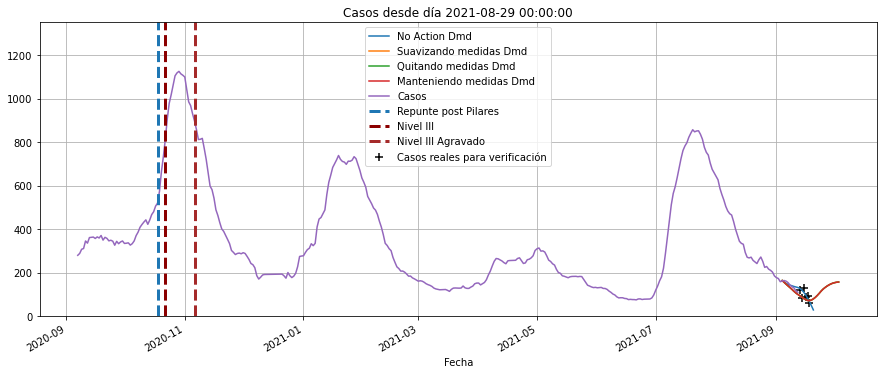

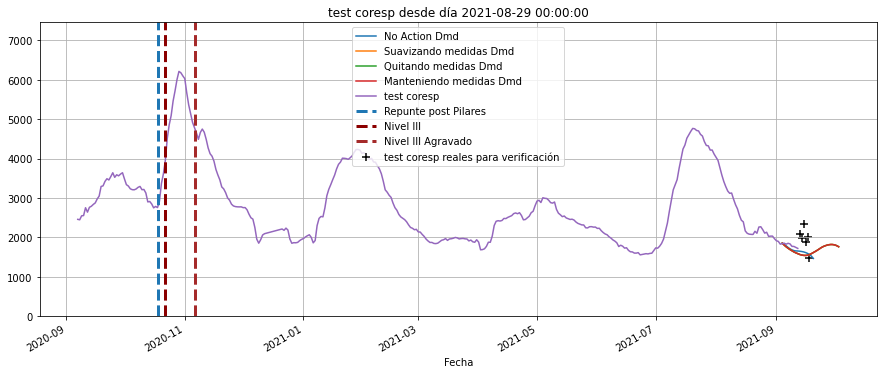

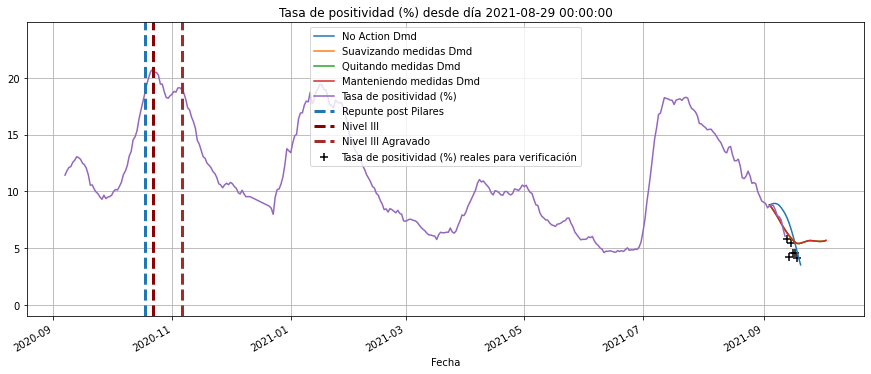

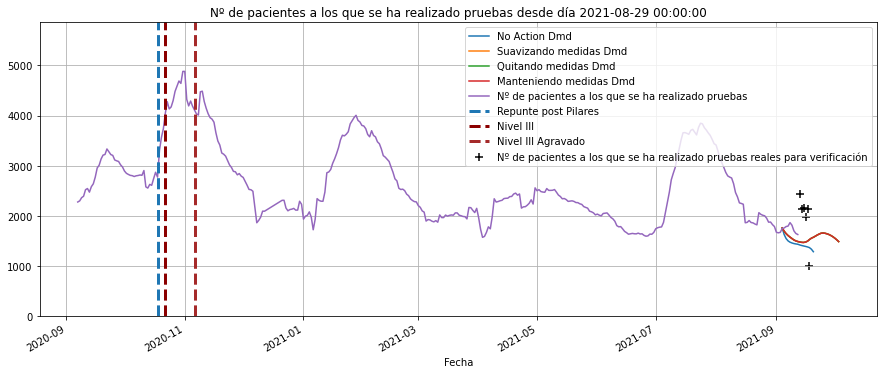

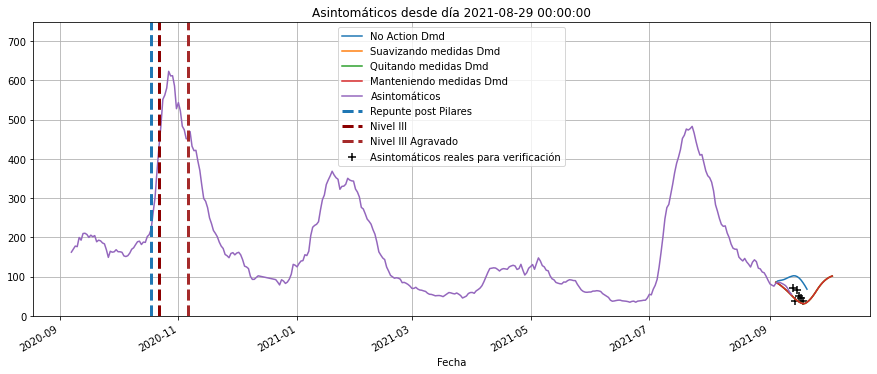

...

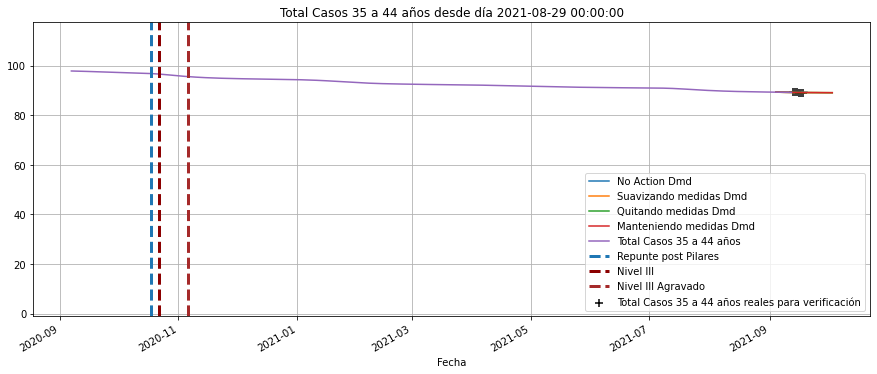

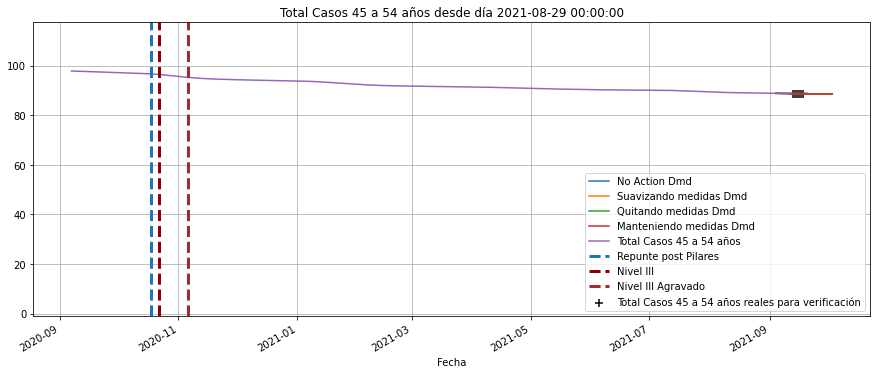

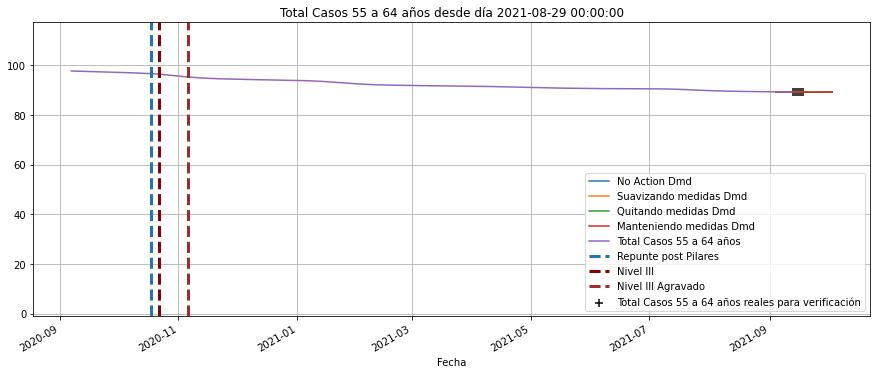

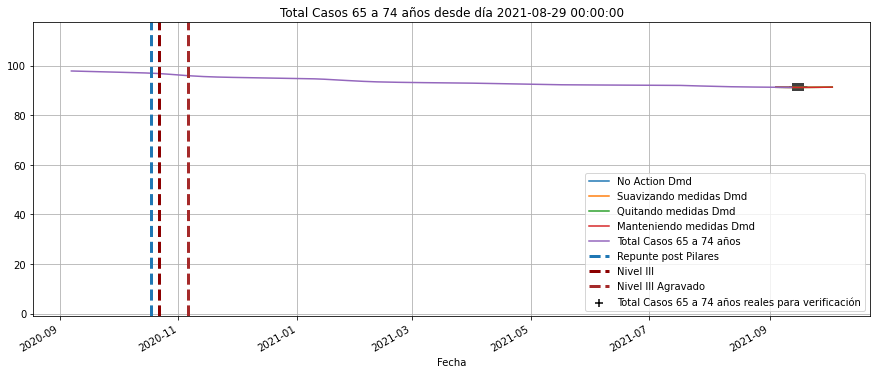

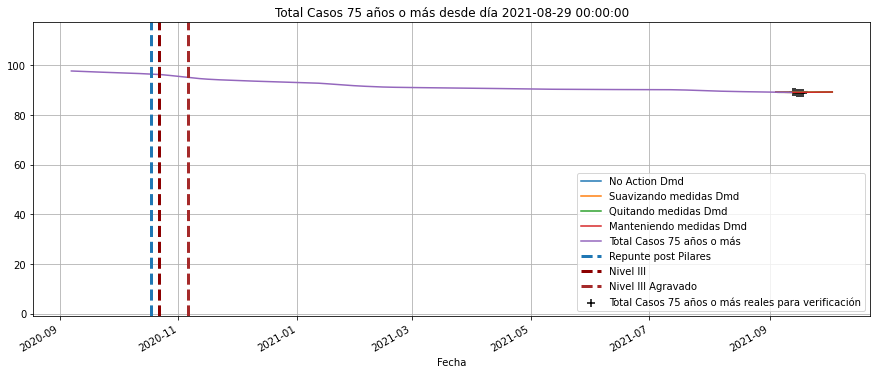

In [44]:
for i in kControl.T.columns:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #
    ax.plot(noAction.T.loc[:nuevos.index[-1]].index,
            noAction.T.loc[:nuevos.index[-1]][[i]],axes=ax,label='No Action Dmd')
    ax.plot(kControl.T.index,
            kControl.T[[i]],axes=ax,label='Suavizando medidas Dmd')
    ax.plot(rellaxed.T.index,
            rellaxed.T[[i]],axes=ax,label='Quitando medidas Dmd')
    ax.plot(hard.T.index,
            hard.T[[i]],axes=ax,label='Manteniendo medidas Dmd')
    X_prima.T.shift(0).loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.legend()
    plt.grid()
    plt.ylim(bottom=-1,top=1.2*X_prima.T.loc['2020-9-7':,i].max())
    plt.show()
  

In [45]:
import datetime as datetime

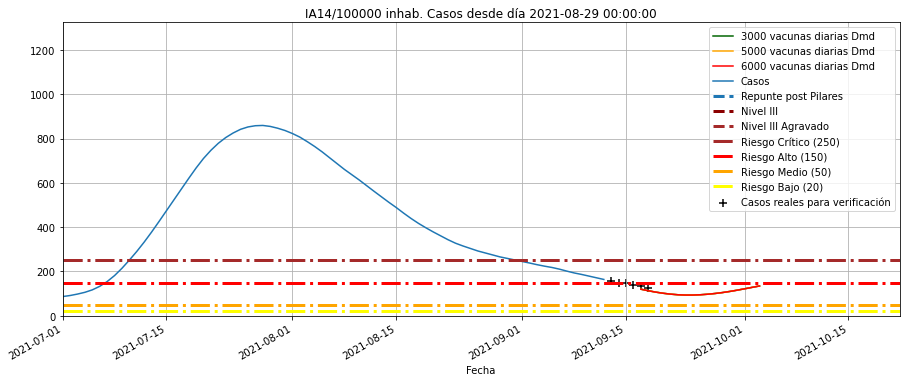

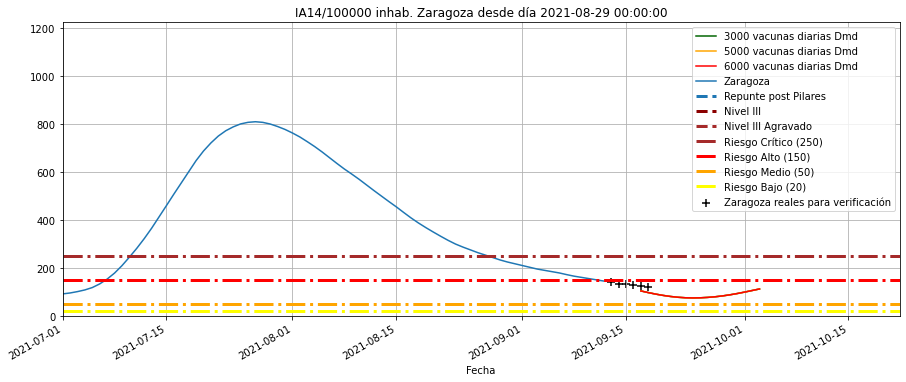

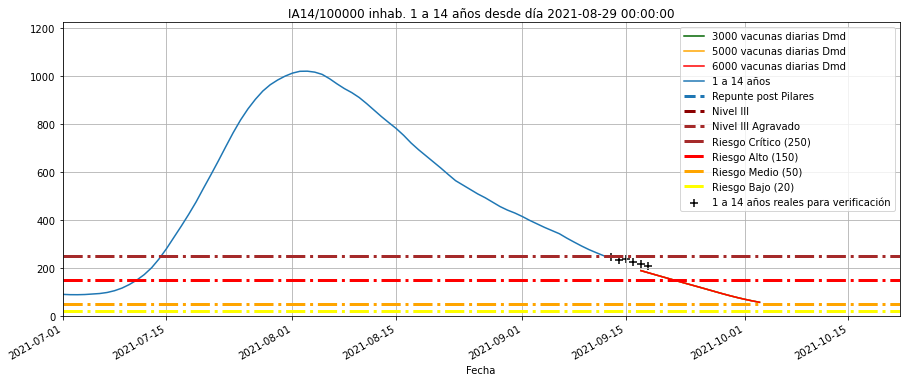

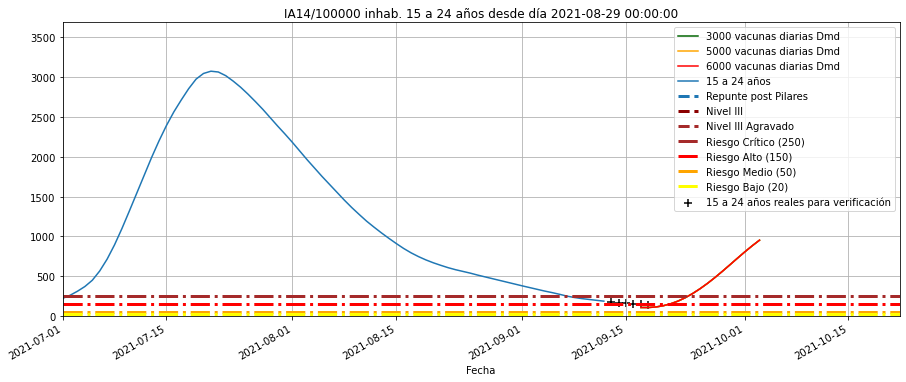

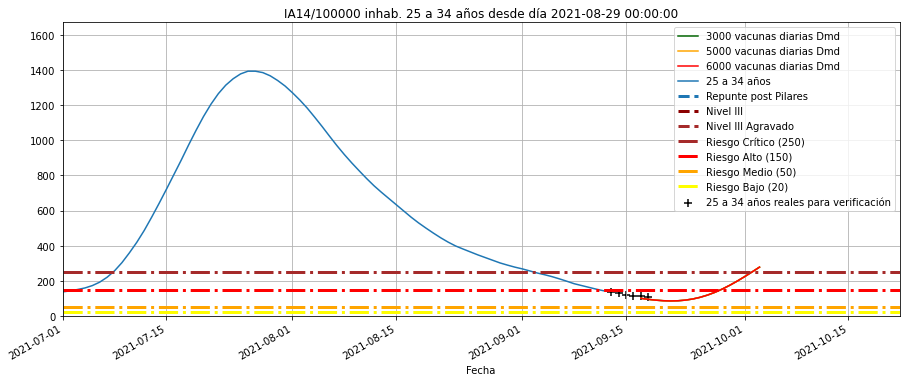

...

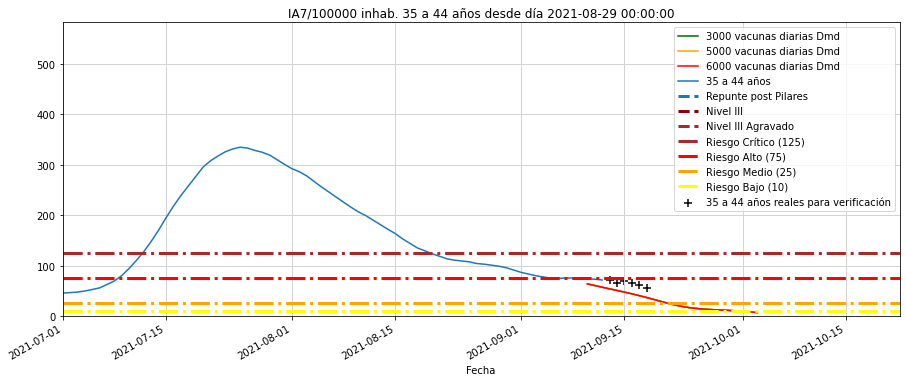

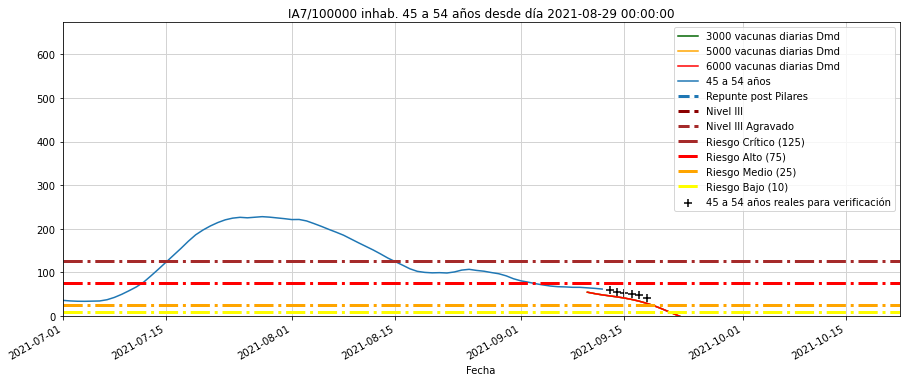

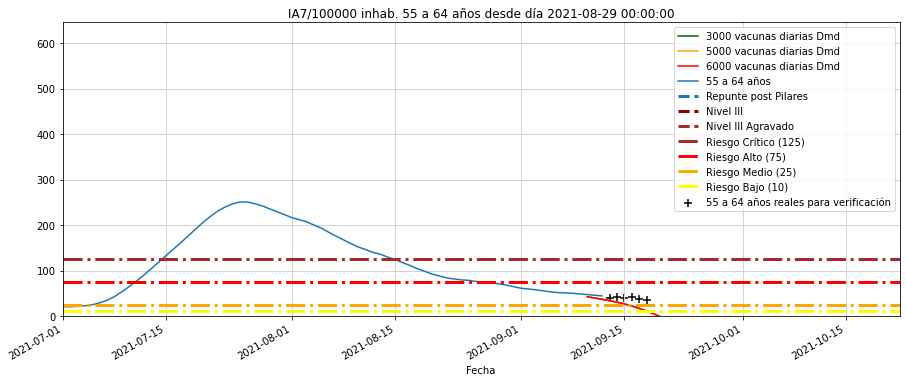

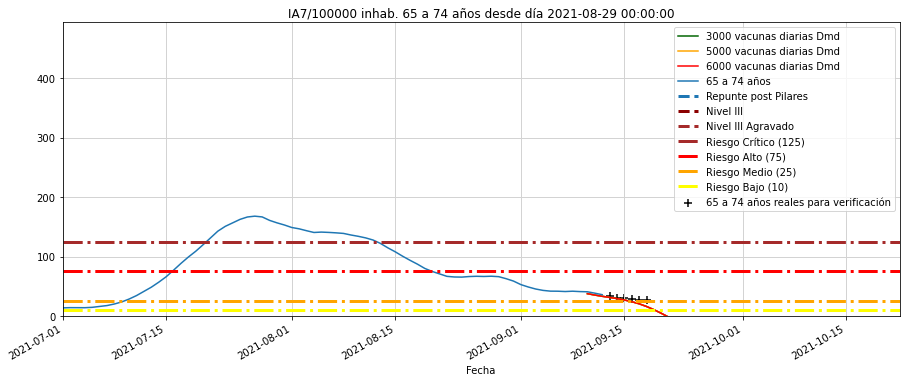

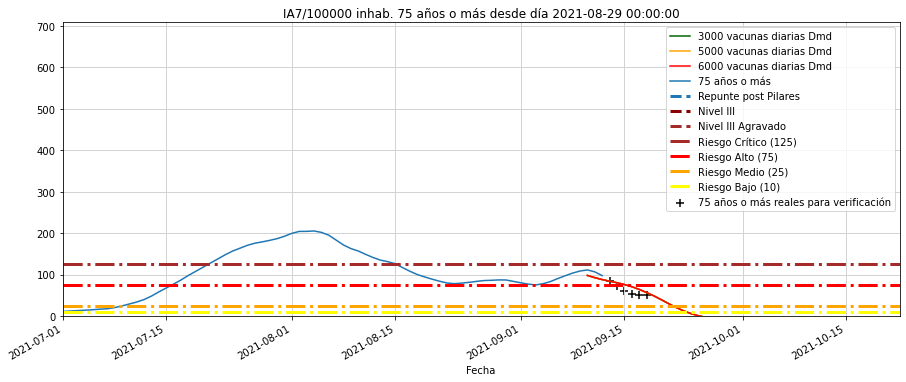

In [46]:
coef = {
    'Casos':13.19,
    #'test coresp':13,
    #'Nº de pacientes a los que se ha realizado pruebas':13,
    #'Asintomáticos':13,
    'Zaragoza':9.6,
    '1 a 14 años':1.58,
    '15 a 24 años':1.24,
    '25 a 34 años':1.42,
    '35 a 44 años':2.01,
    '45 a 54 años':2.06, 
    '55 a 64 años':1.77, 
    '65 a 74 años':1.35,
    '75 años o más':1.50,
}
for i in coef.keys():
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #
    #ax.plot(noAction.T.index,
    #        noAction.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed.T.index,
            rellaxed.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='3000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl.T.index,
            kControl.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='5000 vacunas diarias Dmd',c='orange')
    ax.plot(hard.T.index,
            hard.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='6000 vacunas diarias Dmd',c='red')
    (X_prima.T.shift(0).loc['2020-9-7':,i].rolling(14,center=False).sum()/coef[i]).plot(ax=ax,label='{}'.format(i))
    #ax.plot(total.loc['2020-9-7':].index,
    #            (total.rolling(14,center=False).sum()/coef[i]).loc['2020-9-7':,[i]],
    #            axes=ax,label='Desde datos diarios'.format(i))
    ax.scatter((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T.loc[nuevos.index[0]:].index,
            ((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T[[i]].rolling(14,center=False).sum()/coef[i]
            ).loc[nuevos.index[0]:],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    ax.axhline(250,lw=3,ls='-.',c='brown',label='Riesgo Crítico (250)')
    ax.axhline(150,lw=3,ls='-.',c='red',label='Riesgo Alto (150)')
    ax.axhline(50,lw=3,ls='-.',c='orange',label='Riesgo Medio (50)')
    ax.axhline(20,lw=3,ls='-.',c='yellow',label='Riesgo Bajo (20)')
    plt.title("IA14/100000 inhab. {} desde día {}".format(i,x1.index[0]))
    plt.legend()
    plt.grid()
    plt.ylim(bottom=-1,top=1.2*(X_prima.T.loc['2020-9-7':,i].rolling(14,center=False).sum()/coef[i]).max())
    plt.xlim(left=datetime.datetime(2020, 9, 7))
    
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.show()

for i in coef.keys():
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #
    #ax.plot(noAction.T.index,
    #        noAction.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed.T.index,
            rellaxed.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='3000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl.T.index,
            kControl.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='5000 vacunas diarias Dmd',c='orange')
    ax.plot(hard.T.index,
            hard.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='6000 vacunas diarias Dmd',c='red')
    (X_prima.T.shift(0).loc['2020-9-7':,i].rolling(7,center=False).sum()/coef[i]).plot(ax=ax,label='{}'.format(i))
    #(pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1).T.loc['2020-9-7':,i].rolling(7,center=False).sum()/coef[i]).plot(ax=ax,label='{}'.format(i))
    #ax.plot(total.loc['2020-9-7':].index,
    #            (total.rolling(14,center=False).sum()/coef[i]).loc['2020-9-7':,[i]],
    #            axes=ax,label='Desde datos diarios'.format(i))
    ax.scatter((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T.loc[nuevos.index[0]:].index,
            ((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T[[i]].rolling(7,center=False).sum()/coef[i]
            ).loc[nuevos.index[-0]:],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    ax.axhline(125,lw=3,ls='-.',c='brown',label='Riesgo Crítico (125)')
    ax.axhline(75,lw=3,ls='-.',c='red',label='Riesgo Alto (75)')
    ax.axhline(25,lw=3,ls='-.',c='orange',label='Riesgo Medio (25)')
    ax.axhline(10,lw=3,ls='-.',c='yellow',label='Riesgo Bajo (10)')
    plt.title("IA7/100000 inhab. {} desde día {}".format(i,x1.index[0]))
    plt.legend()
    #plt.grid()
    plt.grid(which='minor',axis ='both', linestyle=':', linewidth='0.5', color='lightgrey')
    plt.grid(which='major',axis ='both', linewidth='1', color='lightgrey')
    plt.ylim(bottom=-1,
             top=1.2*(X_prima.T.loc['2020-9-7':,i].rolling(7,center=False).sum()/coef[i]).max())
    plt.ylim(bottom=.0*np.max([0,
                           np.min([total.loc['2020-9-7':,i].rolling(7,center=False).sum().min()/coef[i],
                                   #nuevos.loc['2020-9-7':,i].rolling(7,center=False).sum().min()/coef[i],
                                   kControl.T.loc[:,i].min()])]),
         top=1.1*np.max([total.loc['2020-9-7':,i].rolling(7,center=False).sum().max()/coef[i],
                         #nuevos.loc['2020-9-7':,i].rolling(7,center=False).sum().max()/coef[i],
                         kControl.T.loc[:,i].max()]))

    plt.xlim(left=datetime.datetime(2020, 9, 7))
    
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.show()
  

In [47]:
pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)
#nuevos.T.shift(0).loc[X_prima.index[0]:]
#X_prima
i='Casos'
((pd.concat([diario.T,nuevos.T.loc[X_prima.index]],axis=1)).T[[i]].rolling(14,center=False).sum()/coef[i]).loc[X_prima.T.index[-5]:].round(0)
nuevos.tail()

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-09-16,4,86.0,1895.0,1981.0,4.54,50.74,60.0,9.0,9.0,6.0,...,42.575173,87.830197,89.057660,81.299919,86.230365,89.133898,88.672023,89.262097,91.226468,89.072442
2021-09-17,5,92.0,2004.0,2134.0,4.59,46.00,68.0,18.0,9.0,14.0,...,42.337692,87.823223,89.047906,81.292654,86.220486,89.128414,88.667173,89.259270,91.222770,89.061141
2021-09-18,6,61.0,1477.0,994.0,4.13,37.21,41.0,11.0,3.0,6.0,...,42.337692,87.818599,89.041945,81.290232,86.216252,89.124426,88.665718,89.256442,91.219811,89.051833
2021-09-19,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,42.337537,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-20,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,42.262048,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [48]:
noAction2 = noAction *repartoDiaSemana.loc[noAction.T.index.dayofweek+1,kControl.index].T.values
kControl2 = kControl *repartoDiaSemana.loc[kControl.T.index.dayofweek+1,kControl.index].T.values
rellaxed2 = rellaxed *repartoDiaSemana.loc[rellaxed.T.index.dayofweek+1,kControl.index].T.values
hard2 = hard *repartoDiaSemana.loc[hard.T.index.dayofweek+1,kControl.index].T.values
media2 = ((rellaxed.clip(lower=0)+kControl.clip(lower=0)+hard.clip(lower=0))/3.)*repartoDiaSemana.loc[rellaxed.T.index.dayofweek+1,kControl.index].T.values

In [49]:
from matplotlib.dates import HourLocator, MonthLocator, YearLocator, WeekdayLocator

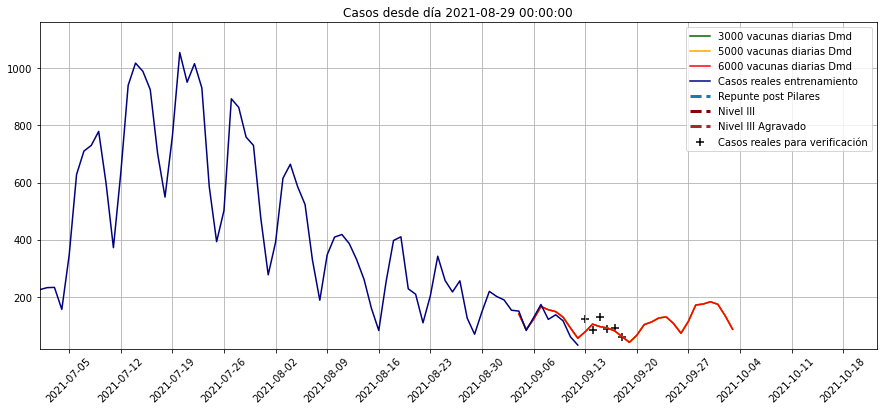

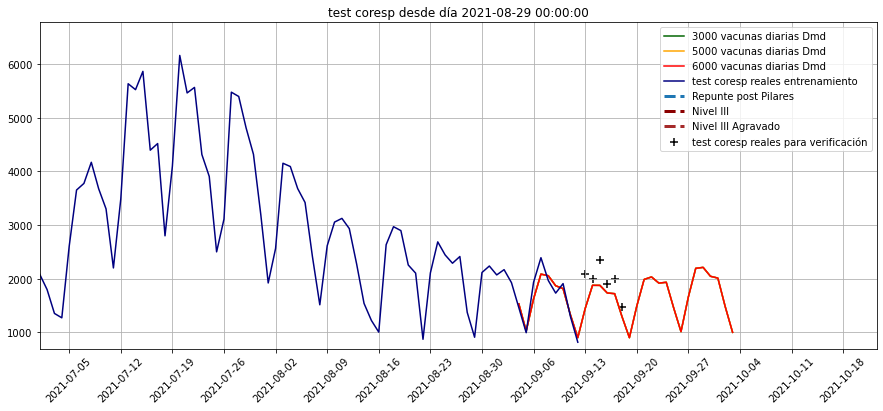

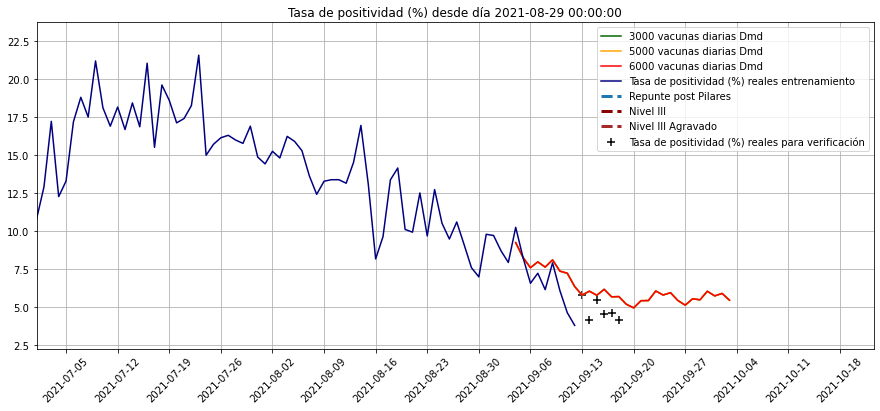

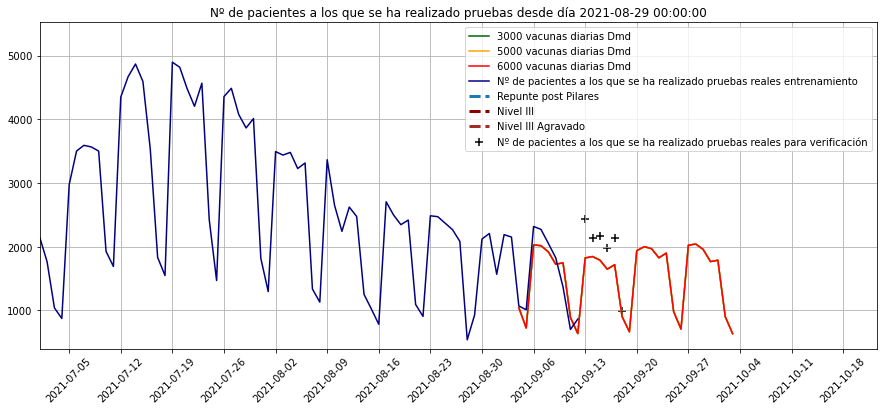

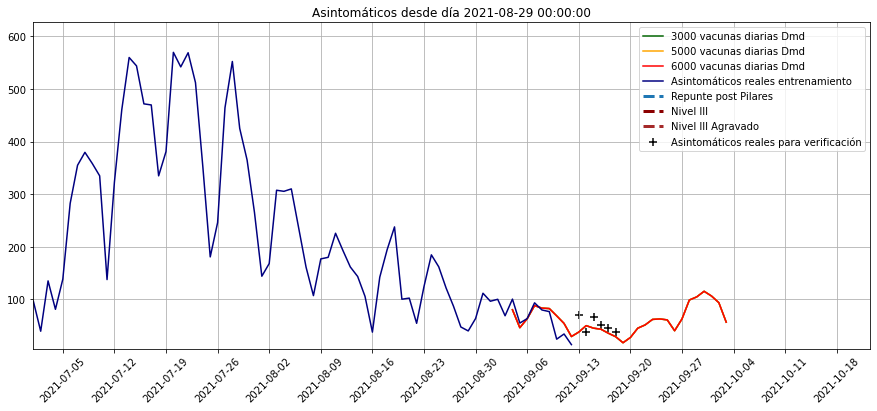

...

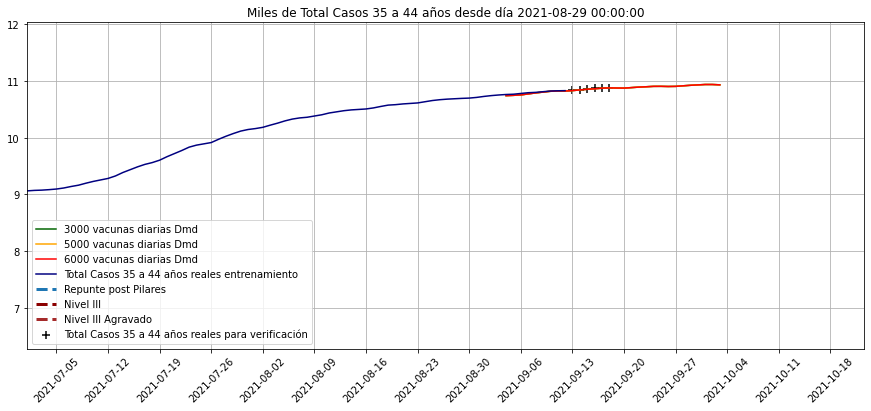

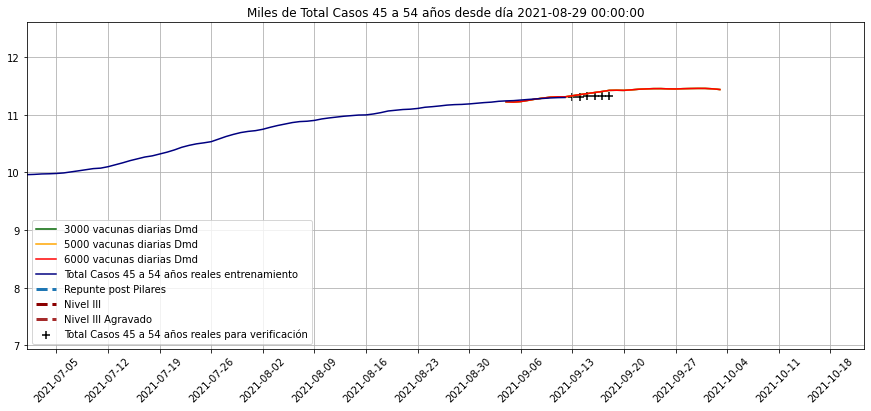

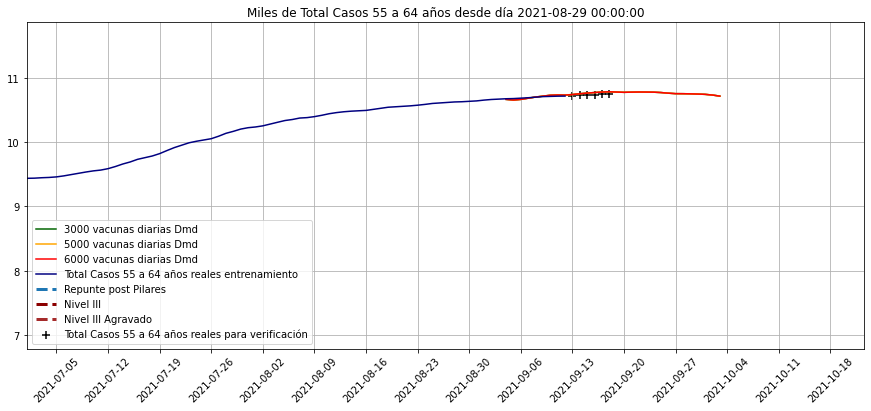

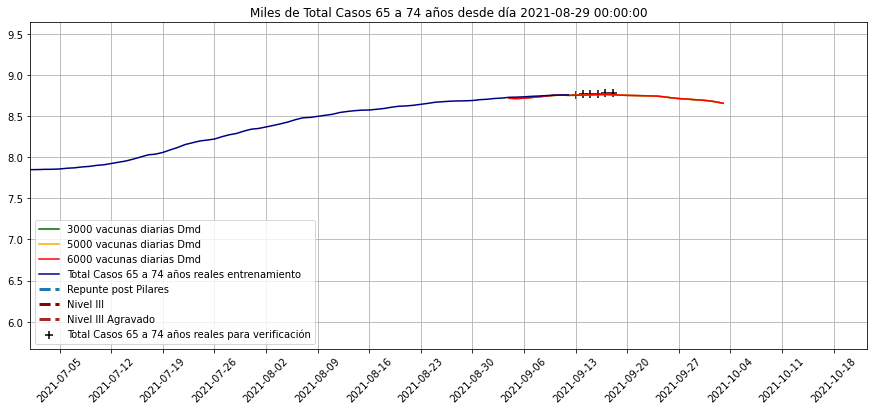

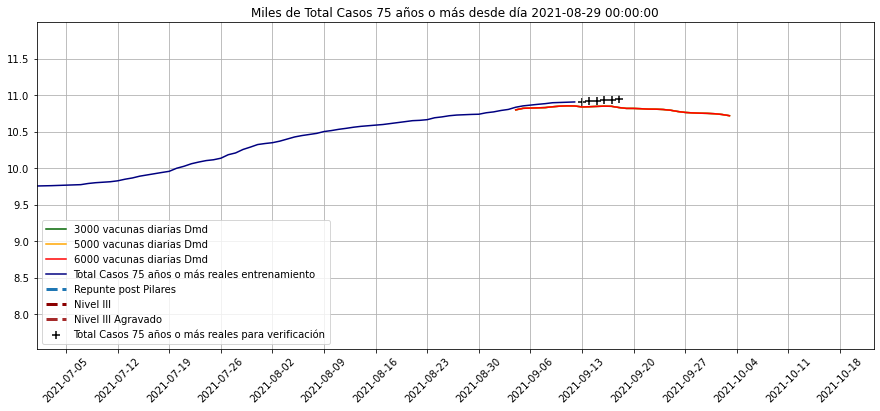

In [50]:
for i in kControl.T.columns[:-9]:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            rellaxed2.T[[i]],axes=ax,label='3000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            kControl2.T[[i]],axes=ax,label='5000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            hard2.T[[i]],axes=ax,label='6000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc['2020-9-7':].index,
        diario.loc['2020-9-7':,[i]],axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.legend()
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=0,top=3.0*diario.loc['2021-2':,i].max())
    #plt.ylim(bottom=.5*np.max([0,total.loc[:,i].min()]),top=1.75*X_prima.T.loc['2021-2':,i].max())
    plt.ylim(bottom=.9*np.max([0,
                               np.min([diario.loc['2021-2':,i].min(),
                                       #nuevos.loc['2021-2':,i].min(),
                                       kControl2.T.loc['2021-2':,i].min()])]),
             top=1.1*np.max([diario.loc['2021-2':,i].max(),
                                  #nuevos.loc['2021-2':,i].max(),
                                  kControl2.T.loc['2021-2':,i].max()]))


        
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.grid()
    
    #plt.grid(which='major',axis ='y', linewidth='1', color='black')
    #plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    #ax.tick_params(which='both', # Options for both major and minor ticks
    #                top='off', # turn off top ticks
    #                left='off', # turn off left ticks
    #                right='off',  # turn off right ticks
    #                bottom='off') # turn off bottom ticks
    #ax.minorticks_on()
    ax.xaxis.set_major_locator(WeekdayLocator(0))
    
    plt.xticks(rotation=45)
    plt.show()
for i in kControl.T.columns[-9:]:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            100-rellaxed2.T[[i]],axes=ax,label='3000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            100-kControl2.T[[i]],axes=ax,label='5000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            100-hard2.T[[i]],axes=ax,label='6000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc['2020-9-7':].index,
        100-diario.loc['2020-9-7':,[i]],axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            100-nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.legend()
    plt.title("Miles de {} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=0,top=1.1*diario.loc['2021-2':,i].max())
    plt.ylim(bottom=.9*np.max([0,100-np.max([diario.loc['2021-2':,i].max(),
                                             #nuevos.loc['2021-2':,i].max(),
                                             kControl2.T.loc['2021-2':,i].max()])]),
             top=1.1*(100-np.min([diario.loc['2021-2':,i].min(),
                                  #nuevos.loc['2021-2':,i].min(),
                                  kControl2.T.loc['2021-2':,i].min()])))
    
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.grid()
    
    #plt.grid(which='major',axis ='y', linewidth='1', color='black')
    #plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    #ax.tick_params(which='both', # Options for both major and minor ticks
    #                top='off', # turn off top ticks
    #                left='off', # turn off left ticks
    #                right='off',  # turn off right ticks
    #                bottom='off') # turn off bottom ticks
    #ax.minorticks_on()
    ax.xaxis.set_major_locator(WeekdayLocator(0))
    
    plt.xticks(rotation=45)
    plt.show()
    

In [51]:
kControl2.index

Index(['Casos', 'test coresp', 'Tasa de positividad (%)',
       'Nº de pacientes a los que se ha realizado pruebas', 'Asintomáticos',
       'Asintomáticos (%)', 'Zaragoza', 'Zaragoza (%)', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'Camas (%)', 'UCI ocupadas', 'UCI libres con resp',
       'UCI (%)', 'Rs', 'Rd', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

In [52]:
kControl2.loc[['Casos', 'test coresp', 
       'Nº de pacientes a los que se ha realizado pruebas', 'Tasa de positividad (%)',
       'Asintomáticos (%)', 'Zaragoza', 'UCI ocupadas', 'UCI libres con resp', 'Camas Ocup',
       'Camas libres', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más'],'2021-9-12':'2021-9-19'].round(0).astype(int).T.sort_index(ascending=False).to_excel('kControl2.xlsx')
kControl2.loc[['Casos', 'test coresp', 
       'Nº de pacientes a los que se ha realizado pruebas', 'Tasa de positividad (%)',
       'Asintomáticos (%)', 'Zaragoza', 'UCI ocupadas', 'UCI libres con resp', 'Camas Ocup',
       'Camas libres', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más'],'2021-9-12':'2021-9-19'].round(0).astype(int).T.sort_index(ascending=False)

,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos (%),Zaragoza,UCI ocupadas,UCI libres con resp,Camas Ocup,Camas libres,1 a 14 años,15 a 24 años,25 a 34 años,35 a 44 años,45 a 54 años,55 a 64 años,65 a 74 años,75 años o más
2021-09-19,41,901,665,5,50,21,34,107,120,1583,6,13,4,3,0,-3,-1,3
2021-09-18,61,1292,905,6,55,33,34,99,122,1618,13,14,5,6,2,-2,0,6
2021-09-17,81,1721,1718,6,49,45,34,98,126,1603,17,12,6,9,6,-1,1,9
2021-09-16,91,1734,1647,6,52,53,34,96,136,1456,20,7,7,11,9,2,3,13
2021-09-15,96,1876,1789,6,50,59,35,98,142,1415,21,4,7,13,11,4,4,14
2021-09-14,104,1877,1846,6,50,66,35,98,149,1409,23,3,8,15,14,6,5,18
2021-09-13,78,1443,1823,6,49,46,36,101,156,1435,14,2,6,11,10,5,4,12
2021-09-12,55,901,636,6,52,35,37,105,165,1596,9,3,5,8,7,4,3,10


In [53]:
kControl2.T.head()

,Casos,test coresp,Tasa de positividad (%),Nº de pacientes a los que se ha realizado pruebas,Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-09-04,140.018622,1531.632164,9.242749,1042.293406,80.278891,58.351972,93.206348,65.126767,25.740649,14.336367,...,46.152535,87.957641,89.225401,81.421238,86.323509,89.259873,88.773269,89.336980,91.283509,89.202332
2021-09-05,85.545631,1024.588095,8.261469,724.067932,46.134455,53.699224,53.404661,62.208840,12.521971,8.428494,...,45.930629,87.946315,89.216756,81.429687,86.318038,89.254326,88.778948,89.346899,91.286551,89.181063
2021-09-06,121.382489,1624.280903,7.594423,2027.620560,63.189024,51.373300,70.810309,58.994926,17.873431,12.049902,...,45.709261,87.933205,89.212491,81.424292,86.312976,89.246875,88.769048,89.337057,91.282149,89.177980
2021-09-07,165.851766,2085.950087,7.976325,2016.018004,88.127344,52.167434,105.434710,64.673642,30.634668,16.859201,...,45.476379,87.920559,89.199747,81.402934,86.297613,89.229299,88.748243,89.318590,91.274023,89.174150
2021-09-08,154.749592,2056.011545,7.630914,1919.377568,83.358866,52.590652,99.899223,66.611899,27.728664,15.613166,...,45.230486,87.908225,89.187529,81.379368,86.281897,89.211776,88.726200,89.300725,91.265473,89.170925


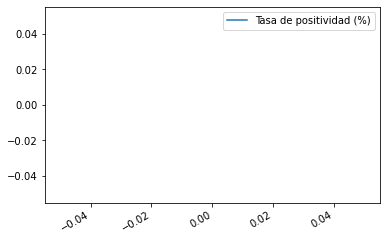

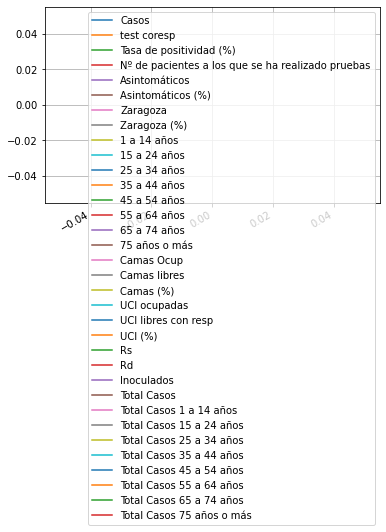

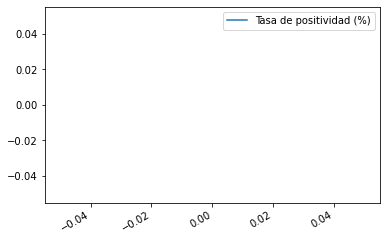

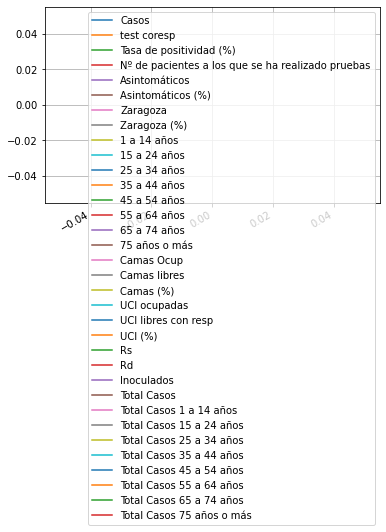

In [54]:
hard2.T.loc['2020-10-1':'2021-3-27',['Tasa de positividad (%)']].plot()
(hard2.T.loc['2020-10-1':'2021-3-27'].apply(lambda x: 100.*x.Casos/x['test coresp'],axis=1)).plot()
plt.grid()
plt.show()
kControl2.T.loc[:'2021-3-27',['Tasa de positividad (%)']].plot()
(kControl2.T.loc[:'2021-3-27'].apply(lambda x: 100.*x.Casos/x['test coresp'],axis=1)).plot()
plt.grid()#goto

In [55]:
diario.loc['2020-10-1':].apply(lambda x: 100.*x.Casos/x['test coresp'],axis=1)

Fecha
2020-10-01    10.849057
2020-10-02    10.931583
2020-10-03    10.202768
2020-10-04    12.485459
2020-10-05    11.167315
                ...    
2021-09-08     6.154629
2021-09-09     7.909931
2021-09-10     6.076480
2021-09-11     4.633205
2021-09-12     3.799020
Length: 347, dtype: float64

<AxesSubplot:xlabel='Fecha'>

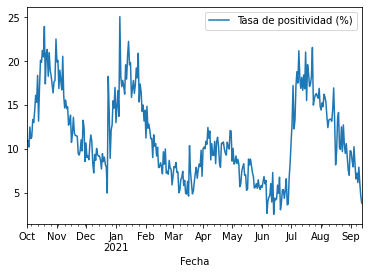

In [56]:
diario.loc['2020-10-1':,['Tasa de positividad (%)']].plot()

In [57]:
((kControl2.T-nuevos)*100./nuevos).dropna(axis=0,how='all').dropna(axis=1,how='all').describe().T

,count,mean,std,min,25%,50%,75%,max
1 a 14 años,6.0,9.107066,63.800005,-55.785500,-35.589104,5.775216,21.394091,121.654293
15 a 24 años,6.0,28.479895,172.474695,-78.911532,-67.641391,-43.564951,21.305695,369.658429
25 a 34 años,6.0,-13.930719,29.389042,-53.587443,-37.374434,-3.290079,4.988688,17.570895
35 a 44 años,6.0,-26.241045,22.985129,-52.795353,-44.632005,-23.756231,-16.377482,8.370042
45 a 54 años,6.0,-20.553045,28.873575,-41.944685,-36.639490,-29.465136,-22.115440,36.253169
55 a 64 años,6.0,-76.902170,48.642025,-145.208185,-107.708118,-70.461168,-50.573307,-11.214711
65 a 74 años,6.0,-41.651137,48.502982,-110.696813,-67.623821,-39.421006,-18.353024,27.987128
75 años o más,6.0,52.691948,111.137635,-59.839456,-31.778296,21.714111,147.349645,192.943862
Asintomáticos,6.0,-17.152972,27.336029,-46.045524,-29.585945,-22.158898,-16.470163,34.081035
Asintomáticos (%),6.0,-5.049530,9.435484,-14.668827,-11.505309,-6.615969,-1.949447,11.132614


In [58]:
nuevos['Nº de pacientes a los que se ha realizado pruebas']

Fecha
2021-09-13    2432.0
2021-09-14    2132.0
2021-09-15    2166.0
2021-09-16    1981.0
2021-09-17    2134.0
2021-09-18     994.0
2021-09-19       NaN
2021-09-20       NaN
Name: Nº de pacientes a los que se ha realizado pruebas, dtype: float64

<AxesSubplot:xlabel='Tasa de positividad (%)', ylabel='Asintomáticos (%)'>

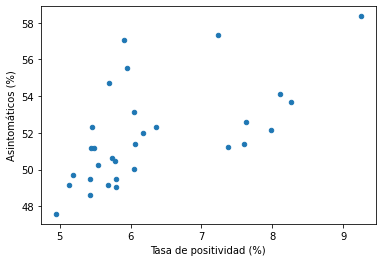

In [59]:
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter')

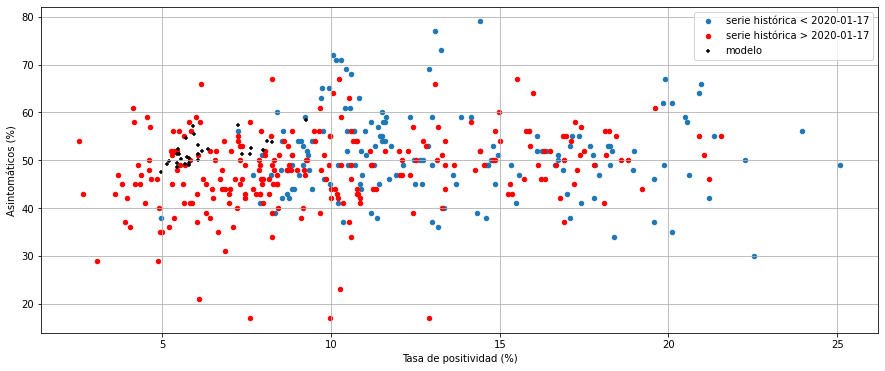

In [60]:
fig, ax = plt.subplots(figsize=(15,6))
total.loc[:'2021-01-17'].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica < 2020-01-17',ax=ax,marker='o')
total.loc['2021-01-17':].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica > 2020-01-17',ax=ax,c='r',marker='o')
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',label='modelo',ax=ax,
                 c='k',marker='+')
plt.grid()

In [61]:
kControl2.T.columns

Index(['Casos', 'test coresp', 'Tasa de positividad (%)',
       'Nº de pacientes a los que se ha realizado pruebas', 'Asintomáticos',
       'Asintomáticos (%)', 'Zaragoza', 'Zaragoza (%)', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'Camas (%)', 'UCI ocupadas', 'UCI libres con resp',
       'UCI (%)', 'Rs', 'Rd', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

In [62]:
total.T

Fecha,2020-08-14,2020-08-15,2020-08-16,2020-08-17,2020-08-18,2020-08-19,2020-08-20,2020-08-21,2020-08-22,2020-08-23,...,2021-09-11,2021-09-12,2021-09-13,2021-09-14,2021-09-15,2021-09-16,2021-09-17,2021-09-18,2021-09-19,2021-09-20
Día de la semana,5.000000,6.000000,7.000000,1.000000,2.000000,3.000000,4.000000e+00,5.000000,6.000000,7.000000,...,6.000000,7.000000,1.000000,2.000000,3.000000,4.000000e+00,5.000000,6.000000,7.000000,1.000000
Casos,624.000000,482.000000,390.000000,396.000000,467.000000,347.000000,3.570000e+02,272.000000,493.000000,230.000000,...,60.000000,31.000000,121.000000,83.000000,128.000000,8.600000e+01,92.000000,61.000000,NaN,NaN
test coresp,4177.000000,3243.000000,3158.000000,3408.000000,4029.000000,3027.000000,3.191000e+03,2796.000000,4546.000000,1997.000000,...,1295.000000,816.000000,2092.000000,1988.000000,2352.000000,1.895000e+03,2004.000000,1477.000000,NaN,NaN
Nº de pacientes a los que se ha realizado pruebas,3481.000000,1907.000000,1168.000000,3189.000000,3580.000000,2963.000000,3.219000e+03,2821.000000,1392.000000,617.000000,...,701.000000,864.000000,2432.000000,2132.000000,2166.000000,1.981000e+03,2134.000000,994.000000,NaN,NaN
Tasa de positividad (%),14.940000,14.860000,12.350000,11.620000,11.590000,11.460000,1.119000e+01,9.730000,10.840000,11.520000,...,4.630000,3.800000,5.780000,4.180000,5.440000,4.540000e+00,4.590000,4.130000,NaN,NaN
Asintomáticos,318.240000,216.900000,230.100000,233.640000,270.860000,190.850000,2.070600e+02,176.800000,310.590000,138.000000,...,34.200000,13.950000,70.180000,37.350000,66.560000,5.074000e+01,46.000000,37.210000,NaN,NaN
Zaragoza,541.000000,428.000000,338.000000,307.000000,394.000000,262.000000,2.800000e+02,217.000000,412.000000,191.000000,...,50.000000,25.000000,76.000000,54.000000,97.000000,6.000000e+01,68.000000,41.000000,NaN,NaN
1 a 14 años,96.000000,67.000000,53.000000,51.000000,49.000000,46.000000,4.600000e+01,41.000000,58.000000,21.000000,...,13.000000,7.000000,31.000000,19.000000,39.000000,9.000000e+00,18.000000,11.000000,NaN,NaN
15 a 24 años,78.000000,51.000000,54.000000,41.000000,50.000000,42.000000,4.200000e+01,29.000000,59.000000,28.000000,...,4.000000,2.000000,11.000000,8.000000,12.000000,9.000000e+00,9.000000,3.000000,NaN,NaN
25 a 34 años,85.000000,64.000000,38.000000,40.000000,72.000000,58.000000,5.800000e+01,44.000000,47.000000,25.000000,...,8.000000,2.000000,12.000000,8.000000,7.000000,6.000000e+00,14.000000,6.000000,NaN,NaN


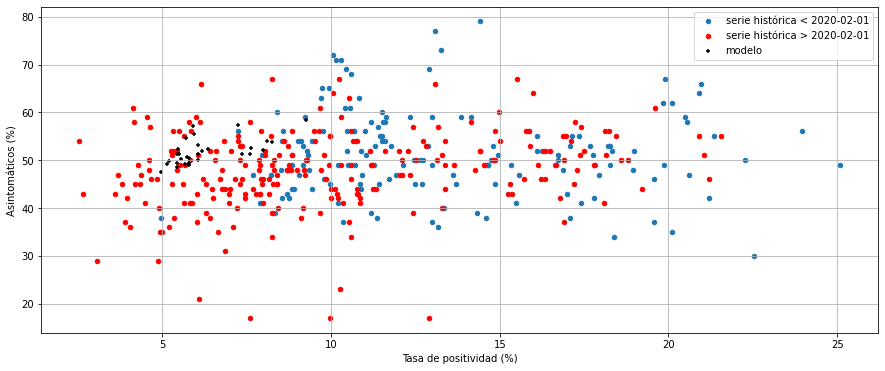

In [63]:
fig, ax = plt.subplots(figsize=(15,6))
total.loc[:'2021-01-17'].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica < 2020-02-01',ax=ax,marker='o')
total.loc['2021-01-17':].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica > 2020-02-01',ax=ax,c='r',marker='o')
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',label='modelo',ax=ax,
                 c='k',marker='+')
plt.grid()

In [64]:
def histogram_intersection(a, b):
    v = np.minimum(a, b).sum().round(decimals=1)
    return v

total[['Tasa de positividad (%)','Asintomáticos (%)']].corr(min_periods=2)


,Tasa de positividad (%),Asintomáticos (%)
Tasa de positividad (%),1.00000,0.18229
Asintomáticos (%),0.18229,1.00000


<AxesSubplot:xlabel='Tasa de positividad (%)', ylabel='Asintomáticos (%)'>

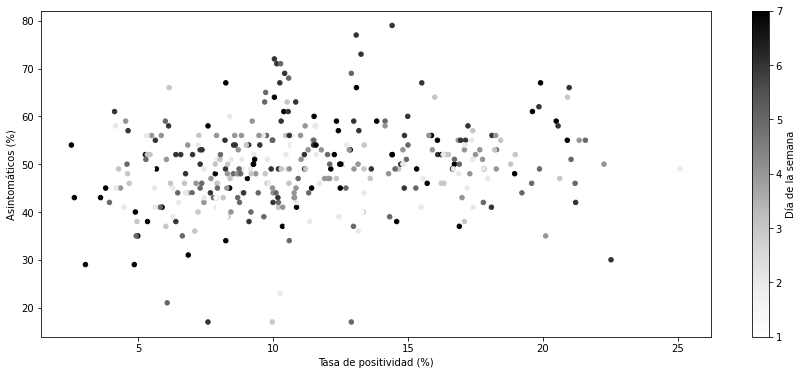

In [65]:
fig, ax = plt.subplots(figsize=(15,6))
total.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',c='Día de la semana',ax=ax)

In [66]:
kControl2.loc['Día de la semana',:] = pd.to_datetime(kControl2.columns.values).weekday+1

In [67]:
kControl2

,2021-09-04,2021-09-05,2021-09-06,2021-09-07,2021-09-08,2021-09-09,2021-09-10,2021-09-11,2021-09-12,2021-09-13,...,2021-09-24,2021-09-25,2021-09-26,2021-09-27,2021-09-28,2021-09-29,2021-09-30,2021-10-01,2021-10-02,2021-10-03
Casos,140.018622,85.545631,121.382489,165.851766,154.749592,148.168558,128.815431,91.047422,55.011267,77.555192,...,129.561175,106.113792,72.422895,113.910105,171.249976,174.649725,182.602937,173.747924,133.300461,86.475407
test coresp,1531.632164,1024.588095,1624.280903,2085.950087,2056.011545,1868.930677,1815.886811,1328.261152,900.727548,1443.315970,...,1933.871413,1458.984066,1013.682754,1660.972122,2193.868517,2211.684339,2045.466124,2012.107880,1479.044059,1000.534950
Tasa de positividad (%),9.242749,8.261469,7.594423,7.976325,7.630914,8.106175,7.367416,7.228232,6.356677,5.789538,...,5.797231,5.949600,5.436906,5.130115,5.547839,5.481788,6.045222,5.738759,5.901189,5.457656
Nº de pacientes a los que se ha realizado pruebas,1042.293406,724.067932,2027.620560,2016.018004,1919.377568,1725.125140,1746.224932,889.373567,636.123582,1823.238639,...,1899.516376,983.019490,706.538724,2023.615480,2041.127908,1958.131533,1766.462002,1787.557461,903.045330,635.659322
Asintomáticos,80.278891,46.134455,63.189024,88.127344,83.358866,82.537310,68.647186,54.255153,29.350549,37.865251,...,62.773929,61.013337,40.349665,62.846989,98.822948,104.716856,115.360184,106.416632,93.750670,56.682579
Asintomáticos (%),58.351972,53.699224,51.373300,52.167434,52.590652,54.102177,51.217916,57.347854,52.323275,49.492081,...,49.065903,55.529238,51.190860,49.153348,50.267837,51.195097,53.124804,50.646513,57.062462,52.332746
Zaragoza,93.206348,53.404661,70.810309,105.434710,99.899223,95.108946,82.998061,61.175254,34.679815,45.575632,...,75.299249,65.865688,43.212753,64.649142,107.159650,111.796747,116.639502,111.450126,89.315009,54.540910
Zaragoza (%),65.126767,62.208840,58.994926,64.673642,66.611899,67.116684,68.071273,70.822741,67.176211,63.177813,...,67.573261,70.041574,66.572469,62.771341,68.384600,69.988764,70.026759,70.497653,73.003274,69.078646
1 a 14 años,25.740649,12.521971,17.873431,30.634668,27.728664,27.320135,24.957672,19.112683,9.442403,13.706495,...,9.086387,6.473711,2.904288,3.844134,6.143273,5.205861,4.833061,4.175796,3.012806,1.392685
15 a 24 años,14.336367,8.428494,12.049902,16.859201,15.613166,13.247938,9.854317,5.482563,2.595097,2.319732,...,86.895690,68.412381,45.049575,72.526100,116.575662,127.595399,132.768824,129.012893,93.692962,58.093309


<AxesSubplot:xlabel='Tasa de positividad (%)', ylabel='Asintomáticos (%)'>

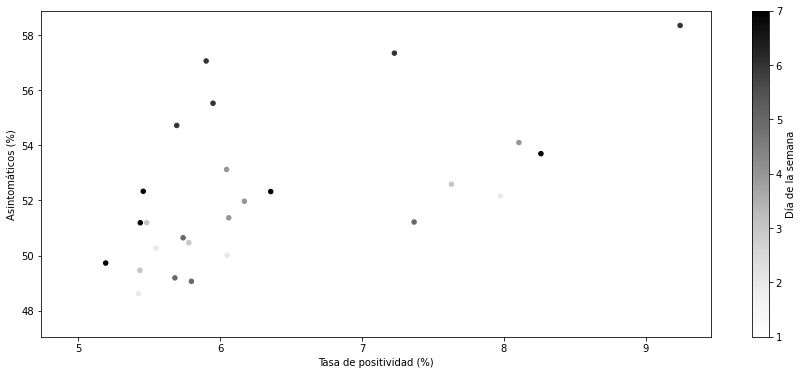

In [68]:
fig, ax = plt.subplots(figsize=(15,6))
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',c='Día de la semana',ax=ax)

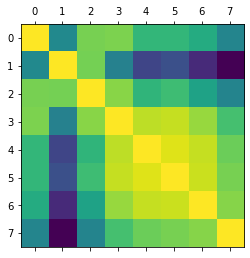

Index(['Día de la semana', 'Casos', 'test coresp',
       'Nº de pacientes a los que se ha realizado pruebas',
       'Tasa de positividad (%)', 'Asintomáticos', 'Zaragoza', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'UCI ocupadas', 'UCI libres con resp', 'Alarma',
       'Asintomáticos (%)', 'Zaragoza (%)', 'UCI/Camas (%)', 'Camas/UCI',
       'Casos/Camas', 'Camas/Casos', 'Camas (%)', 'UCI (%)', 'Día', 'Rs', 'Rd',
       'Bias', 'Festivo', 'Lectivo', 'Laboral', 'NoLaboral', 'NoLectivo',
       'Reuniones', 'VacunasD', 'Vacunas', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

In [69]:
plt.matshow(total[[ '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más']].corr())
plt.show()
total.columns

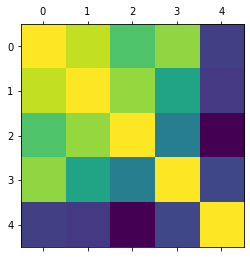

In [70]:
plt.matshow(total[[ 'Casos', 'test coresp',
       'Nº de pacientes a los que se ha realizado pruebas',
       'Tasa de positividad (%)', 'Asintomáticos (%)']].corr(min_periods=21))
plt.show()

(1.0, 28.0)

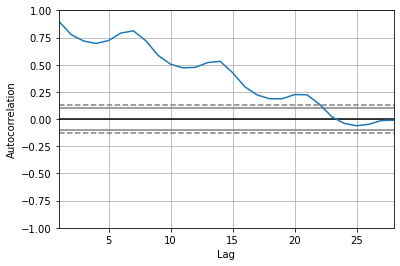

In [71]:
s = diario.Casos
pd.plotting.autocorrelation_plot(s)
plt.xlim(right=28)

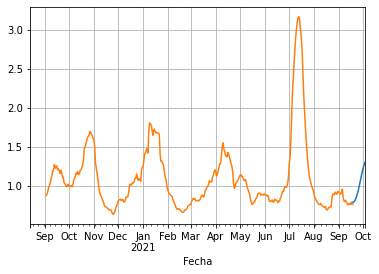

In [72]:
kControl2.T.Rd.rolling(14).mean().plot()
total.Rd.rolling(14).mean().plot()
plt.grid()

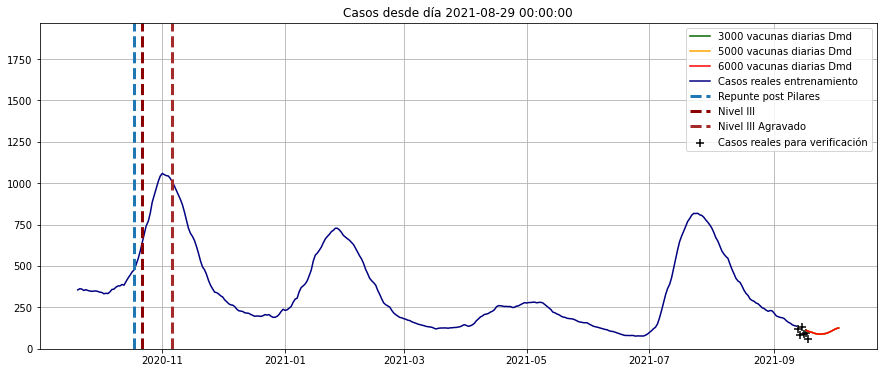

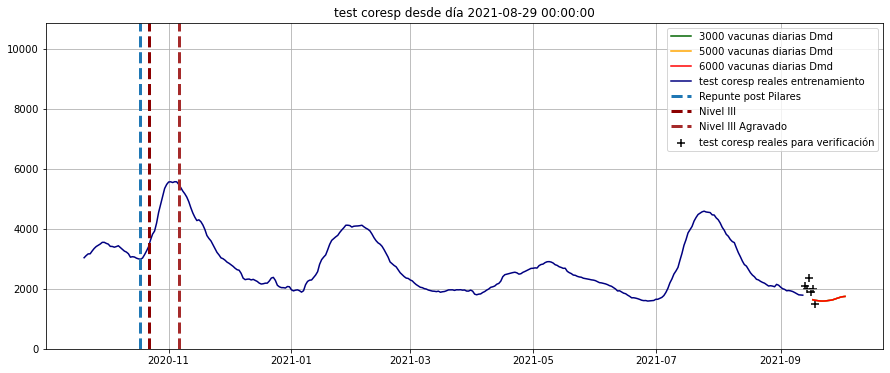

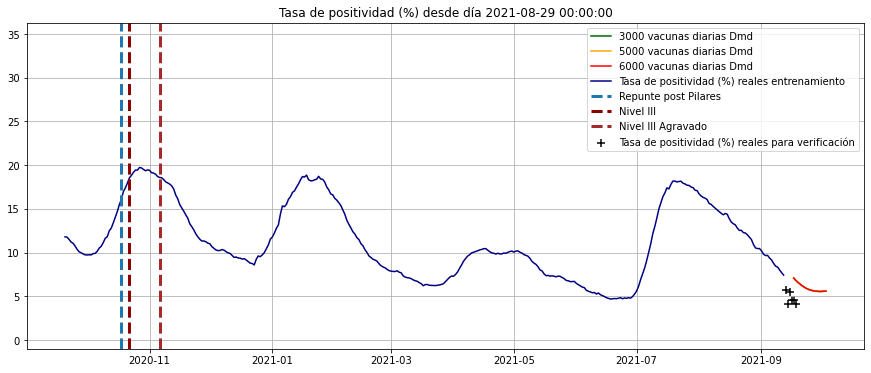

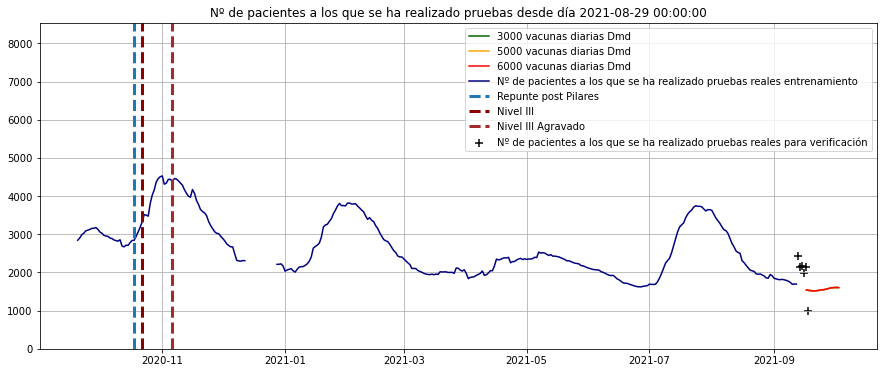

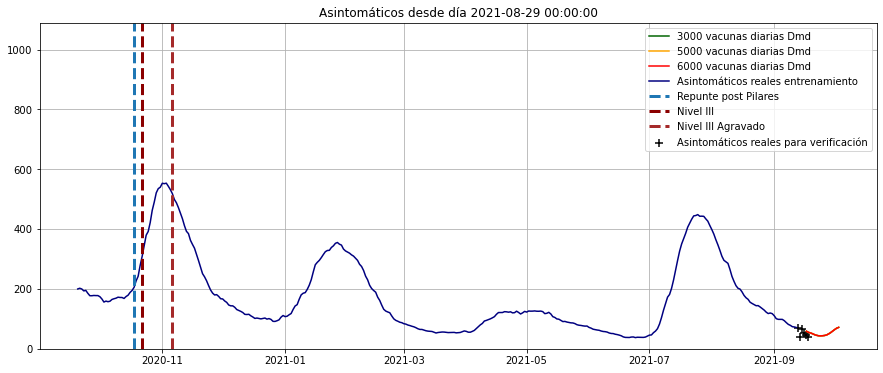

...

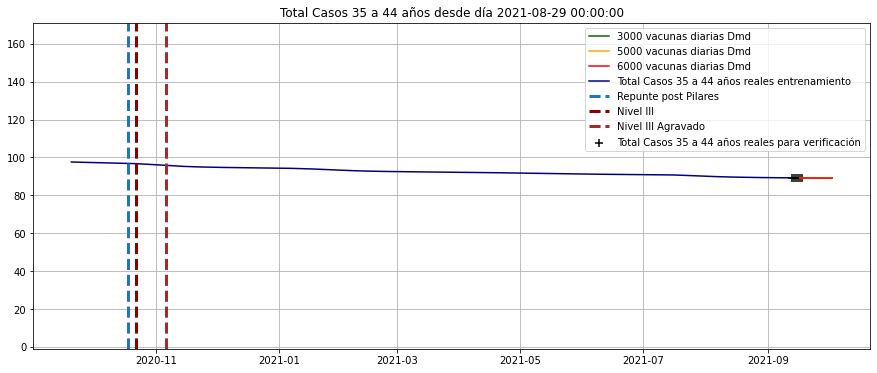

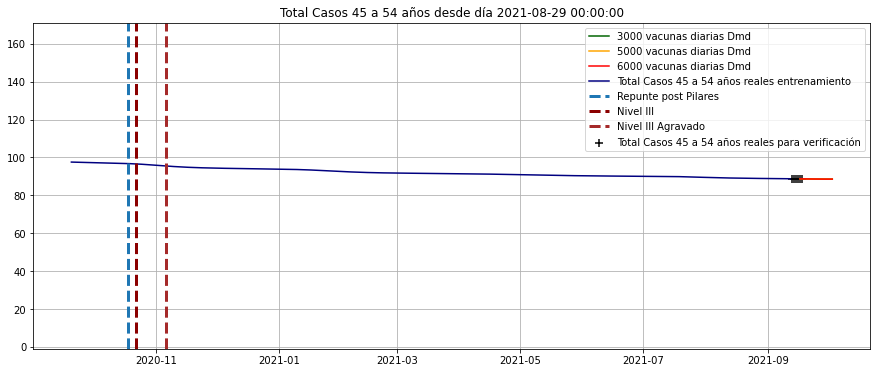

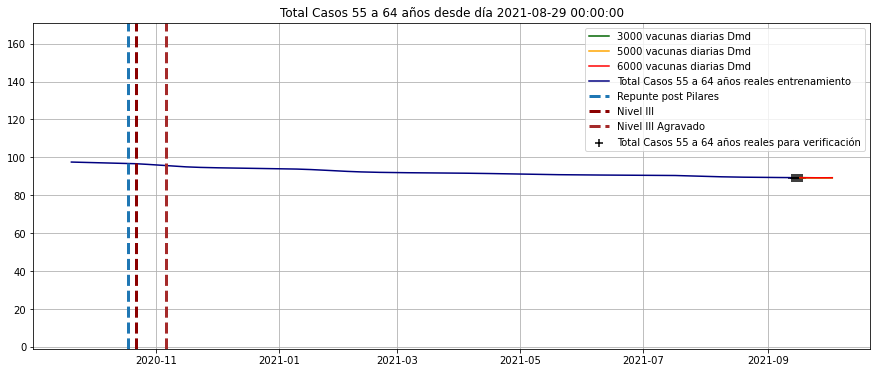

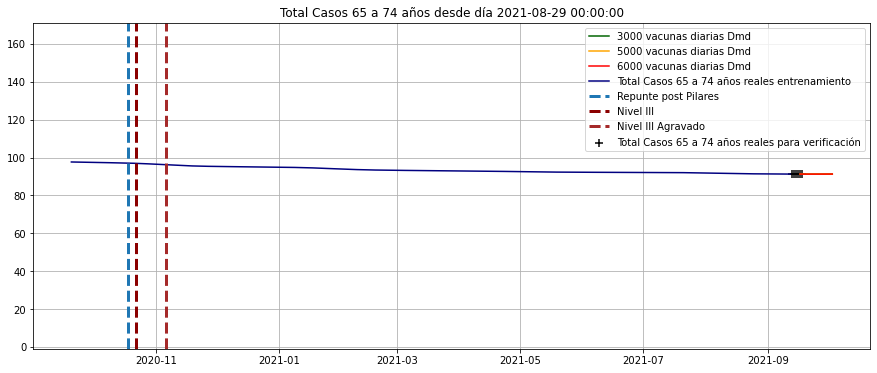

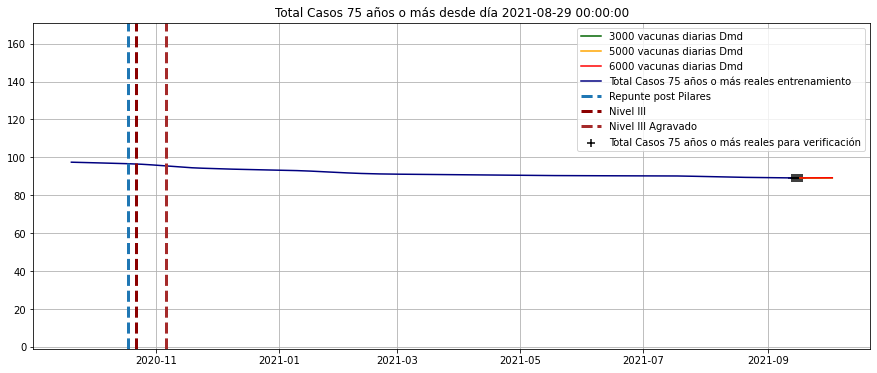

In [73]:
for i in kControl.T.columns:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            rellaxed2.T[[i]].rolling(14).mean(),axes=ax,label='3000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            kControl2.T[[i]].rolling(14).mean(),axes=ax,label='5000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            hard2.T[[i]].rolling(14).mean(),axes=ax,label='6000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc['2020-9-7':].index,
        diario.loc['2020-9-7':,[i]].rolling(14).mean(),axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.legend()
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=-1,top=1.75*X_prima.T.loc['2020-9-7':,i].max())
    plt.grid()
    plt.show()

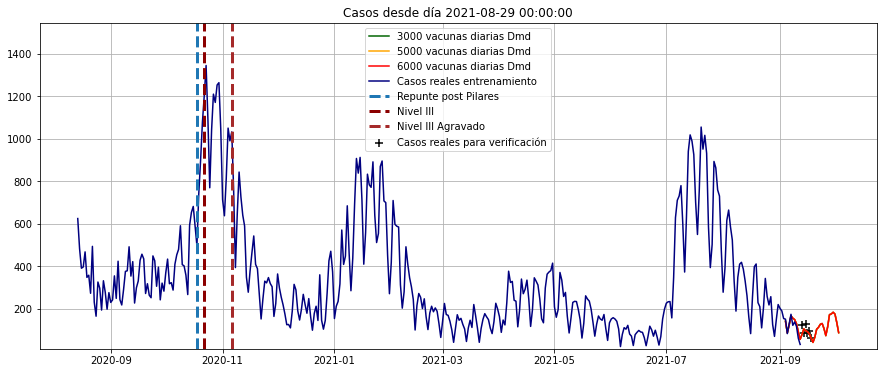

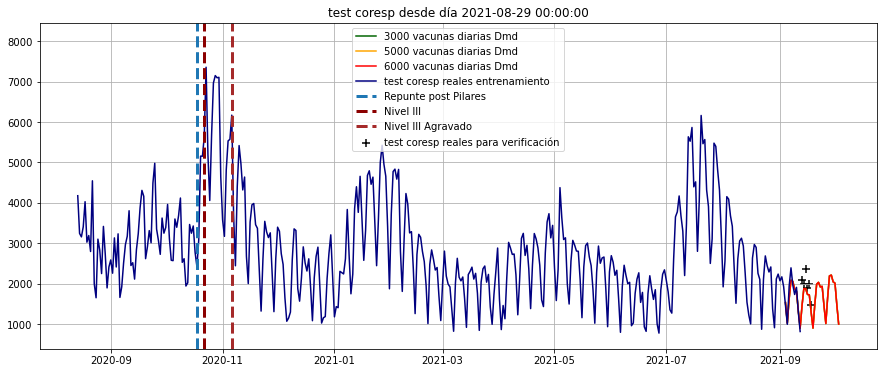

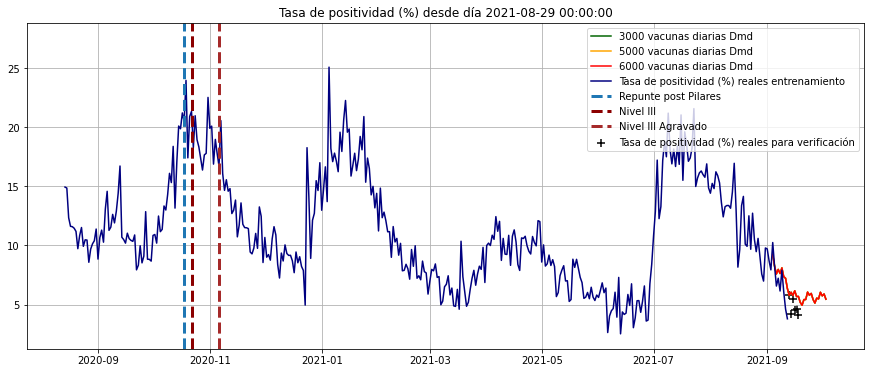

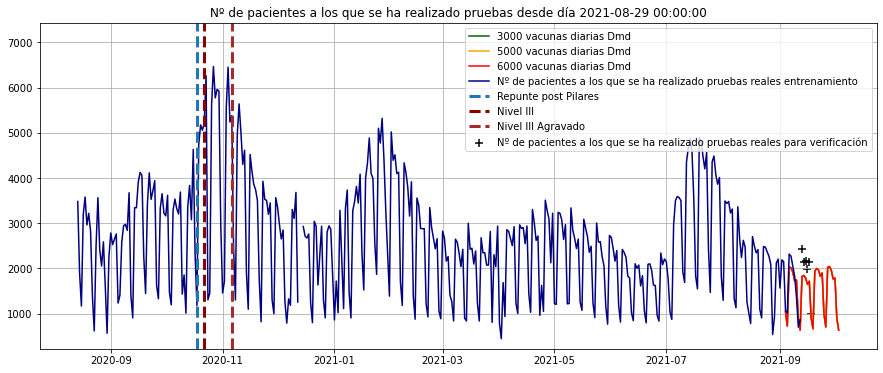

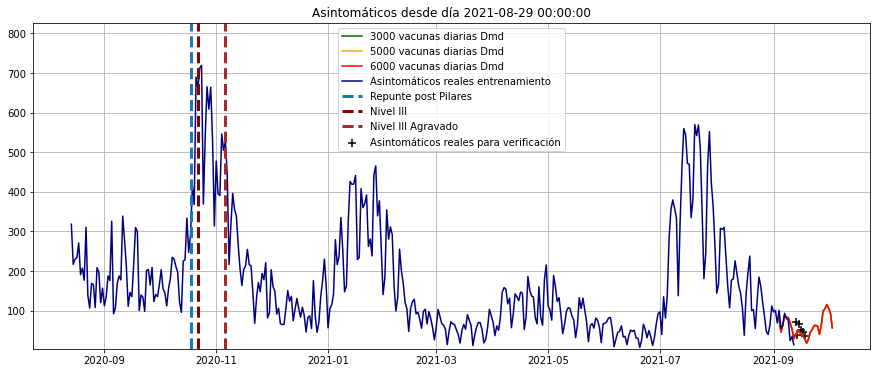

...

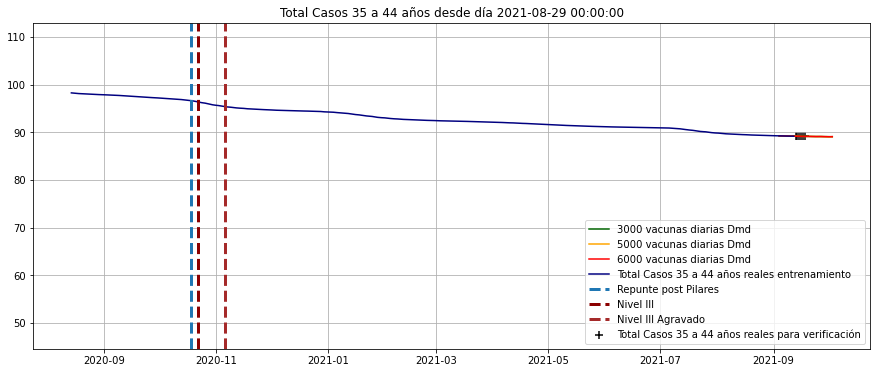

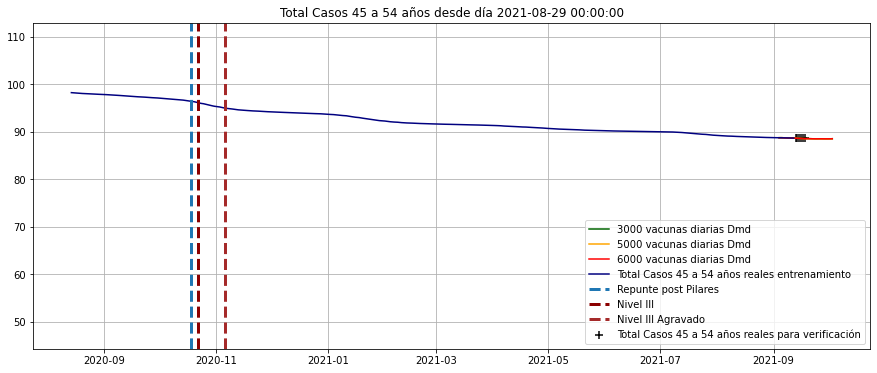

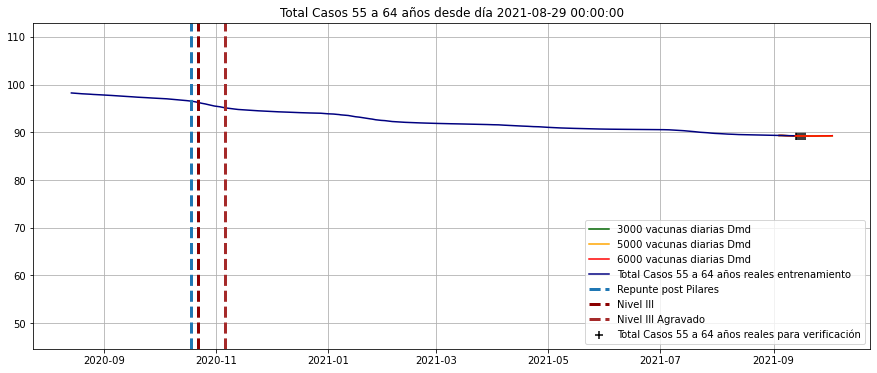

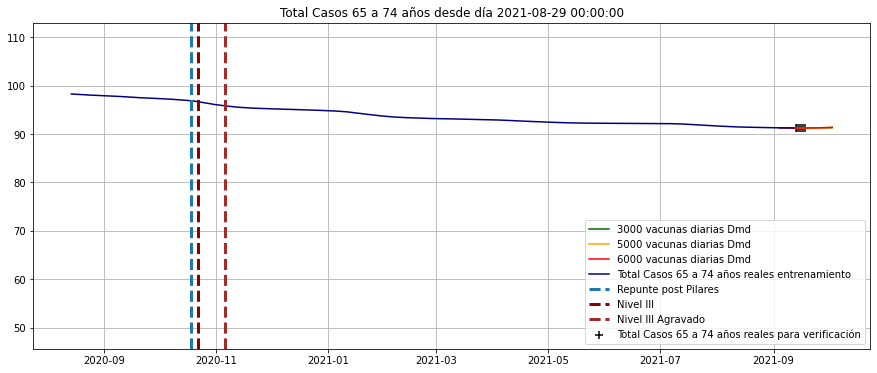

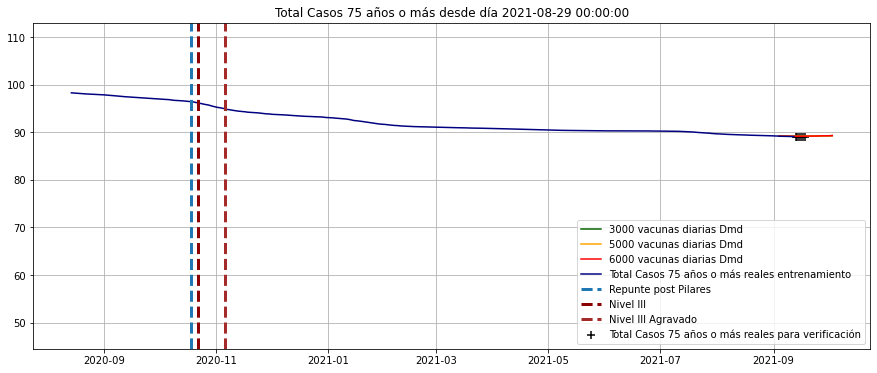

In [74]:
#for i in ['Casos',
#          'test coresp', #'Tasa de positividad (%)',
#          #'Nº de pacientes a los que se ha realizado pruebas', 'Asintomáticos',
#          #'Asintomáticos (%)', 'Zaragoza', 'Zaragoza (%)', '1 a 14 años',
#          #'15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
#          #'55 a 64 años', '65 a 74 años', '75 años o más', 
#          #'Camas Ocup', 'Camas libres', 'Camas (%)', 
#          'UCI ocupadas', 'UCI libres con resp', 'UCI (%)', 
#          #'Rs', 'Rd',
#          #'Inoculados', 'Total Casos'
#         ]:
for i in kControl.T.columns:
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            rellaxed2.T[[i]],axes=ax,label='3000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            kControl2.T[[i]],axes=ax,label='5000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            hard2.T[[i]],axes=ax,label='6000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc[:].index,
        diario.loc[:,[i]],axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc[:].index,
            nuevos.loc[:,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.legend()
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=.5*np.max([0,total.loc[:,i].min()]),top=1.15*total.loc[:,i].max())
    #plt.xlim(left=pd.Timestamp('2021-2'))
    plt.grid()
    plt.show()
  

In [75]:
kControl.T.columns


Index(['Casos', 'test coresp', 'Tasa de positividad (%)',
       'Nº de pacientes a los que se ha realizado pruebas', 'Asintomáticos',
       'Asintomáticos (%)', 'Zaragoza', 'Zaragoza (%)', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'Camas (%)', 'UCI ocupadas', 'UCI libres con resp',
       'UCI (%)', 'Rs', 'Rd', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

In [76]:
entrenoDesde = '2020-08-16'
entrenoDesde = '2021-03-19'
entrenoHasta = '2021-04-29'
#X = Omega.loc[['Casos', 'test coresp', #'Tasa de positividad (%)',
#       'Nº de pacientes a los que se ha realizado pruebas','Asintomáticos (%)']].iloc[:,:nAjuste]
#X.loc['Bias',:] = 1
variablesAjuste = ['Casos', 'test coresp', #'Tasa de positividad (%)',
       'Nº de pacientes a los que se ha realizado pruebas','Asintomáticos (%)',
                   #'UCI ocupadas','Camas Ocup',
                   #'Bias',
                  ]
X_total = total[variablesAjuste].dropna(axis=0).loc[entrenoDesde:].iloc[:-1].T
#X_total.loc['Bias',:] = 1
X = X_total.loc[:,:entrenoHasta]
X

Fecha,2021-03-19,2021-03-20,2021-03-21,2021-03-22,2021-03-23,2021-03-24,2021-03-25,2021-03-26,2021-03-27,2021-03-28,...,2021-04-20,2021-04-21,2021-04-22,2021-04-23,2021-04-24,2021-04-25,2021-04-26,2021-04-27,2021-04-28,2021-04-29
Casos,166.0,108.0,41.0,106.0,149.0,176.0,161.0,148.0,108.0,82.0,...,345.0,329.0,311.0,245.0,152.0,133.0,297.0,362.0,372.0,379.0
test coresp,2256.0,1762.0,844.0,2040.0,2368.0,2437.0,2037.0,2229.0,1422.0,994.0,...,3241.0,3107.0,2884.0,2456.0,1599.0,1433.0,2759.0,3529.0,3732.0,3133.0
Nº de pacientes a los que se ha realizado pruebas,2387.0,1223.0,837.0,2679.0,2347.0,2346.0,2074.0,2074.0,2818.0,808.0,...,3008.0,2619.0,2718.0,963.0,1624.0,1051.0,3510.0,3284.0,3099.0,2125.0
Asintomáticos (%),46.0,58.0,29.0,36.0,39.0,40.0,43.0,35.0,17.0,34.0,...,54.0,46.0,44.0,55.0,54.0,50.0,54.0,23.0,17.0,47.0


In [77]:

X_pinv = pd.DataFrame(np.linalg.pinv(X),columns=X.index,index=X.columns)
X_pinv

,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Asintomáticos (%)
Fecha,,,,
2021-03-19,-0.000652,0.000060,7.254584e-06,0.000328
2021-03-20,-0.000885,0.000108,-4.875047e-05,0.001796
2021-03-21,-0.000479,0.000036,-3.683150e-06,0.001026
2021-03-22,-0.001127,0.000092,3.367971e-05,-0.000366
2021-03-23,-0.001234,0.000166,-2.271591e-05,-0.000903
2021-03-24,-0.000944,0.000135,-2.085278e-05,-0.000761
2021-03-25,-0.000433,0.000038,4.357593e-06,0.000499
2021-03-26,-0.001111,0.000165,-3.183031e-05,-0.001022
2021-03-27,0.000046,-0.000109,1.199182e-04,-0.000126


In [78]:
#X_prima.loc[['Casos']].iloc[:,-nAjuste:]
X_prima_total =total[['Casos']].shift(-1)#.loc[[X.columns],:]
X_prima = X_prima_total.loc[X.columns,['Casos']].T
X_prima

Fecha,2021-03-19,2021-03-20,2021-03-21,2021-03-22,2021-03-23,2021-03-24,2021-03-25,2021-03-26,2021-03-27,2021-03-28,...,2021-04-20,2021-04-21,2021-04-22,2021-04-23,2021-04-24,2021-04-25,2021-04-26,2021-04-27,2021-04-28,2021-04-29
Casos,108.0,41.0,106.0,149.0,176.0,161.0,148.0,108.0,82.0,138.0,...,329.0,311.0,245.0,152.0,133.0,297.0,362.0,372.0,379.0,414.0


In [79]:
A = X_prima.loc[['Casos']].dot( X_pinv)
A

,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Asintomáticos (%)
Casos,1.017083,-0.082718,0.065737,1.055185


In [80]:
#A.dot(pd.DataFrame([372,3732,3099,17,1],index=X.index))
display(total.T.loc[X.index].iloc[:,[-3]])
ultimaPrevision = A.dot(total.T.loc[X.index].iloc[:,[-3]])
ultimaPrevision.columns = ultimaPrevision.columns + pd.Timedelta(1,unit='D')
ultimaPrevision

Fecha,2021-09-18
Casos,61.0
test coresp,1477.0
Nº de pacientes a los que se ha realizado pruebas,994.0
Asintomáticos (%),61.0


Fecha,2021-09-19
Casos,69.576279


In [81]:
def verPrevision(fecha=['2021-05-01'],debug=False,A=A):
    dato = total.T.loc[X.index].loc[:,pd.DatetimeIndex(fecha) - pd.Timedelta(1,unit='D')]
    if debug:
        display(dato.T)
    prevision = A.dot(dato)
    prevision.columns = prevision.columns + pd.Timedelta(1,unit='D')
    prevision.index = ['Casos est. linal']
    return prevision.T
verPrevision(['2021-05-03'])

,Casos est. linal
Fecha,
2021-05-03,177.732637


In [82]:
verPrevision(['2021-04-17','2021-04-18','2021-04-19','2021-04-20'])

,Casos est. linal
Fecha,
2021-04-17,335.316930
2021-04-18,209.537658
2021-04-19,118.774980
2021-04-20,256.495909


In [83]:
Casos = total.loc['2020-08-16':,['Casos']].dropna()
Casos = pd.concat([Casos,verPrevision(Casos.index)],axis=1)
Casos

,Casos,Casos est. linal
Fecha,,
2020-08-16,390.0,394.823012
2020-08-17,396.0,274.475073
2020-08-18,467.0,392.753203
2020-08-19,347.0,438.246145
2020-08-20,357.0,355.354430
...,...,...
2021-09-14,83.0,171.094268
2021-09-15,128.0,107.609195
2021-09-16,86.0,132.889827


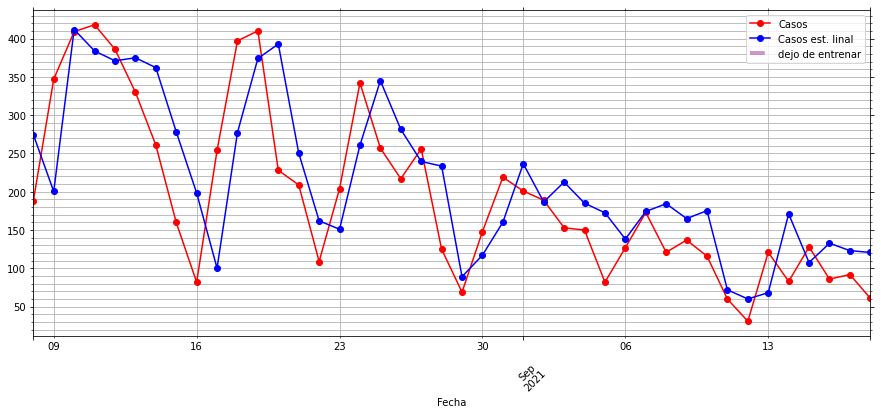

In [84]:
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-42:].plot(color=['r','b'],style='-o',ax=ax)
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

plt.grid(which='both')

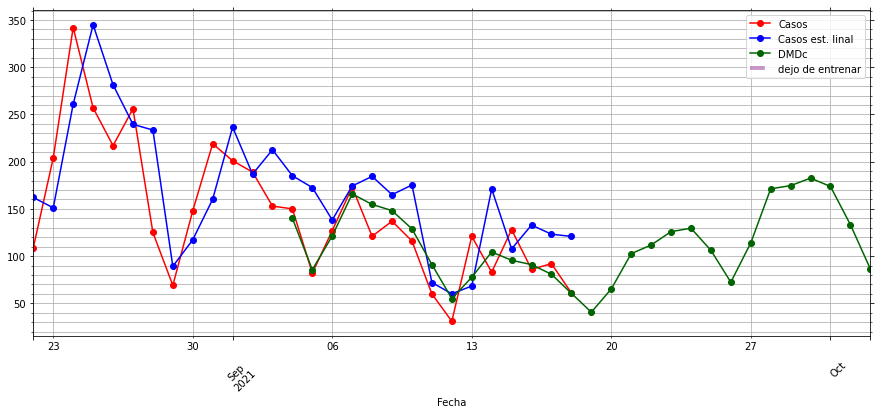

In [85]:
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-28:].plot(color=['r','b'],style='-o',ax=ax)
kControl2.loc['Casos',
              :#Casos.iloc[-42:].index[-1]
             ].iloc[:35].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

plt.grid(which='both')

In [86]:
((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).mean(),\
    ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()

(3.193975241935773, 105.28520301251126)

In [87]:
def estimadorCasos(entrenoDesde = '2021-03-19',entrenoHasta = '2021-04-29',
                  variablesAjuste = [
                      'Casos', 'test coresp', #'Tasa de positividad (%)',
                      'Nº de pacientes a los que se ha realizado pruebas','Asintomáticos (%)',
                      #'Asintomaticos',
                      #'UCI ocupadas','Camas Ocup',
                      #'Bias',
                  ],
                   plot=True,debug=False
                  ):

    X_total = total[variablesAjuste].dropna(axis=0).loc[entrenoDesde:].iloc[:-1].T
    #X_total.loc['Bias',:] = 1
    
    X = X_total.loc[:,:entrenoHasta].copy()
    X = total[variablesAjuste].loc[entrenoDesde:entrenoHasta].dropna(axis=0).T
    if debug:
        display(X_total) 
    X_pinv = pd.DataFrame(np.linalg.pinv(X),columns=X.index,index=X.columns)
    
    X_prima_total =total[['Casos']].shift(-1)#.loc[[X.columns],:]
    X_prima = X_prima_total.loc[X.columns,['Casos']].T
    
    A = X_prima.loc[['Casos']].dot( X_pinv)
    
    Casos = total.loc['2020-08-15':,['Casos']].dropna()
    Casos = pd.concat([Casos,verPrevision(Casos.index,A=A)],axis=1)
    
    if plot:
        fig, ax = plt.subplots(figsize=(15,6))


        Casos.iloc[-30:].plot(color=['r','b'],style='-o',ax=ax)
        plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
        plt.legend()
        ax.tick_params(which='both', # Options for both major and minor ticks
                        top='off', # turn off top ticks
                        left='off', # turn off left ticks
                        right='off',  # turn off right ticks
                        bottom='on') # turn off bottom ticks
        ax.minorticks_on()
        ax.xaxis.set_minor_locator(WeekdayLocator(0))
        plt.xticks(rotation=45)

        plt.grid(which='both')
        plt.show()
        
    error =(Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna().copy()
    #if debug:
    #display(error.mean(),error.std())
    
    return error.mean(),error.std()

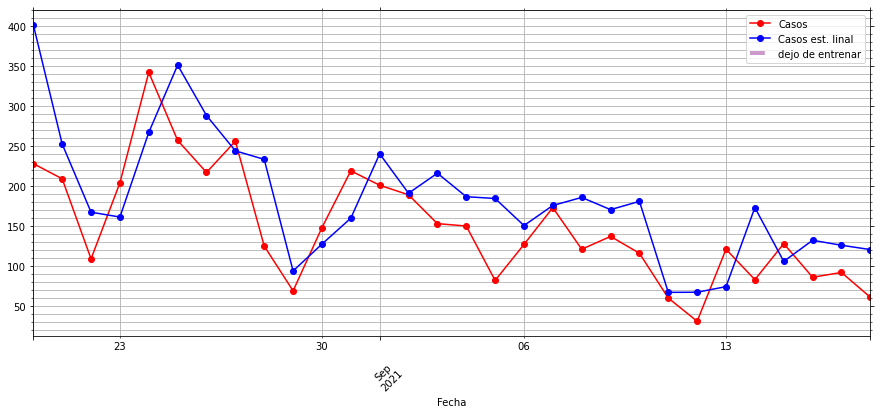

(-1.1049651236842295, 105.27102706011904)

In [88]:
kkk =estimadorCasos(entrenoDesde = '2020-09-22',
    entrenoHasta = '2021-04-29')
kkk

In [89]:
for i in total.iloc[-200:-7].index:
    kkk =estimadorCasos(entrenoDesde = i,
    entrenoHasta = '2021-04-29',plot=False)
    print("{} {} {}".format(i,kkk[0],kkk[1]))

2021-03-05 00:00:00 7.520940915086048 105.221219878172
2021-03-06 00:00:00 7.77083236677028 105.29669802667746
2021-03-07 00:00:00 6.668842960066046 105.41709711137968
2021-03-08 00:00:00 6.475867160427601 105.30977867759819
2021-03-09 00:00:00 6.193669353766155 105.27570349964225
2021-03-10 00:00:00 7.004021235371932 105.4125020154287
2021-03-11 00:00:00 7.2173781357280395 105.48102938930877
2021-03-12 00:00:00 7.474972785397085 105.652244383439
2021-03-13 00:00:00 9.206907226360107 106.24559089963702
2021-03-14 00:00:00 10.285214750851951 106.8058763534746
2021-03-15 00:00:00 9.815756718477141 106.39958606933432
2021-03-16 00:00:00 11.314464254268755 107.09523546265423
2021-03-17 00:00:00 13.746543270612817 108.8524423163082
2021-03-18 00:00:00 5.846760584283861 105.40368772137943
2021-03-19 00:00:00 2.960343077605856 105.2557673094146
2021-03-20 00:00:00 4.917436343017709 105.99855649656509
2021-03-21 00:00:00 8.483904585516642 108.60116905924245
2021-03-22 00:00:00 7.24598609057512

2021-08-04 00:00:00 347.5075376884422 265.7060527954878
2021-08-05 00:00:00 347.5075376884422 265.7060527954878
2021-08-06 00:00:00 347.5075376884422 265.7060527954878
2021-08-07 00:00:00 347.5075376884422 265.7060527954878
2021-08-08 00:00:00 347.5075376884422 265.7060527954878
2021-08-09 00:00:00 347.5075376884422 265.7060527954878
2021-08-10 00:00:00 347.5075376884422 265.7060527954878
2021-08-11 00:00:00 347.5075376884422 265.7060527954878
2021-08-12 00:00:00 347.5075376884422 265.7060527954878
2021-08-13 00:00:00 347.5075376884422 265.7060527954878
2021-08-14 00:00:00 347.5075376884422 265.7060527954878
2021-08-15 00:00:00 347.5075376884422 265.7060527954878
2021-08-16 00:00:00 347.5075376884422 265.7060527954878
2021-08-17 00:00:00 347.5075376884422 265.7060527954878
2021-08-18 00:00:00 347.5075376884422 265.7060527954878
2021-08-19 00:00:00 347.5075376884422 265.7060527954878
2021-08-20 00:00:00 347.5075376884422 265.7060527954878
2021-08-21 00:00:00 347.5075376884422 265.706052

In [90]:
for i in total.iloc[-76:-3].index:
    kkk =estimadorCasos(entrenoDesde = '2021-03-19',
    entrenoHasta = i,plot=False)
    print("{} {} {}".format(i,kkk[0],kkk[1]))

2021-07-07 00:00:00 -5.052319952383759 106.52158134311003
2021-07-08 00:00:00 -8.861052771644319 107.40484326192386
2021-07-09 00:00:00 5.189401389345241 105.374683838811
2021-07-10 00:00:00 10.463918018719985 105.77110547544785
2021-07-11 00:00:00 3.5491093726235476 105.47620075660649
2021-07-12 00:00:00 -4.751908095035225 106.80811894994545
2021-07-13 00:00:00 -9.980076925278217 108.0311697983031
2021-07-14 00:00:00 -8.303536219301133 107.56551619304298
2021-07-15 00:00:00 -8.093969227992696 107.51778468415716
2021-07-16 00:00:00 -1.9744567454149695 106.58557807895488
2021-07-17 00:00:00 -2.7233721032275935 106.41656088589102
2021-07-18 00:00:00 -7.309343179360036 106.36433957518288
2021-07-19 00:00:00 -11.55390257986076 107.61578326688132
2021-07-20 00:00:00 -10.664167341154728 107.38167386569154
2021-07-21 00:00:00 -12.363323815301282 107.8164413701335
2021-07-22 00:00:00 -11.716864775867432 107.65290006204953
2021-07-23 00:00:00 -2.9012770220666773 105.79318170928568
2021-07-24 00

In [91]:
X

Fecha,2021-03-19,2021-03-20,2021-03-21,2021-03-22,2021-03-23,2021-03-24,2021-03-25,2021-03-26,2021-03-27,2021-03-28,...,2021-04-20,2021-04-21,2021-04-22,2021-04-23,2021-04-24,2021-04-25,2021-04-26,2021-04-27,2021-04-28,2021-04-29
Casos,166.0,108.0,41.0,106.0,149.0,176.0,161.0,148.0,108.0,82.0,...,345.0,329.0,311.0,245.0,152.0,133.0,297.0,362.0,372.0,379.0
test coresp,2256.0,1762.0,844.0,2040.0,2368.0,2437.0,2037.0,2229.0,1422.0,994.0,...,3241.0,3107.0,2884.0,2456.0,1599.0,1433.0,2759.0,3529.0,3732.0,3133.0
Nº de pacientes a los que se ha realizado pruebas,2387.0,1223.0,837.0,2679.0,2347.0,2346.0,2074.0,2074.0,2818.0,808.0,...,3008.0,2619.0,2718.0,963.0,1624.0,1051.0,3510.0,3284.0,3099.0,2125.0
Asintomáticos (%),46.0,58.0,29.0,36.0,39.0,40.0,43.0,35.0,17.0,34.0,...,54.0,46.0,44.0,55.0,54.0,50.0,54.0,23.0,17.0,47.0


Fecha,2021-06-13,2021-06-14,2021-06-15,2021-06-16,2021-06-17,2021-06-18,2021-06-19,2021-06-20,2021-06-21,2021-06-22,...,2021-09-04,2021-09-05,2021-09-06,2021-09-07,2021-09-08,2021-09-09,2021-09-10,2021-09-11,2021-09-12,2021-09-13
Casos,26.0,77.0,88.0,97.0,90.0,88.0,63.0,25.0,68.0,117.0,...,150.0,82.0,127.0,173.0,121.0,137.0,116.0,60.0,31.0,121.0
test coresp,1026.0,1759.0,2111.0,2269.0,1537.0,1784.0,932.0,820.0,1752.0,2196.0,...,1463.0,994.0,1934.0,2392.0,1966.0,1732.0,1909.0,1295.0,816.0,2092.0
Nº de pacientes a los que se ha realizado pruebas,845.0,2103.0,2002.0,2075.0,1614.0,1841.0,1073.0,796.0,2091.0,2102.0,...,1070.0,1010.0,2317.0,2272.0,2053.0,1828.0,1366.0,701.0,864.0,2432.0
Asintomáticos (%),54.0,47.0,58.0,49.0,56.0,35.0,48.0,29.0,37.0,56.0,...,67.0,67.0,50.0,54.0,66.0,56.0,21.0,57.0,45.0,58.0
Casos$^{{-\Delta t}}$,70.0,26.0,77.0,88.0,97.0,90.0,88.0,63.0,25.0,68.0,...,153.0,150.0,82.0,127.0,173.0,121.0,137.0,116.0,60.0,31.0
test coresp$^{{-\Delta t}}$,959.0,1026.0,1759.0,2111.0,2269.0,1537.0,1784.0,932.0,820.0,1752.0,...,1927.0,1463.0,994.0,1934.0,2392.0,1966.0,1732.0,1909.0,1295.0,816.0
Nº de pacientes a los que se ha realizado pruebas$^{{-\Delta t}}$,1019.0,845.0,2103.0,2002.0,2075.0,1614.0,1841.0,1073.0,796.0,2091.0,...,2151.0,1070.0,1010.0,2317.0,2272.0,2053.0,1828.0,1366.0,701.0,864.0
Asintomáticos (%)$^{{-\Delta t}}$,50.0,54.0,47.0,58.0,49.0,56.0,35.0,48.0,29.0,37.0,...,45.0,67.0,67.0,50.0,54.0,66.0,56.0,21.0,57.0,45.0
Casos$^{-2\cdot \Delta t}$,80.0,70.0,26.0,77.0,88.0,97.0,90.0,88.0,63.0,25.0,...,189.0,153.0,150.0,82.0,127.0,173.0,121.0,137.0,116.0,60.0
test coresp$^{-2\cdot \Delta t}$,2033.0,959.0,1026.0,1759.0,2111.0,2269.0,1537.0,1784.0,932.0,820.0,...,2169.0,1927.0,1463.0,994.0,1934.0,2392.0,1966.0,1732.0,1909.0,1295.0


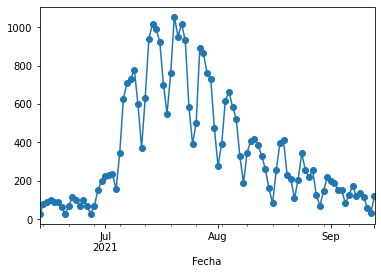

In [92]:
variablesAjuste# = variables
variablesAjuste = ['Casos', 'test coresp', #'Tasa de positividad (%)',
                   'Nº de pacientes a los que se ha realizado pruebas',
                   'Asintomáticos (%)',
                   #'UCI ocupadas','Camas Ocup',
                   #'Bias',
                   #'Inoculados',
                   #'Total Casos',
                  ]
ventana = 14
entrenoDesde = '2021-06-13'
entrenoHasta = '2021-09-13'
X_total = pd.concat([total.loc[:,variablesAjuste],
                    (total[variablesAjuste].shift(1)
                        #- expData.loc[:,np.concatenate([koopman,estado])]
                    ).add_suffix("$^{{-\Delta t}}$")] + 
                   [ (total[variablesAjuste].shift(i+2) 
                     #-  expData.loc[:,np.concatenate([koopman,estado])]
                     ).add_suffix(
                       "$^{{-{}\cdot \Delta t}}$".format(i+2))
                        for i in range(ventana-2)],axis=1).iloc[ventana-1:].dropna().T#2*ventana]
X_prima_total =total.shift(-1)#.loc[[X.columns],:]
X = X.loc[:,entrenoDesde:entrenoHasta]
##X_prima = X_prima_total.loc[X_total.columns,variablesAjuste].dropna().T
#X_prima = X_prima_total.loc[X_total.columns,['Casos']].dropna().T
X_prima = X_prima_total.loc[entrenoDesde:entrenoHasta,['Casos']].dropna().T
X = X_total.loc[:,X_prima.columns]
X.T.Casos.plot(style='-o')
X

In [93]:

X_pinv = pd.DataFrame(np.linalg.pinv(X),columns=X.index,index=X.columns)
X_pinv

,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Asintomáticos (%),Casos$^{{-\Delta t}}$,test coresp$^{{-\Delta t}}$,Nº de pacientes a los que se ha realizado pruebas$^{{-\Delta t}}$,Asintomáticos (%)$^{{-\Delta t}}$,Casos$^{-2\cdot \Delta t}$,test coresp$^{-2\cdot \Delta t}$,...,Nº de pacientes a los que se ha realizado pruebas$^{-11\cdot \Delta t}$,Asintomáticos (%)$^{-11\cdot \Delta t}$,Casos$^{-12\cdot \Delta t}$,test coresp$^{-12\cdot \Delta t}$,Nº de pacientes a los que se ha realizado pruebas$^{-12\cdot \Delta t}$,Asintomáticos (%)$^{-12\cdot \Delta t}$,Casos$^{-13\cdot \Delta t}$,test coresp$^{-13\cdot \Delta t}$,Nº de pacientes a los que se ha realizado pruebas$^{-13\cdot \Delta t}$,Asintomáticos (%)$^{-13\cdot \Delta t}$
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-06-13,-0.000128,0.000070,-0.000067,0.000180,0.000333,-0.000062,0.000037,-0.000085,-0.000330,0.000101,...,2.223875e-05,-0.000487,-0.000123,-0.000025,2.707709e-05,-0.002048,-0.000128,0.000035,0.000047,0.001125
2021-06-14,0.000054,0.000062,0.000004,0.000241,-0.000607,0.000101,-0.000080,0.000758,0.000569,-0.000090,...,-2.013695e-05,-0.001693,-0.000455,-0.000006,3.268069e-05,-0.000669,0.000213,-0.000001,0.000002,-0.003087
2021-06-15,-0.000398,0.000006,-0.000028,0.001361,0.000389,0.000030,0.000033,-0.000862,-0.000500,0.000097,...,2.902803e-05,0.003176,0.000072,0.000042,-2.496809e-05,-0.002054,-0.000180,-0.000029,0.000028,-0.000595
2021-06-16,-0.000202,0.000144,-0.000038,-0.000426,-0.000697,0.000051,-0.000044,0.002144,0.000431,0.000012,...,-1.376692e-05,0.001613,-0.000535,0.000020,3.297583e-05,0.002399,0.000233,-0.000013,0.000005,-0.002542
2021-06-17,0.000308,-0.000052,-0.000063,0.001257,-0.000215,0.000110,-0.000017,-0.000931,-0.000528,0.000067,...,-1.663458e-05,-0.002297,0.000062,0.000061,-4.118107e-05,0.001812,-0.000518,0.000040,0.000038,0.002273
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-09,0.000515,-0.000016,-0.000066,0.003113,-0.000962,-0.000026,0.000090,0.003479,0.000332,0.000004,...,-3.225638e-05,0.001211,-0.000504,0.000058,-1.060508e-04,-0.004247,0.000692,-0.000017,-0.000047,-0.005532
2021-09-10,0.000311,-0.000016,-0.000033,-0.005258,0.000409,-0.000051,-0.000063,0.002718,-0.000679,-0.000015,...,-2.207576e-05,-0.000415,0.000035,0.000105,-4.162635e-05,0.002316,-0.000404,0.000063,-0.000085,-0.004783
2021-09-11,-0.000033,0.000032,-0.000020,0.001145,0.000115,0.000039,-0.000063,-0.004920,0.000295,-0.000068,...,2.205109e-07,0.000235,0.000081,-0.000009,-2.501129e-06,-0.000215,-0.000048,0.000015,0.000002,0.001468


In [94]:
A = X_prima.dot( X_pinv)
A
#X_prima

,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Asintomáticos (%),Casos$^{{-\Delta t}}$,test coresp$^{{-\Delta t}}$,Nº de pacientes a los que se ha realizado pruebas$^{{-\Delta t}}$,Asintomáticos (%)$^{{-\Delta t}}$,Casos$^{-2\cdot \Delta t}$,test coresp$^{-2\cdot \Delta t}$,...,Nº de pacientes a los que se ha realizado pruebas$^{-11\cdot \Delta t}$,Asintomáticos (%)$^{-11\cdot \Delta t}$,Casos$^{-12\cdot \Delta t}$,test coresp$^{-12\cdot \Delta t}$,Nº de pacientes a los que se ha realizado pruebas$^{-12\cdot \Delta t}$,Asintomáticos (%)$^{-12\cdot \Delta t}$,Casos$^{-13\cdot \Delta t}$,test coresp$^{-13\cdot \Delta t}$,Nº de pacientes a los que se ha realizado pruebas$^{-13\cdot \Delta t}$,Asintomáticos (%)$^{-13\cdot \Delta t}$
Casos,1.201746,-0.096848,0.064218,-2.500196,-0.13931,0.021307,-0.080437,0.125455,0.336834,-0.024141,...,-0.009737,-0.811742,0.138636,-0.020775,-0.002996,2.020675,-0.579344,0.082665,-0.013124,1.149015


In [95]:
def verPrevision(fecha=['2021-05-07'],debug=False,A=A,X=X):
    dato = X_total.loc[:,X_total.columns.intersection(pd.DatetimeIndex(fecha) - pd.Timedelta(1,unit='D'))]
    if debug:
        display(dato.T)
    prevision = A.dot(dato)
    prevision.columns = prevision.columns + pd.Timedelta(1,unit='D')
    #prevision.index = ['Casos est. lineal']
    prevision.index = ["{} est. lineal".format(i) for i in prevision.index]
    return prevision.T
verPrevision(A=A,debug=True)

,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Asintomáticos (%),Casos$^{{-\Delta t}}$,test coresp$^{{-\Delta t}}$,Nº de pacientes a los que se ha realizado pruebas$^{{-\Delta t}}$,Asintomáticos (%)$^{{-\Delta t}}$,Casos$^{-2\cdot \Delta t}$,test coresp$^{-2\cdot \Delta t}$,...,Nº de pacientes a los que se ha realizado pruebas$^{-11\cdot \Delta t}$,Asintomáticos (%)$^{-11\cdot \Delta t}$,Casos$^{-12\cdot \Delta t}$,test coresp$^{-12\cdot \Delta t}$,Nº de pacientes a los que se ha realizado pruebas$^{-12\cdot \Delta t}$,Asintomáticos (%)$^{-12\cdot \Delta t}$,Casos$^{-13\cdot \Delta t}$,test coresp$^{-13\cdot \Delta t}$,Nº de pacientes a los que se ha realizado pruebas$^{-13\cdot \Delta t}$,Asintomáticos (%)$^{-13\cdot \Delta t}$
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-05-06,257.0,3093.0,2641.0,48.0,334.0,3634.0,3070.0,48.0,370.0,4377.0,...,1051.0,50.0,152.0,1599.0,1624.0,54.0,245.0,2456.0,963.0,55.0


,Casos est. lineal
Fecha,
2021-05-07,115.319079


In [96]:
Casos =  total.loc[entrenoDesde:,'Casos'].dropna()
#Casos =  total.loc['2021-01':,'Casos'].dropna()


Casos.iloc[5:]

Fecha
2021-06-18     88.0
2021-06-19     63.0
2021-06-20     25.0
2021-06-21     68.0
2021-06-22    117.0
              ...  
2021-09-14     83.0
2021-09-15    128.0
2021-09-16     86.0
2021-09-17     92.0
2021-09-18     61.0
Name: Casos, Length: 93, dtype: float64

In [97]:
verPrevision(Casos.iloc[5:].index,A=A,X=X)

,Casos est. lineal
Fecha,
2021-06-18,87.899426
2021-06-19,78.111255
2021-06-20,-23.694958
2021-06-21,98.779279
2021-06-22,139.053465
...,...
2021-09-14,108.419904
2021-09-15,98.037278
2021-09-16,128.056837


In [98]:
#Casos = total.loc['2020-09-01':,['Casos']].dropna()
Casos = pd.concat([Casos.iloc[5:],verPrevision(Casos.iloc[5:].index,A=A,X=X)],axis=1)
ultimaPrevision = verPrevision(fecha=['2021-09-15'])
Casos.loc[ultimaPrevision.index[0],'Casos est. lineal'] = ultimaPrevision.iat[0,0]
Casos


,Casos,Casos est. lineal
Fecha,,
2021-06-18,88.0,87.899426
2021-06-19,63.0,78.111255
2021-06-20,25.0,-23.694958
2021-06-21,68.0,98.779279
2021-06-22,117.0,139.053465
...,...,...
2021-09-14,83.0,108.419904
2021-09-15,128.0,98.037278
2021-09-16,86.0,128.056837


In [99]:
Casos.index[0]#+ pd.Timedelta(7,unit='D')

Timestamp('2021-06-18 00:00:00')

,Casos,Casos est. lineal,Casos DMDc
2021-09-12,31.0,44.046696,55.011267
2021-09-13,121.0,176.238032,77.555192
2021-09-14,83.0,108.419904,104.356752
2021-09-15,128.0,98.037278,95.581867
2021-09-16,86.0,128.056837,90.972597
2021-09-17,92.0,91.653811,80.781248
2021-09-18,61.0,19.132184,60.617397
2021-09-19,NaN,NaN,40.622690
2021-09-20,NaN,NaN,65.162470
2021-09-21,NaN,NaN,102.595631


(0.6279702626722106, 38.254865345321804)

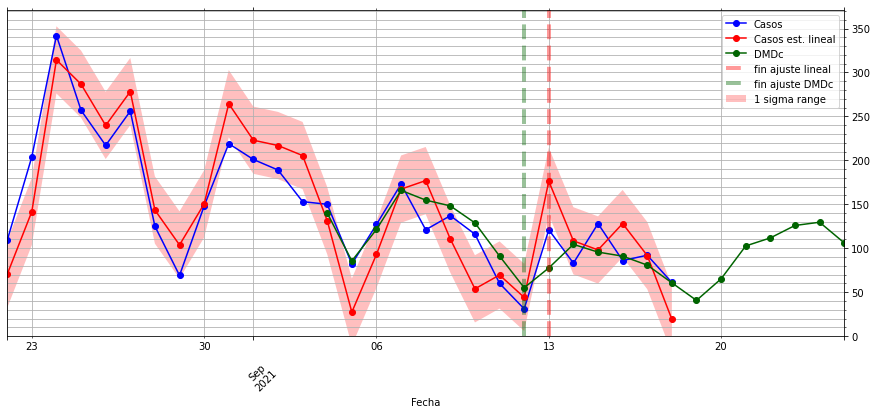

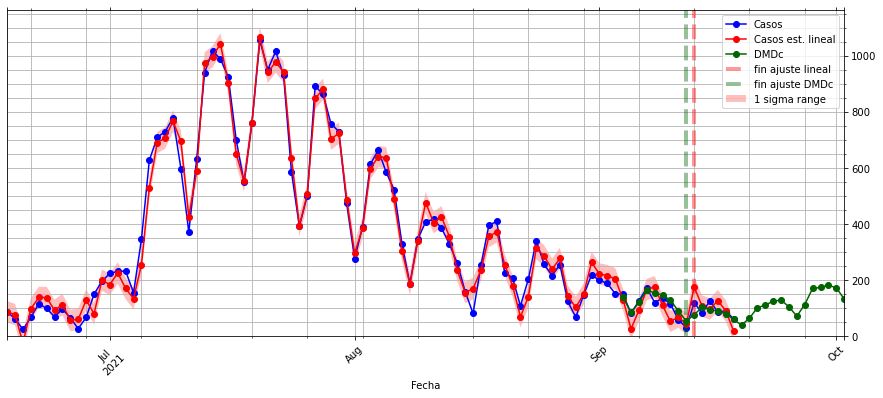

In [100]:
errorSTD = ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-28:].plot(color=['b','r'],style='-o',ax=ax)
kControl2.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(7,unit='D'))#Casos.iloc[-42:].index[-1]
             ].iloc[-35:#:42
                   ].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
ax.fill_between(Casos.iloc[-28:].index, 
                Casos.iloc[-28:]['Casos est. lineal']-errorSTD,
                Casos.iloc[-28:]['Casos est. lineal']+errorSTD, facecolor='red', alpha=0.25,
                label='1 sigma range')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='r',alpha=.4,label='fin ajuste lineal')
plt.axvline(x=diario.index[-1],ls='--',linewidth=4, color='darkgreen',alpha=.4,label='fin ajuste DMDc')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)
ax.set_ylim(bottom=0)

ax.yaxis.tick_right()

plt.grid(which='both')
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-156:].plot(color=['b','r'],style='-o',ax=ax)
kControl2.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(14,unit='D'))#Casos.iloc[-42:].index[-1]
             #].iloc[:15#:42
                   ].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
ax.fill_between(Casos.iloc[-156:].index, 
                Casos.iloc[-156:]['Casos est. lineal']-errorSTD,
                Casos.iloc[-156:]['Casos est. lineal']+errorSTD, facecolor='red', alpha=0.25,
                label='1 sigma range')


plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='r',alpha=.4,label='fin ajuste lineal')
plt.axvline(x=diario.index[-1],ls='--',linewidth=4, color='darkgreen',alpha=.4,label='fin ajuste DMDc')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)
ax.set_ylim(bottom=0)

ax.yaxis.tick_right()

plt.grid(which='both')

Ajustes = pd.concat([Casos,kControl2.T.loc[Casos.index[-7]:,['Casos']].iloc[:11,:].rename(columns={'Casos':'Casos DMDc'})],axis=1).tail(11)
display(Ajustes)
((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).mean(),\
    ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()

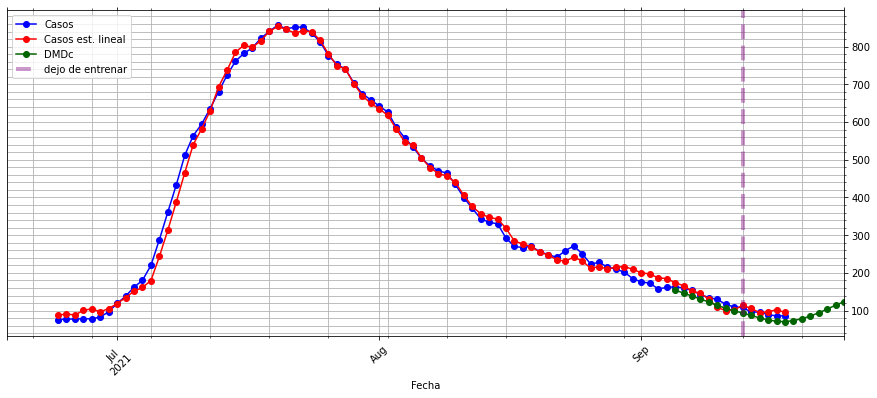

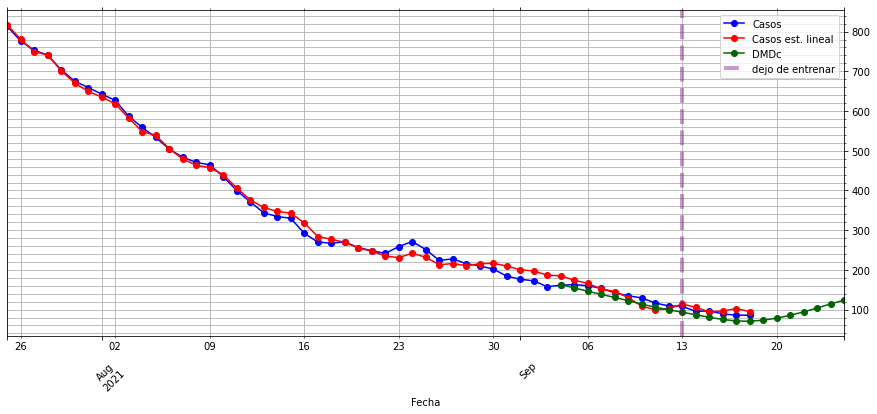

In [101]:
#goto
fig, ax = plt.subplots(figsize=(15,6))


Casos.rolling(7,center=False).mean().iloc[-156:].plot(color=['b','r'],style='-o',ax=ax)
kControl.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(7,unit='D'))#Casos.iloc[-42:].index[-1]
             #].iloc[:15#:42
             ].iloc[-21:].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

ax.yaxis.tick_right()

plt.grid(which='both')
fig, ax = plt.subplots(figsize=(15,6))


Casos.rolling(7,center=False).mean().iloc[-56:].plot(color=['b','r'],style='-o',ax=ax)
kControl.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(7,unit='D'))#Casos.iloc[-42:].index[-1]
             ].iloc[-50:#:42
                   ].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

ax.yaxis.tick_right()

plt.grid(which='both')

In [102]:
((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).mean(),\
    ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()

(0.6279702626722106, 38.254865345321804)

In [103]:
colores = plt.cm.tab20b.colors
colores = dict(zip(U_hat_r.index,plt.cm.tab20b.colors + plt.cm.Pastel1.colors[:6]))

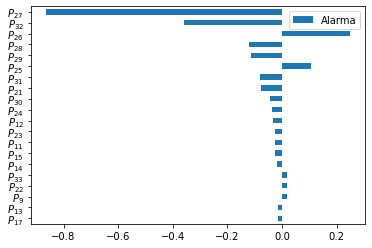

In [104]:
U_tilde_2_r.T.sort_values(by='Alarma',key=abs).tail(20).plot(kind='barh')
plt.show()

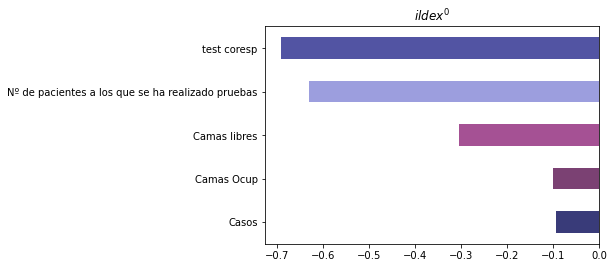

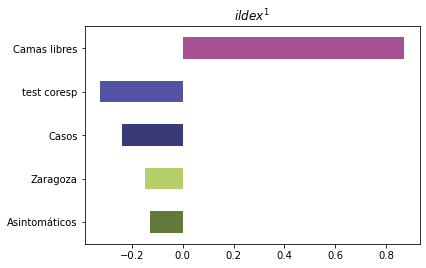

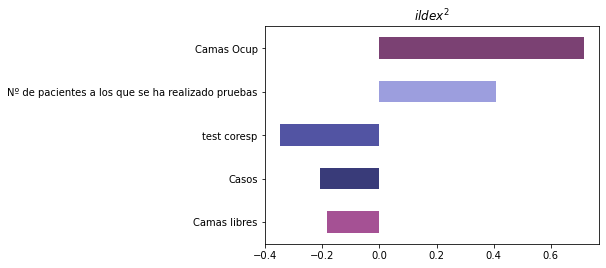

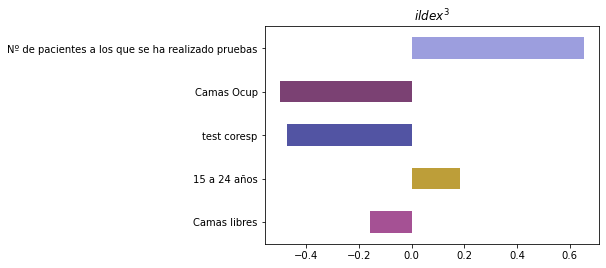

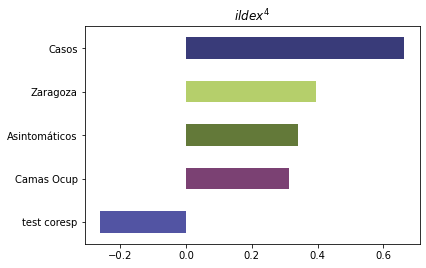

...

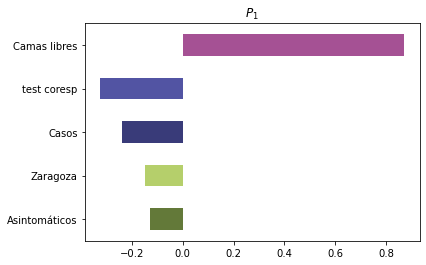

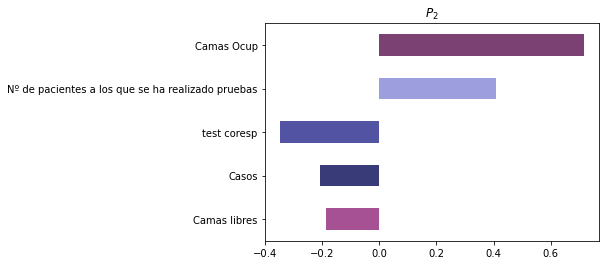

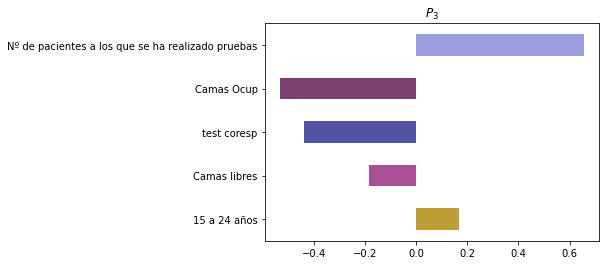

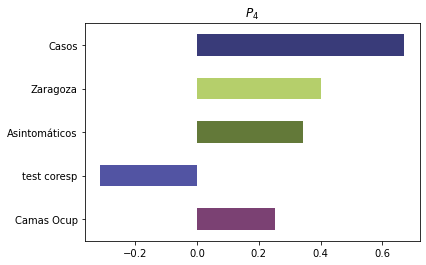

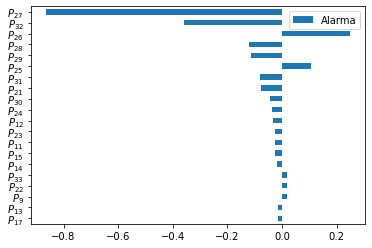

KeyError: 'Total Casos 45 a 54 años'

In [105]:
for i in U_hat_r.columns[:5]: 
    componentes = U_hat_r.T.loc[i].sort_values(key=abs).tail()
    kcolores = [colores[j] for j in componentes.index]
    componentes.plot(kind='barh',color=kcolores)
    plt.title(r'{}'.format(i))
    
    plt.show()
    
for i in U_tilde_1_r.columns[:5]: 
    componentes = U_tilde_1_r.T.loc[i].sort_values(key=abs).tail()
    kcolores = [colores[j] for j in componentes.index]
    componentes.plot(kind='barh',color=kcolores)
    plt.title(r'{}'.format(i))
    
    plt.show()
    
U_tilde_2_r.T.sort_values(by='Alarma',key=abs).tail(20).plot(kind='barh')
plt.show()

for i in U_tilde_2_r.T.sort_values(by='Alarma',key=abs).loc[::-1].head(10).index:
    componentes = U_tilde_1_r.T.loc[i].sort_values(key=abs).tail()
    kcolores = [colores[j] for j in componentes.index]
    componentes.plot(kind='barh',color=kcolores)
    plt.title(r'{}'.format(i))
    
    plt.show()

In [ ]:
diario.Alarma.sort_index(ascending=False).to_excel("kk.xlsx")

In [ ]:
len(fsys_A_tilde.B),len(fsys_A_tilde.B[0])

In [ ]:
ktf= ct.ss2tf(fsys_A_tilde)

In [ ]:
diario.Casos.dtype?


In [ ]:
df = pd.DataFrame(index=[1,2,4])
df

In [ ]:

df.loc[:,'error'] = [[1,2],[2,3],[3,4]]

In [ ]:
df.loc[3,'error'] = range(3)
df

In [ ]:
df.dtypes